In [ ]:
import pip
pip.main(['install', 'pandas'])
pip.main(['install', 'matplotlib'])
pip.main(['install', 'seaborn'])
pip.main(['install', 'scikit-learn'])
!pip.main(['install', 'nbmerge'])
pip.main(['install', 'nbformat'])
!pip install nbformat ipynb-py-convert

IMPORTATION DES BIBLIOTHÈQUES

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import missingno as msno
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import MissingIndicator, KNNImputer,SimpleImputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder

CHARGEMENT DES DONNÉES

In [3]:
BOTANIC_F="C:\\Users\\belga\\OneDrive\\Bureau\\EMBA Big Data\\Module Datascience\\Projet Data Science S2 2024\\BOTANIC.pkl"
df_BOTANIC_F=pd.read_pickle(BOTANIC_F)

In [4]:
df_BOTANIC_F

,IDCLIENT,MAGASIN,DATEREADHESION,SEXE,AGE_GROUP,ANCIENNETE_ADHESION_CAT,ANCIENNETE_READ,VILLE,LIBELLEDEPARTEMENT,LIBELLEREGIONCOMMERCIALE,...,Nb_Univers,UNIVERS_PREFERE,NBRE_COMMANDE_2016,TOTAL_ACHAT_2016,PREMIERE_COMMANDE_2016,DERNIERE_COMMANDE_2016,ANCIENNETE_1ERE_CDE_2016,ANCIENNETE_DERNIERE_CDE_2016,TEMPS_MOY_CDE_2016,FREQ_COMMANDE_2016
0,10000.0,PRI,2017-05-11,FEMME,Inconnue,8 ans+,6-8 mois,SAINT-PRIEST,69,Rhône-Alpes,...,7,0,60,1936.76,2016-01-20,2016-11-20,346,41.0,5.169492,0.126085
1,10000.0,PRI,2017-05-11,FEMME,Inconnue,8 ans+,6-8 mois,SAINT-PRIEST,69,Rhône-Alpes,...,7,0,60,1936.76,2016-01-20,2016-11-20,346,41.0,5.169492,0.126085
2,10000.0,PRI,2017-05-11,FEMME,Inconnue,8 ans+,6-8 mois,SAINT-PRIEST,69,Rhône-Alpes,...,7,0,60,1936.76,2016-01-20,2016-11-20,346,41.0,5.169492,0.126085
3,10000.0,PRI,2017-05-11,FEMME,Inconnue,8 ans+,6-8 mois,SAINT-PRIEST,69,Rhône-Alpes,...,7,0,60,1936.76,2016-01-20,2016-11-20,346,41.0,5.169492,0.126085
4,10000.0,PRI,2017-05-11,FEMME,Inconnue,8 ans+,6-8 mois,SAINT-PRIEST,69,Rhône-Alpes,...,7,0,60,1936.76,2016-01-20,2016-11-20,346,41.0,5.169492,0.126085
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408787,99986.0,MUL,2017-10-27,FEMME,AGE DE 61-100,8 ans+,0-4 mois,MULHOUSE,68,Alsace-Est,...,9,0,12,1739.20,2016-04-14,2016-12-08,261,23.0,21.636364,0.940711
7408788,99986.0,MUL,2017-10-27,FEMME,AGE DE 61-100,8 ans+,0-4 mois,MULHOUSE,68,Alsace-Est,...,9,0,12,1739.20,2016-04-14,2016-12-08,261,23.0,21.636364,0.940711
7408789,99986.0,MUL,2017-10-27,FEMME,AGE DE 61-100,8 ans+,0-4 mois,MULHOUSE,68,Alsace-Est,...,9,0,12,1739.20,2016-04-14,2016-12-08,261,23.0,21.636364,0.940711
7408790,99986.0,MUL,2017-10-27,FEMME,AGE DE 61-100,8 ans+,0-4 mois,MULHOUSE,68,Alsace-Est,...,9,0,12,1739.20,2016-04-14,2016-12-08,261,23.0,21.636364,0.940711


In [5]:
df_BOTANIC_F.shape

(7408792, 33)

In [6]:
df_BOTANIC_F.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7408792 entries, 0 to 7408791
Data columns (total 33 columns):
 #   Column                        Dtype         
---  ------                        -----         
 0   IDCLIENT                      object        
 1   MAGASIN                       object        
 2   DATEREADHESION                datetime64[ns]
 3   SEXE                          object        
 4   AGE_GROUP                     object        
 5   ANCIENNETE_ADHESION_CAT       category      
 6   ANCIENNETE_READ               category      
 7   VILLE                         object        
 8   LIBELLEDEPARTEMENT            object        
 9   LIBELLEREGIONCOMMERCIALE      object        
 10  IDTICKET                      object        
 11  TIC_DATE                      datetime64[ns]
 12  TIC_TOTALTTC                  float64       
 13  FREQ_MAG                      int64         
 14  TYPE_UNIVERS                  object        
 15  CODEUNIVERS                   in

In [7]:
df_BOTANIC_F.drop(columns=['PREMIERE_COMMANDE_2016'], inplace=True)

In [8]:
#Mise au format du LIBELLEDEPARTEMENT
df_BOTANIC_F['LIBELLEDEPARTEMENT'] = df_BOTANIC_F['LIBELLEDEPARTEMENT'].astype(np.int64)


In [9]:
df_BOTANIC_F.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7408792 entries, 0 to 7408791
Data columns (total 32 columns):
 #   Column                        Dtype         
---  ------                        -----         
 0   IDCLIENT                      object        
 1   MAGASIN                       object        
 2   DATEREADHESION                datetime64[ns]
 3   SEXE                          object        
 4   AGE_GROUP                     object        
 5   ANCIENNETE_ADHESION_CAT       category      
 6   ANCIENNETE_READ               category      
 7   VILLE                         object        
 8   LIBELLEDEPARTEMENT            int64         
 9   LIBELLEREGIONCOMMERCIALE      object        
 10  IDTICKET                      object        
 11  TIC_DATE                      datetime64[ns]
 12  TIC_TOTALTTC                  float64       
 13  FREQ_MAG                      int64         
 14  TYPE_UNIVERS                  object        
 15  CODEUNIVERS                   in

In [ ]:
# Conversion de la colonne 'IDTICKET' au type 'int'
#df_BOTANIC_F['IDTICKET'] = df_BOTANIC_F['IDTICKET'].astype('int')

In [11]:
# Conversion de la colonne 'IDCLIENT' au type 'int'
df_BOTANIC_F['IDCLIENT'] = df_BOTANIC_F['IDCLIENT'].astype('float')

In [12]:
# Conversion de la colonne 'ANCIENNETE_READ_CAT' au type 'object'
df_BOTANIC_F['ANCIENNETE_READ'] = df_BOTANIC_F['ANCIENNETE_READ'].astype('object')

In [13]:
# Conversion de la colonne 'ANCIENNETE_ADHESION_CAT' au type 'object'
df_BOTANIC_F['ANCIENNETE_ADHESION_CAT'] = df_BOTANIC_F['ANCIENNETE_ADHESION_CAT'].astype('object')

Vérification du traitement

In [14]:
df_BOTANIC_F.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7408792 entries, 0 to 7408791
Data columns (total 32 columns):
 #   Column                        Dtype         
---  ------                        -----         
 0   IDCLIENT                      float64       
 1   MAGASIN                       object        
 2   DATEREADHESION                datetime64[ns]
 3   SEXE                          object        
 4   AGE_GROUP                     object        
 5   ANCIENNETE_ADHESION_CAT       object        
 6   ANCIENNETE_READ               object        
 7   VILLE                         object        
 8   LIBELLEDEPARTEMENT            int64         
 9   LIBELLEREGIONCOMMERCIALE      object        
 10  IDTICKET                      object        
 11  TIC_DATE                      datetime64[ns]
 12  TIC_TOTALTTC                  float64       
 13  FREQ_MAG                      int64         
 14  TYPE_UNIVERS                  object        
 15  CODEUNIVERS                   in

In [15]:
df_BOTANIC_F.shape

(7408792, 32)

DÉFINITION DES VARIABLES CATÉGORIELLES

In [16]:
# Importer la librairie pandas
import pandas as pd

# Définition des variables catégorielles
var_cat = df_BOTANIC_F.select_dtypes(include=['object']).columns.tolist()
print(var_cat)

['MAGASIN', 'SEXE', 'AGE_GROUP', 'ANCIENNETE_ADHESION_CAT', 'ANCIENNETE_READ', 'VILLE', 'LIBELLEREGIONCOMMERCIALE', 'IDTICKET', 'TYPE_UNIVERS']


In [17]:
df_BOTANIC_F['ANCIENNETE_ADHESION_CAT'].value_counts()

ANCIENNETE_ADHESION_CAT
8 ans+     3496980
5-8 ans    1638436
3-5 ans    1241168
2-3 ans    1031192
0-1 an         584
1-2 ans        432
Name: count, dtype: int64

Il convient de regrouper les deux dernières modalités 

In [18]:
#regroupement des modalités:
df_BOTANIC_F['ANCIENNETE_ADHESION_CAT']=np.where(df_BOTANIC_F['ANCIENNETE_ADHESION_CAT'] =='0-1 an', '0-2 ans', df_BOTANIC_F['ANCIENNETE_ADHESION_CAT']) 
df_BOTANIC_F['ANCIENNETE_ADHESION_CAT']=np.where(df_BOTANIC_F['ANCIENNETE_ADHESION_CAT'] =='1-2 ans', '0-2 ans', df_BOTANIC_F['ANCIENNETE_ADHESION_CAT'])

Vérification du traitement

In [19]:
df_BOTANIC_F['ANCIENNETE_ADHESION_CAT'].value_counts()

ANCIENNETE_ADHESION_CAT
8 ans+     3496980
5-8 ans    1638436
3-5 ans    1241168
2-3 ans    1031192
0-2 ans       1016
Name: count, dtype: int64

In [20]:
df_BOTANIC_F['ANCIENNETE_READ'].value_counts()

ANCIENNETE_READ
0-4 mois     2719520
6-8 mois     1728268
8-10 mois    1363032
4-6 mois     1000816
10+ mois      597156
Name: count, dtype: int64

In [21]:
df_BOTANIC_F['MAGASIN'].value_counts()

MAGASIN
HEI    262496
SEY    259420
SSM    225720
BEA    221048
MOB    217164
        ...  
SCH     26244
RMA     25164
SAL     19632
BAR     15692
EST      3484
Name: count, Length: 67, dtype: int64

In [22]:
df_BOTANIC_F['SEXE'].value_counts()

SEXE
FEMME    4171080
HOMME    3237712
Name: count, dtype: int64

In [23]:
df_BOTANIC_F['AGE_GROUP'].value_counts()

AGE_GROUP
Inconnue         3368624
AGE DE 61-100    1480004
AGE DE 46-60     1384800
AGE DE 31-45      927688
AGE DE 18-30      247676
Name: count, dtype: int64

In [24]:
df_BOTANIC_F['VILLE'].value_counts()

VILLE
HEILLECOURT                    262496
SEYSSINS                       259420
LA SEYNE-SUR-MER               225720
BEAUMONT                       221048
MONTBONNOT-SAINT-MARTIN        217164
                                ...  
SCHWEIGHOUSE-SUR-MODER          26244
RUEIL MALMAISON                 25164
SALLANCHES                      19632
BARCELONNETTE                   15692
ST JULIEN EN GENEVOIS CEDEX      3484
Name: count, Length: 67, dtype: int64

In [25]:
df_BOTANIC_F['LIBELLEREGIONCOMMERCIALE'].value_counts()

LIBELLEREGIONCOMMERCIALE
Rhône-Alpes       2771048
Littoral          1989912
Alsace-Est        1354852
Centre-Paris      1289496
Vente en ligne       3484
Name: count, dtype: int64

In [26]:
df_BOTANIC_F['TYPE_UNIVERS'].value_counts()

TYPE_UNIVERS
UNIVERS_U1    1852198
UNIVERS_U2    1852198
UNIVERS_U3    1852198
UNIVERS_U4    1852198
Name: count, dtype: int64

DÉFINITION DES VARIABLES QUANTITATIVES

In [27]:
# Importer la librairie pandas
import pandas as pd

# Définition des variables quantitatives
var_quan = df_BOTANIC_F.select_dtypes(include=['int64','float64']).columns.tolist()
print(var_quan)

['IDCLIENT', 'LIBELLEDEPARTEMENT', 'TIC_TOTALTTC', 'FREQ_MAG', 'Quantite', 'NBRE_ARTICLE', 'NBRE_FAM_ARTICLE', 'TOTAL_REMISE', 'MONTANT_TOTAL', 'MARGE', 'Variete_Panier', 'Nb_Univers', 'NBRE_COMMANDE_2016', 'TOTAL_ACHAT_2016', 'ANCIENNETE_1ERE_CDE_2016', 'ANCIENNETE_DERNIERE_CDE_2016', 'TEMPS_MOY_CDE_2016', 'FREQ_COMMANDE_2016']


CONSTRUCTION DU LABEL Y

EXPLICATION DU CHOIX DES VARIABLES DANS LA CONSTRUCTION DE Y

-Première Condition : 'FREQ_COMMANDE_2016' > 1

Cette condition permet d'identifier les clients qui ont passé plus d'une commande dans le passé. 
Les clients qui passent plusieurs commandes sont généralement considérés comme plus engagés et fidèles. 
Si ces clients cessent subitement leurs achats, cela pourrait indiquer un problème potentiel, d'où la nécessité de surveiller ces clients plus attentivement.

-Deuxième Condition : Pas de Commande en 2017

Cette condition vérifie si un client n'a pas complété d'achat au cours de l'année 2017. 
La non-réalisation d'achats pendant une période significative peut indiquer que le client a cessé d'acheter pour une raison quelconque.

Pourquoi l'année 2017?

Il est important d'examiner un intervalle de temps suffisamment long pour déterminer si le manque d'activité est un comportement aberrant ou un signe d'attrition réelle. 2017 est utilisée ici comme période de référence.

In [28]:
#Pour le client soit 'Attritionniste' il faut vérifier deux conditions:
# Première condition : FREQ_COMMANDE_2016 < 1
# Convertir 'DATE_DERNIERE_COMMANDE' en datetime
df_BOTANIC_F['DERNIERE_COMMANDE_2016'] = pd.to_datetime(df_BOTANIC_F['DERNIERE_COMMANDE_2016'])

# Première condition : FREQ_COMMANDE_2016 < 1
condition_1 = df_BOTANIC_F['FREQ_COMMANDE_2016'] > 1

# Deuxième condition : Pas de commande en 2017
condition_2 = df_BOTANIC_F['DERNIERE_COMMANDE_2016'].dt.year != 2017

# Colonne 'ATTRITION' indiquant si le client est attritionniste
df_BOTANIC_F['ATTRITION'] = (condition_1 & condition_2).astype(int)

# Afficher le DataFrame final
print(df_BOTANIC_F)

         IDCLIENT MAGASIN DATEREADHESION   SEXE      AGE_GROUP  \
0         10000.0     PRI     2017-05-11  FEMME       Inconnue   
1         10000.0     PRI     2017-05-11  FEMME       Inconnue   
2         10000.0     PRI     2017-05-11  FEMME       Inconnue   
3         10000.0     PRI     2017-05-11  FEMME       Inconnue   
4         10000.0     PRI     2017-05-11  FEMME       Inconnue   
...           ...     ...            ...    ...            ...   
7408787   99986.0     MUL     2017-10-27  FEMME  AGE DE 61-100   
7408788   99986.0     MUL     2017-10-27  FEMME  AGE DE 61-100   
7408789   99986.0     MUL     2017-10-27  FEMME  AGE DE 61-100   
7408790   99986.0     MUL     2017-10-27  FEMME  AGE DE 61-100   
7408791   99986.0     MUL     2017-10-27  FEMME  AGE DE 61-100   

        ANCIENNETE_ADHESION_CAT ANCIENNETE_READ         VILLE  \
0                        8 ans+        6-8 mois  SAINT-PRIEST   
1                        8 ans+        6-8 mois  SAINT-PRIEST   
2           

Combinaison des Deux Conditions
Pour qu'un client soit marqué comme attritionniste (ATTRITION = 1):
Le client doit avoir passé plus d'une commande (indique un engagement initial important)
Le client n'a pas passé de commande en 2017 (indique un désengagement significatif)

In [29]:
df_BOTANIC_F['ATTRITION'] = df_BOTANIC_F['ATTRITION'].map({0: 'non_attritionniste', 1: 'attritionniste'})

In [30]:
df_BOTANIC_F['ATTRITION']

0          non_attritionniste
1          non_attritionniste
2          non_attritionniste
3          non_attritionniste
4          non_attritionniste
                  ...        
7408787    non_attritionniste
7408788    non_attritionniste
7408789    non_attritionniste
7408790    non_attritionniste
7408791    non_attritionniste
Name: ATTRITION, Length: 7408792, dtype: object

In [31]:
df_BOTANIC_F['ATTRITION'].value_counts()

ATTRITION
non_attritionniste    6337476
attritionniste        1071316
Name: count, dtype: int64

In [32]:
#Pourcentage des clients attritionnistes
Pourcentage = df_BOTANIC_F['ATTRITION'].value_counts(normalize=True)*100

Pourcentage

ATTRITION
non_attritionniste    85.539937
attritionniste        14.460063
Name: proportion, dtype: float64

In [33]:
#Nombre de clients attritionnistes
Nombre_de_clients=df_BOTANIC_F['ATTRITION'].value_counts()
Nombre_de_clients

ATTRITION
non_attritionniste    6337476
attritionniste        1071316
Name: count, dtype: int64

On a 6332912 soit 85.5% des clients qui ne sont pas attritionnistes.

On a 1075880 soit 14.5% des clients qui peuvent aller à la concurrence

In [34]:
df_BOTANIC_F.drop(columns=['TIC_DATE'], inplace=True)

In [35]:
df_BOTANIC_F.drop(columns=['DATEREADHESION'], inplace=True)

In [36]:
df_BOTANIC_F.drop(columns=['IDCLIENT'], inplace=True)

In [37]:
df_BOTANIC_F.drop(columns=['IDTICKET'], inplace=True)

In [38]:
df_BOTANIC_F.drop(columns=['DERNIERE_COMMANDE_2016'], inplace=True)

In [39]:
df_BOTANIC_F.drop(columns=['CODEUNIVERS'], inplace=True)

In [40]:
df_BOTANIC_F.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7408792 entries, 0 to 7408791
Data columns (total 27 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   MAGASIN                       object 
 1   SEXE                          object 
 2   AGE_GROUP                     object 
 3   ANCIENNETE_ADHESION_CAT       object 
 4   ANCIENNETE_READ               object 
 5   VILLE                         object 
 6   LIBELLEDEPARTEMENT            int64  
 7   LIBELLEREGIONCOMMERCIALE      object 
 8   TIC_TOTALTTC                  float64
 9   FREQ_MAG                      int64  
 10  TYPE_UNIVERS                  object 
 11  Quantite                      float64
 12  NBRE_ARTICLE                  int64  
 13  NBRE_FAM_ARTICLE              int64  
 14  TOTAL_REMISE                  float64
 15  MONTANT_TOTAL                 float64
 16  MARGE                         float64
 17  Variete_Panier                int64  
 18  Nb_Univers            

SÉPARATION DES FEATURES ET DU LABEL

In [41]:
# Diviser le dataframe en x et y
X_BOTANIC = df_BOTANIC_F.drop('ATTRITION', axis=1)
Y = df_BOTANIC_F['ATTRITION']

In [42]:
X_BOTANIC.isnull().sum().sum()

0

In [43]:
X_BOTANIC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7408792 entries, 0 to 7408791
Data columns (total 26 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   MAGASIN                       object 
 1   SEXE                          object 
 2   AGE_GROUP                     object 
 3   ANCIENNETE_ADHESION_CAT       object 
 4   ANCIENNETE_READ               object 
 5   VILLE                         object 
 6   LIBELLEDEPARTEMENT            int64  
 7   LIBELLEREGIONCOMMERCIALE      object 
 8   TIC_TOTALTTC                  float64
 9   FREQ_MAG                      int64  
 10  TYPE_UNIVERS                  object 
 11  Quantite                      float64
 12  NBRE_ARTICLE                  int64  
 13  NBRE_FAM_ARTICLE              int64  
 14  TOTAL_REMISE                  float64
 15  MONTANT_TOTAL                 float64
 16  MARGE                         float64
 17  Variete_Panier                int64  
 18  Nb_Univers            

VISUALISATION DE L'ÉCHANTILLON

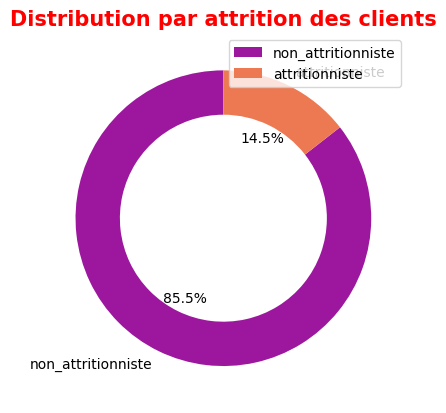

In [44]:
# Calculez les pourcentages de chaque catégorie avec leurs labels
Pourcentage = df_BOTANIC_F['ATTRITION'].value_counts(normalize=True) * 100
Labels = df_BOTANIC_F['ATTRITION'].value_counts(normalize=True).index

# Définir les couleurs de la palette
palette_colors = sns.color_palette("plasma", len(Labels))

# Créer un graphique en donut
fig, ax = plt.subplots()
wedges, texts, autotexts = ax.pie(
    Pourcentage, 
    labels=Labels, 
    autopct='%.1f%%',
    startangle=90, 
    colors=palette_colors, 
    wedgeprops=dict(width=0.3)
)

# Définir les propriétés du texte
for text in texts + autotexts:
    text.set_color('black')
# Ajout de la légende
plt.legend()
# Ajouter un titre
ax.set_title("Distribution par attrition des clients", fontsize=15, color='red', fontweight='bold')

# Afficher le graphique
plt.show()

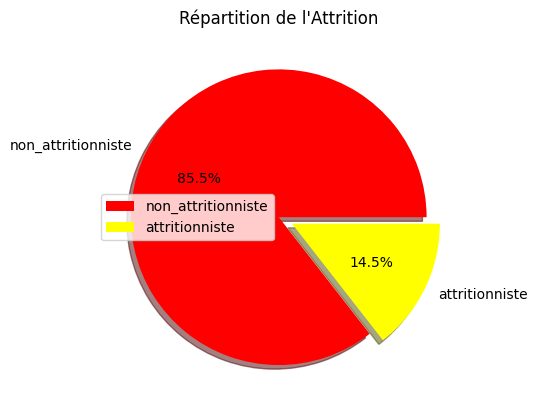

In [45]:
import matplotlib.pyplot as plt

# Calculez les pourcentages de chaque catégorie avec leurs labels
pourcentage = df_BOTANIC_F['ATTRITION'].value_counts(normalize=True) * 100
labels = df_BOTANIC_F['ATTRITION'].value_counts(normalize=True).index

# Créer le graphique en secteur
plt.pie(pourcentage[:3], 
        labels=labels[:3],
        colors=['red', 'yellow'],
        explode=[0, 0.1],
        autopct='%1.1f%%',
        shadow=True)

# Ajout de la légende
plt.legend()
plt.title('Répartition de l\'Attrition')
plt.show()

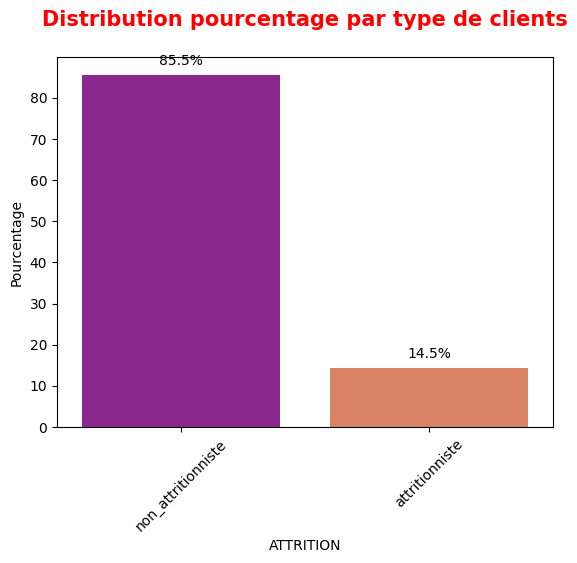

In [46]:
# Calculez les pourcentages de chaque catégorie avec leurs labels
Pourcentage = df_BOTANIC_F['ATTRITION'].value_counts(normalize=True) * 100
Labels = df_BOTANIC_F['ATTRITION'].value_counts(normalize=True).index

# Créez un DataFrame à partir des pourcentages pour pouvoir l'utiliser avec Seaborn
df_pourcentage = pd.DataFrame({
    'ATTRITION': Labels,
    'Pourcentage': Pourcentage
})

# Définir les couleurs de la palette
palette = sns.color_palette("plasma", len(Labels))

# Tracé du graphique à barres avec les pourcentages, définissant `ATTRITION` en tant que 'hue'
ax = sns.barplot(x='ATTRITION', y='Pourcentage', data=df_pourcentage, hue='ATTRITION', palette=palette, dodge=False)

# Ajuster l'orientation des étiquettes en X à 45 degrés
plt.xticks(rotation=45)

# Ajouter des étiquettes pour les pourcentages sur les barres
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f%%', label_type="edge", padding=5)

# Ajouter le titre
ax.set_title("Distribution pourcentage par type de clients\n", fontsize=15, color='red', fontweight='bold')

# Vérifier si une légende existe avant de tenter de la supprimer
if ax.get_legend() is not None:
    ax.get_legend().remove()  # Enlever la légende car elle n'est pas nécessaire ici.

# Afficher le graphique
plt.show()

IDENTIFICATION DES VARIABLES FORTEMENT CORRÉLÉES ENTRE ELLES

CORRÉLATION ENTRE LES VARIABLES NUMÉRIQUES

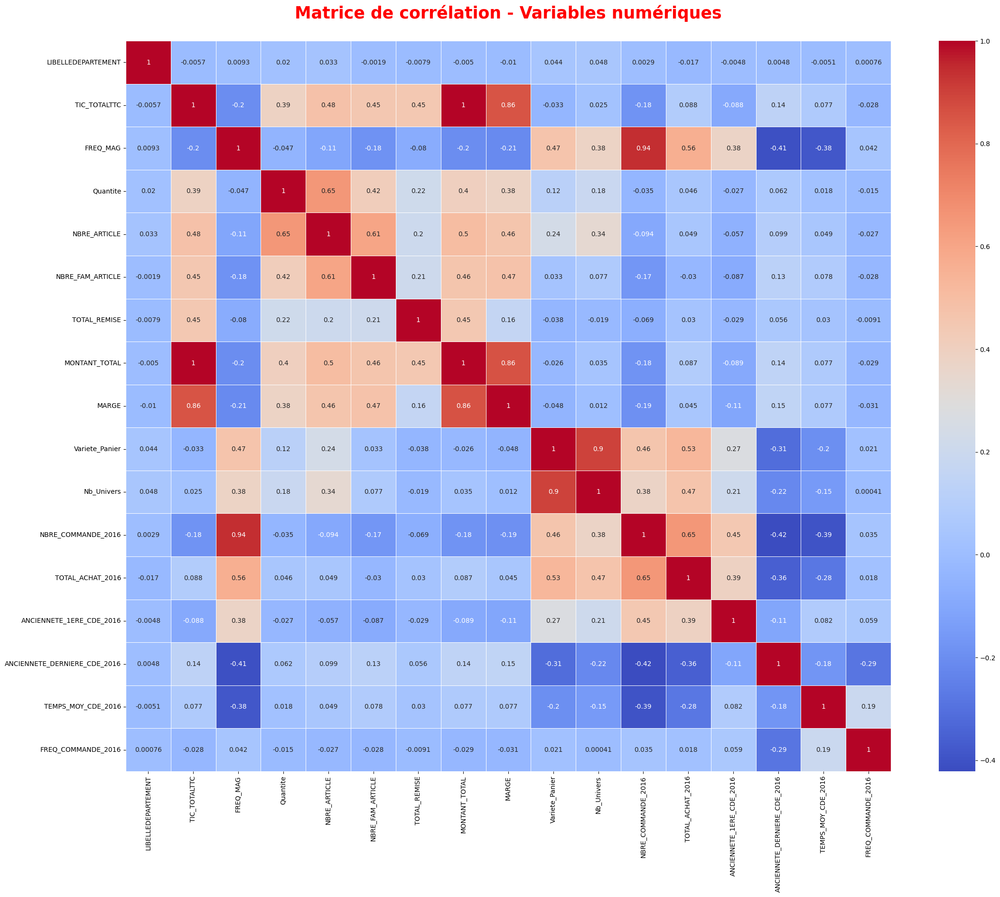

In [47]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sélectionner les variables numériques dans le DataFrame
df_BOTANIC_num = X_BOTANIC.select_dtypes(include=['int64', 'float64'])

# Calculer la matrice de corrélation pour les variables numériques
corr_matrix = df_BOTANIC_num.corr()

# Afficher la matrice de corrélation sous forme de heatmap
plt.figure(figsize=(26, 20))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Matrice de corrélation - Variables numériques\n", fontsize=25, color='red', fontweight='bold')
plt.show()


In [48]:
# Sélection des variables numériques dans le DataFrame
df_BOTANIC_num = X_BOTANIC.select_dtypes(include=['int64', 'float64'])
threshold = 0.8
# Sélectionner les paires de features fortement corrélées
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
to_drop = [column for column in upper.columns if any(upper[column].abs() > threshold)]
print(f"Variables supprimées: {to_drop}")

Variables supprimées: ['MONTANT_TOTAL', 'MARGE', 'Nb_Univers', 'NBRE_COMMANDE_2016']


In [49]:
# Suppression de colonnes quantitatives fortement corrélées
X_BOTANIC.drop(['MONTANT_TOTAL', 'MARGE', 'Nb_Univers', 'NBRE_COMMANDE_2016'], axis=1, inplace=True)

In [50]:
X_BOTANIC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7408792 entries, 0 to 7408791
Data columns (total 22 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   MAGASIN                       object 
 1   SEXE                          object 
 2   AGE_GROUP                     object 
 3   ANCIENNETE_ADHESION_CAT       object 
 4   ANCIENNETE_READ               object 
 5   VILLE                         object 
 6   LIBELLEDEPARTEMENT            int64  
 7   LIBELLEREGIONCOMMERCIALE      object 
 8   TIC_TOTALTTC                  float64
 9   FREQ_MAG                      int64  
 10  TYPE_UNIVERS                  object 
 11  Quantite                      float64
 12  NBRE_ARTICLE                  int64  
 13  NBRE_FAM_ARTICLE              int64  
 14  TOTAL_REMISE                  float64
 15  Variete_Panier                int64  
 16  UNIVERS_PREFERE               int32  
 17  TOTAL_ACHAT_2016              float64
 18  ANCIENNETE_1ERE_CDE_20

Matrice de corrélation après la suppression


Matrice de corrélation après suppression :
                              LIBELLEDEPARTEMENT  TIC_TOTALTTC  FREQ_MAG  \
LIBELLEDEPARTEMENT                      1.000000     -0.005687  0.009317   
TIC_TOTALTTC                           -0.005687      1.000000 -0.202539   
FREQ_MAG                                0.009317     -0.202539  1.000000   
Quantite                                0.020289      0.389126 -0.047141   
NBRE_ARTICLE                            0.033347      0.482634 -0.109973   
NBRE_FAM_ARTICLE                       -0.001900      0.453081 -0.184928   
TOTAL_REMISE                           -0.007878      0.449541 -0.080217   
Variete_Panier                          0.043743     -0.033168  0.472443   
UNIVERS_PREFERE                         0.000100      0.030115 -0.027207   
TOTAL_ACHAT_2016                       -0.016858      0.087555  0.564300   
ANCIENNETE_1ERE_CDE_2016               -0.004770     -0.088432  0.376253   
ANCIENNETE_DERNIERE_CDE_2016            0.00

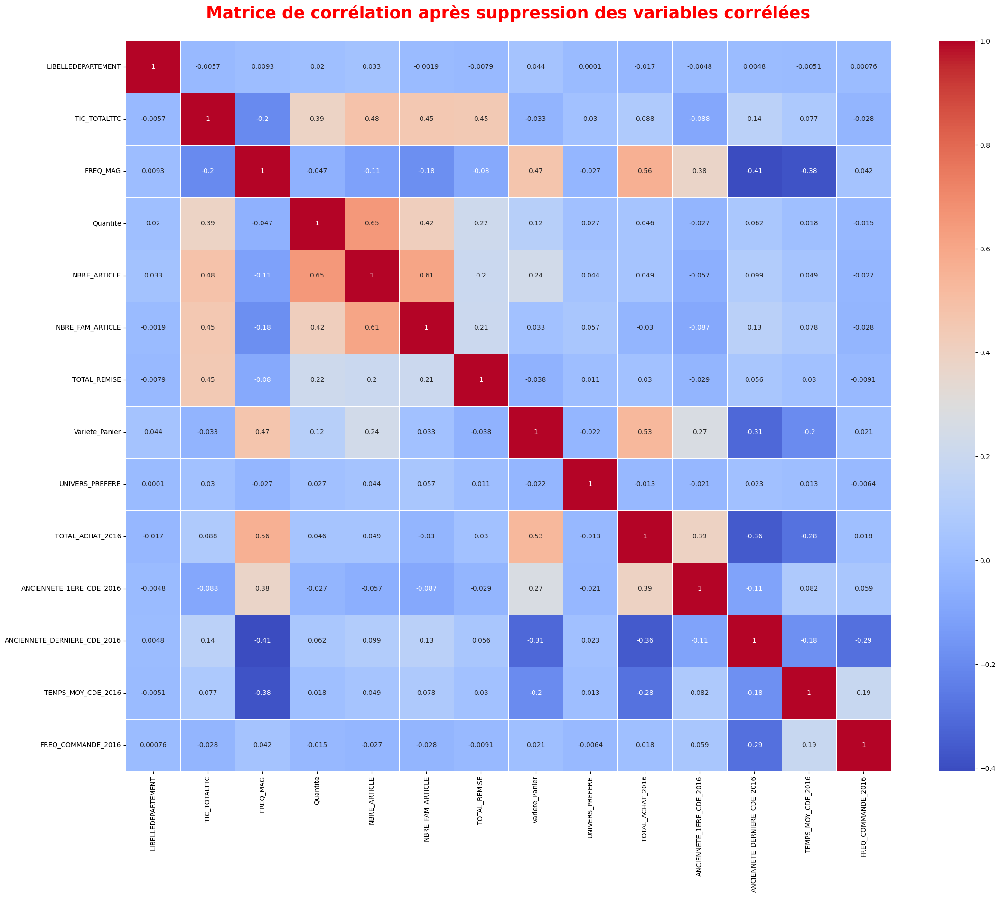

In [51]:
# Recalculer la matrice de corrélation après la suppression
corr_matrix_updated = X_BOTANIC.select_dtypes(include=[np.number]).corr()
print("\nMatrice de corrélation après suppression :")
print(corr_matrix_updated)

# Visualiser la matrice de corrélation mise à jour
plt.figure(figsize=(26, 20))
sns.heatmap(corr_matrix_updated, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Matrice de corrélation après suppression des variables corrélées\n", fontsize=25, color='red', fontweight='bold')
plt.show()

CORRÉLATION ENTRE LES VARIABLES CATÉGORIELLES

                           MAGASIN      SEXE  AGE_GROUP  \
MAGASIN                   1.000000  0.155956   0.151131   
SEXE                      0.155956  1.000000   0.176593   
AGE_GROUP                 0.151131  0.176593   1.000000   
ANCIENNETE_ADHESION_CAT   0.170870  0.130401   0.215090   
ANCIENNETE_READ           0.056506  0.016967   0.011969   
VILLE                     1.000000  0.155956   0.151131   
LIBELLEREGIONCOMMERCIALE  1.000000  0.017349   0.030192   
TYPE_UNIVERS              0.000000  0.000000   0.000000   

                          ANCIENNETE_ADHESION_CAT  ANCIENNETE_READ     VILLE  \
MAGASIN                                  0.170870         0.056506  1.000000   
SEXE                                     0.130401         0.016967  0.155956   
AGE_GROUP                                0.215090         0.011969  0.151131   
ANCIENNETE_ADHESION_CAT                  1.000000         0.025755  0.170870   
ANCIENNETE_READ                          0.025755         1.000000  

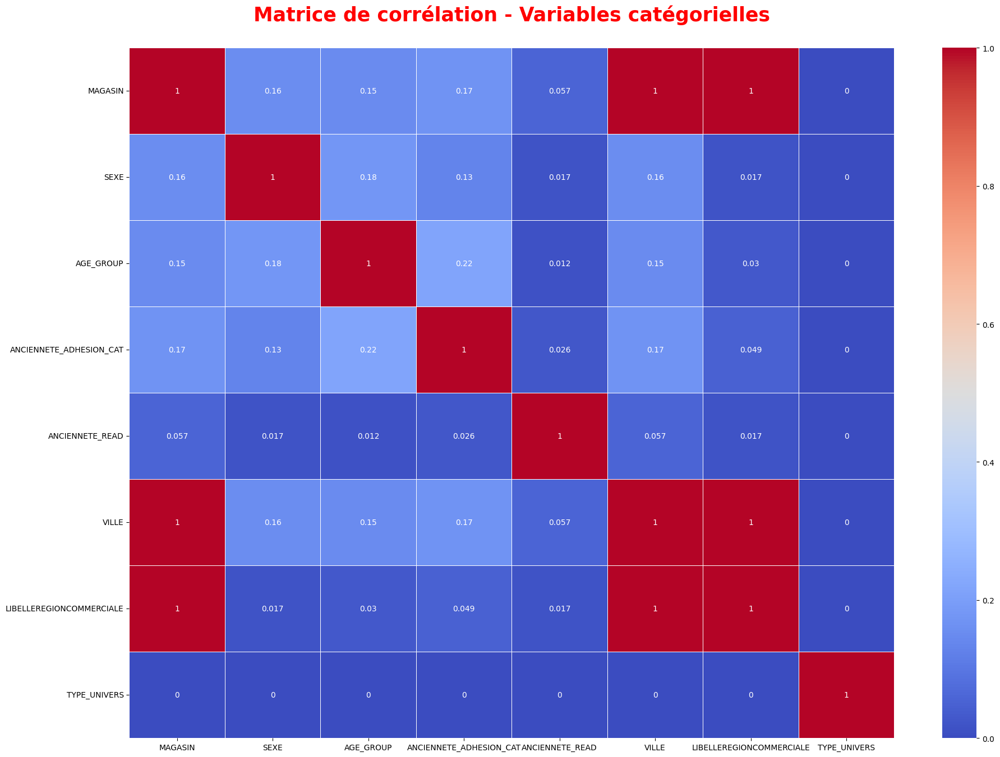

In [52]:
from scipy.stats import chi2_contingency

# Fonction pour calculer la corrélation chi2 entre deux variables catégorielles
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    r, k = confusion_matrix.shape
    return (chi2 / (n * (min(r,k) - 1)))**0.5

# Liste des colonnes catégorielles
colonnes_cat = X_BOTANIC.select_dtypes(include=['object']).columns.tolist()

# Matrice de corrélation catégorielle
cat_corr_matrix = pd.DataFrame(index=colonnes_cat, columns=colonnes_cat)

for col1 in colonnes_cat:
    for col2 in colonnes_cat:
        cat_corr_matrix.loc[col1, col2] = cramers_v(X_BOTANIC[col1], X_BOTANIC[col2])

# Convertir en float pour affichage sur heatmap
cat_corr_matrix = cat_corr_matrix.astype(float)

# Afficher le tableau des valeurs chi-2 
print(cat_corr_matrix)

# Afficher la matrice de corrélation catégorielle
plt.figure(figsize=(22, 16))
sns.heatmap(cat_corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Matrice de corrélation - Variables catégorielles\n", fontsize=25, color='red', fontweight='bold')
plt.show()

In [53]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats.contingency import chi2_contingency

# Fonctions de support
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    return np.sqrt((chi2 / n) / (min(confusion_matrix.shape) - 1))

# Variables catégorielles seules
X_BOTANIC_cat = X_BOTANIC.select_dtypes(include=['object', 'category'])

# Matrice de corrélation catégorielle
cat_corr_matrix = pd.DataFrame(index=X_BOTANIC_cat.columns, columns=X_BOTANIC_cat.columns)

# Remplissage de la matrice de corrélation catégorielle
for col1 in cat_corr_matrix.columns:
    for col2 in cat_corr_matrix.columns:
        if col1 != col2:
            cat_corr_matrix.loc[col1, col2] = cramers_v(X_BOTANIC_cat[col1], X_BOTANIC_cat[col2])

# Conversion des valeurs en float
cat_corr_matrix = cat_corr_matrix.astype(float)

# Fonction pour sélectionner les features fortement corrélées
def select_high_corr_features(corr_matrix, threshold=0.8):
    # Sélectionner les paires de features fortement corrélées
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper.columns if any(upper[column].abs() > threshold)]
    return to_drop

to_drop_cat = select_high_corr_features(cat_corr_matrix, threshold)
print(f"Variables supprimées: {to_drop_cat}")

Variables supprimées: ['VILLE', 'LIBELLEREGIONCOMMERCIALE']


In [54]:
# Suppression de colonnes catégorielles corrélées après analyse
X_BOTANIC.drop(['VILLE', 'LIBELLEREGIONCOMMERCIALE'], axis=1, inplace=True)

In [55]:
X_BOTANIC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7408792 entries, 0 to 7408791
Data columns (total 20 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   MAGASIN                       object 
 1   SEXE                          object 
 2   AGE_GROUP                     object 
 3   ANCIENNETE_ADHESION_CAT       object 
 4   ANCIENNETE_READ               object 
 5   LIBELLEDEPARTEMENT            int64  
 6   TIC_TOTALTTC                  float64
 7   FREQ_MAG                      int64  
 8   TYPE_UNIVERS                  object 
 9   Quantite                      float64
 10  NBRE_ARTICLE                  int64  
 11  NBRE_FAM_ARTICLE              int64  
 12  TOTAL_REMISE                  float64
 13  Variete_Panier                int64  
 14  UNIVERS_PREFERE               int32  
 15  TOTAL_ACHAT_2016              float64
 16  ANCIENNETE_1ERE_CDE_2016      int64  
 17  ANCIENNETE_DERNIERE_CDE_2016  float64
 18  TEMPS_MOY_CDE_2016    

HEATMAP après suppression des variables corrélées

                          MAGASIN      SEXE  AGE_GROUP  \
MAGASIN                  0.000000  0.155956   0.151131   
SEXE                     0.155956  0.000000   0.176593   
AGE_GROUP                0.151131  0.176593   0.000000   
ANCIENNETE_ADHESION_CAT  0.170870  0.130401   0.215090   
ANCIENNETE_READ          0.056506  0.016967   0.011969   
TYPE_UNIVERS             0.000000  0.000000   0.000000   

                         ANCIENNETE_ADHESION_CAT  ANCIENNETE_READ  \
MAGASIN                                 0.170870         0.056506   
SEXE                                    0.130401         0.016967   
AGE_GROUP                               0.215090         0.011969   
ANCIENNETE_ADHESION_CAT                 0.000000         0.025755   
ANCIENNETE_READ                         0.025755         0.000000   
TYPE_UNIVERS                            0.000000         0.000000   

                         TYPE_UNIVERS  
MAGASIN                           0.0  
SEXE                         

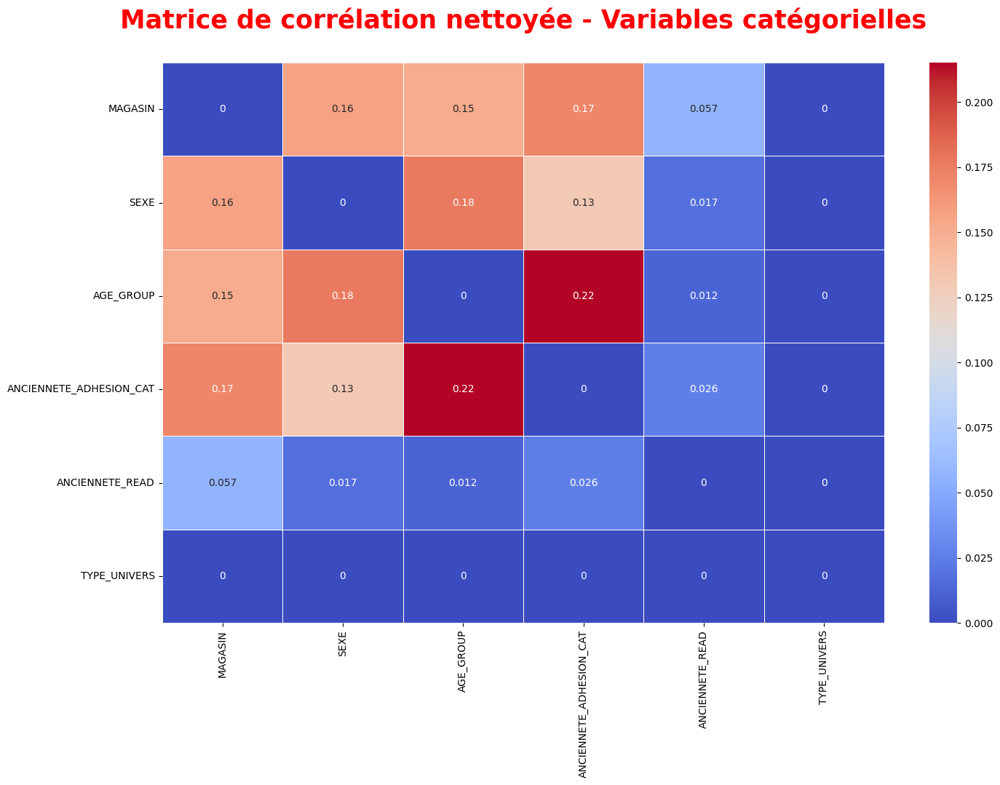

In [56]:
# Étape pour les variables catégorielles, ajustez selon votre contexte
cat_cols = X_BOTANIC.select_dtypes(include=['object', 'category']).columns

# Initialisation de la matrice V de Cramer
cat_corr_matrix_clean = pd.DataFrame(index=cat_cols, columns=cat_cols)

# Calcul de la matrice de V de Cramer
for col1 in cat_corr_matrix_clean.columns:
    for col2 in cat_corr_matrix_clean.columns:
        if col1 != col2:
            cat_corr_matrix_clean.loc[col1, col2] = cramers_v(X_BOTANIC[col1], X_BOTANIC[col2])

# Conversion des valeurs en float
cat_corr_matrix_clean = cat_corr_matrix_clean.astype(float)

# Remplacer les NaN par zéro
cat_corr_matrix_clean.fillna(0, inplace=True)

# Afficher le tableau des valeurs Cramériennes nettoyé
print(cat_corr_matrix_clean)

# Affichage de la heatmap de la matrice de corrélation nettoyée
plt.figure(figsize=(16, 10))
sns.heatmap(cat_corr_matrix_clean, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Matrice de corrélation nettoyée - Variables catégorielles\n", fontsize=25, color='red', fontweight='bold')
plt.show()

CORRÉLATION ENTRE LES VARIABLES NUMÉRIQUES ET CATÉGORIELLES

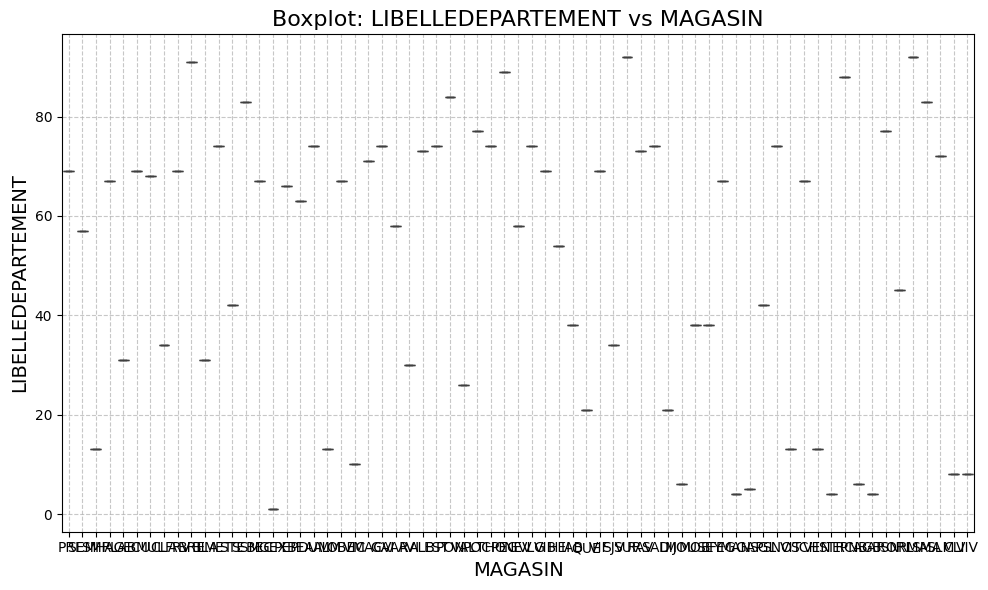

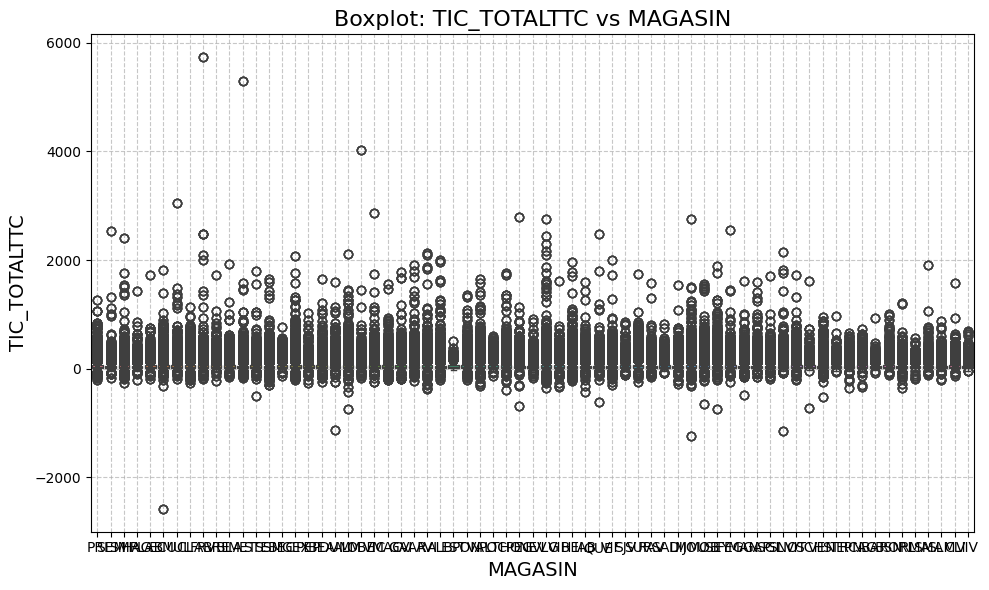

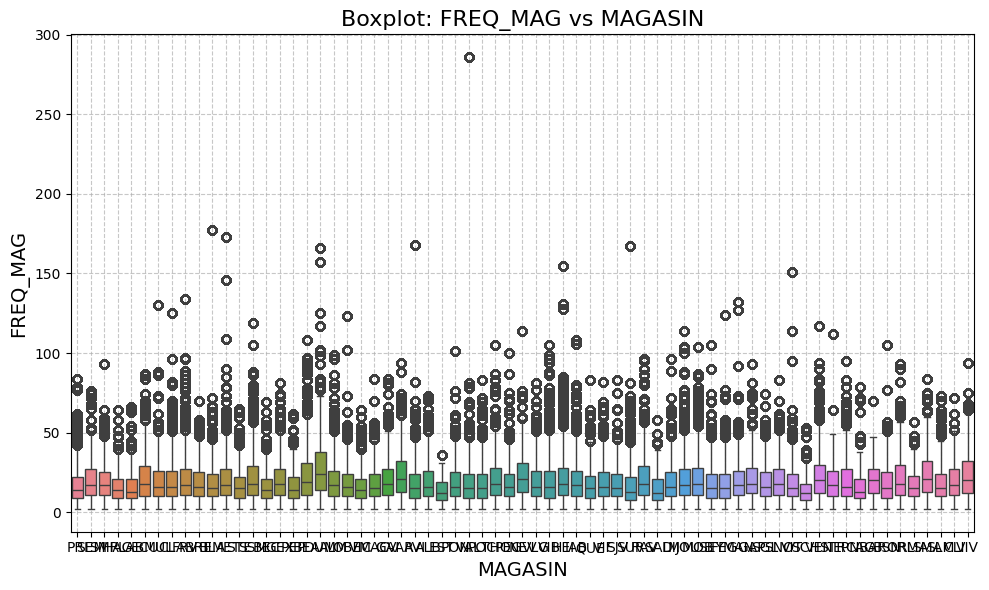

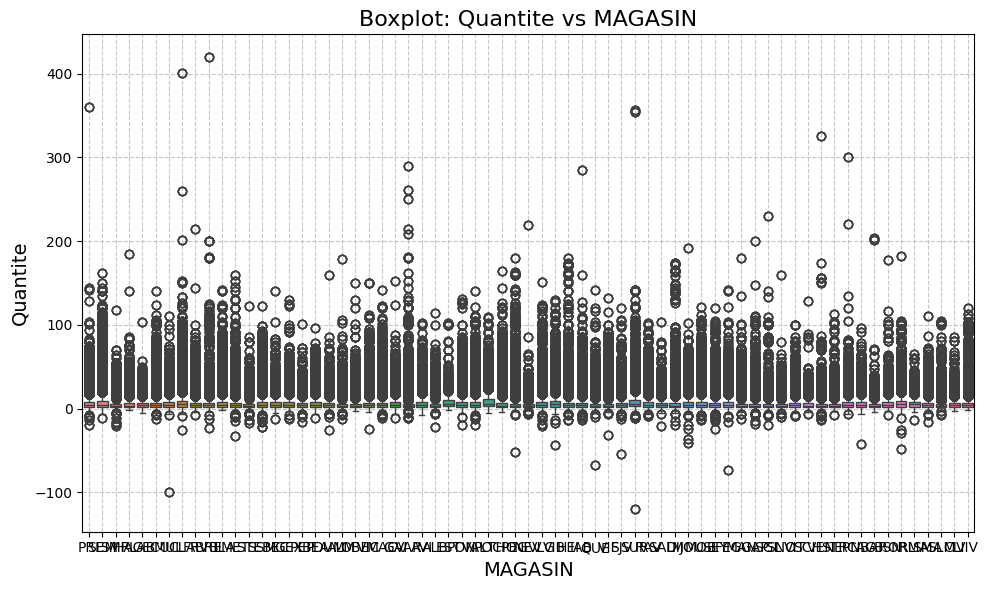

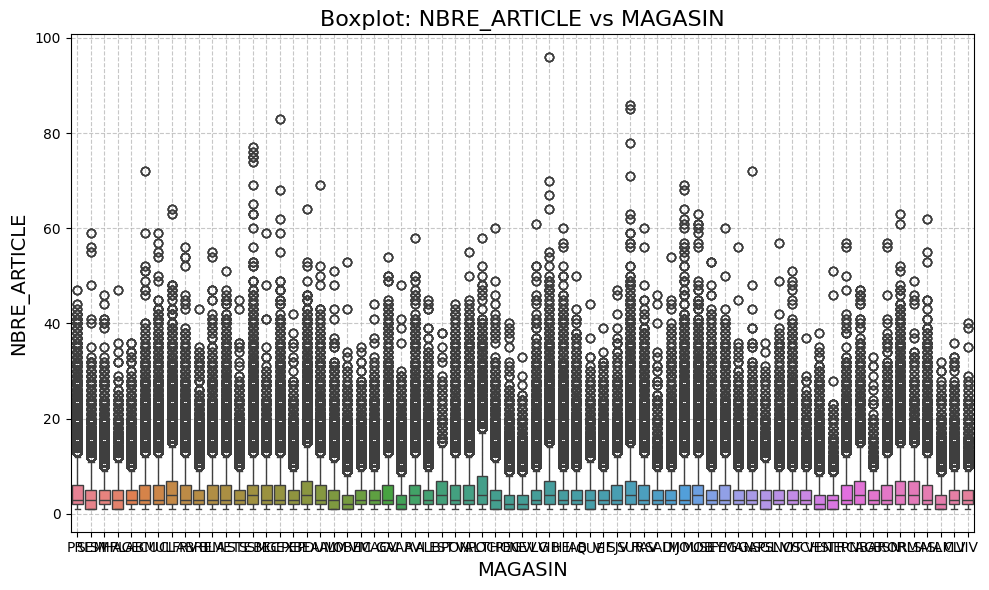

...

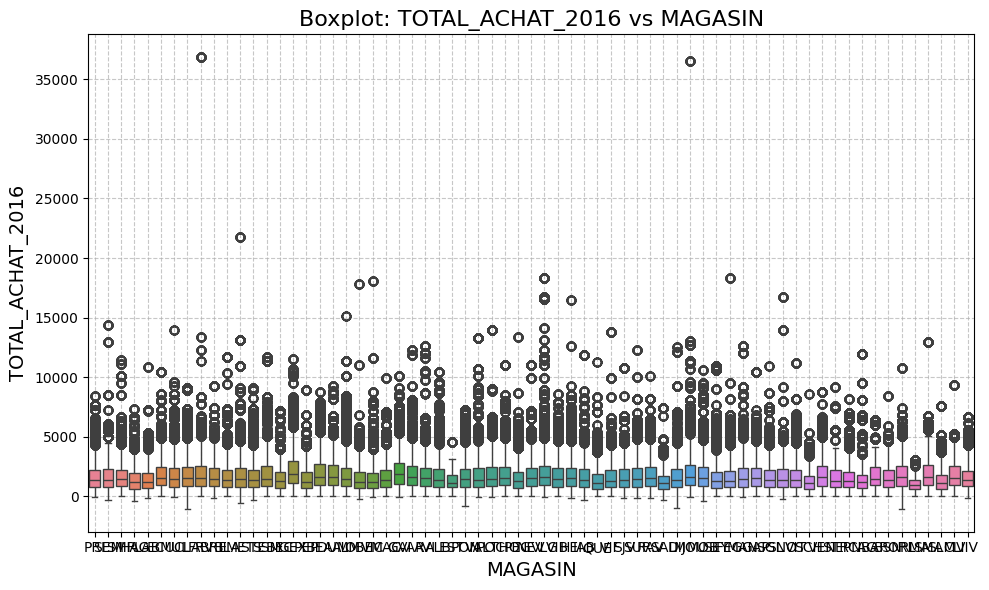

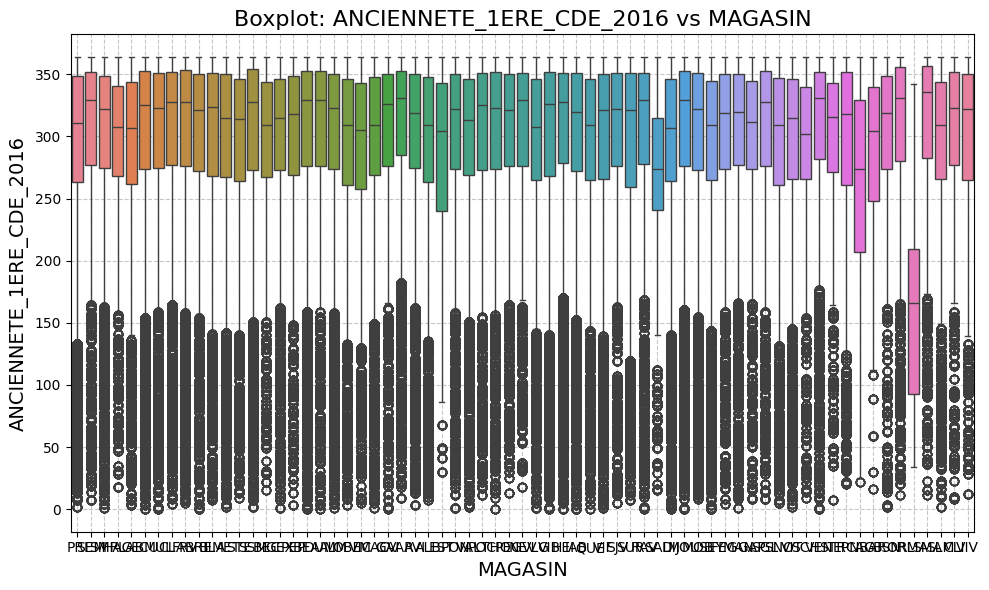

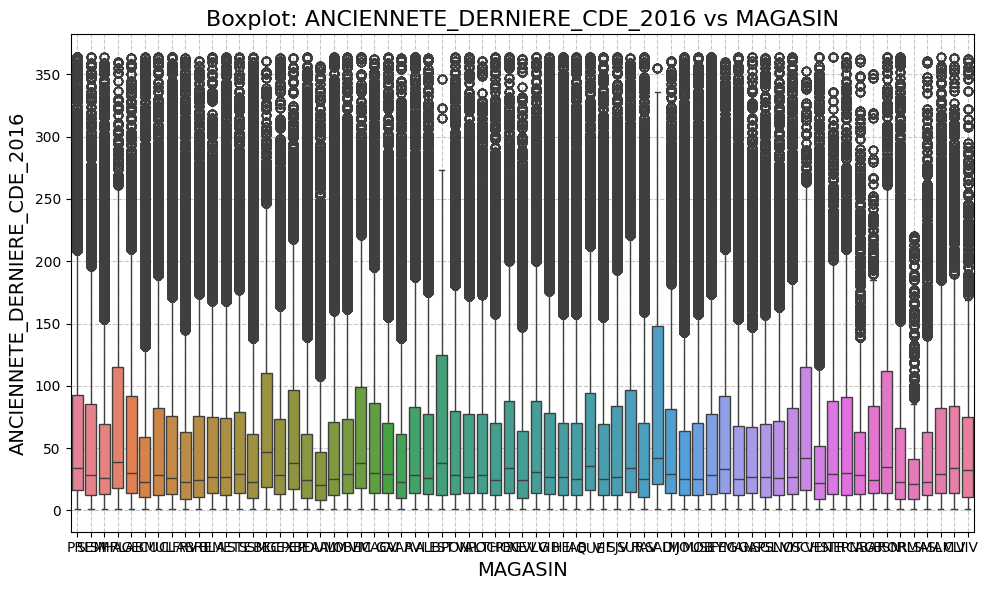

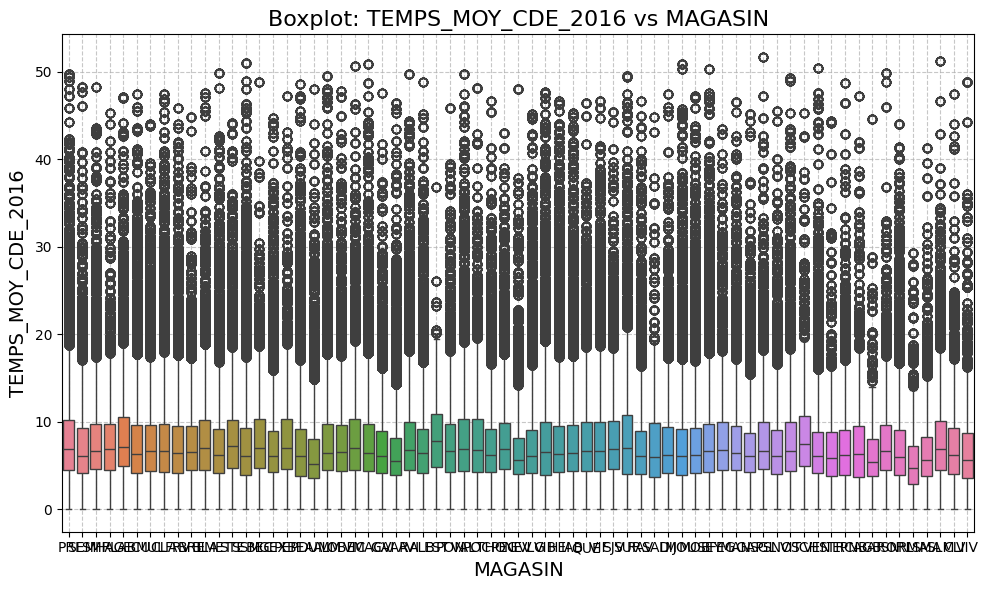

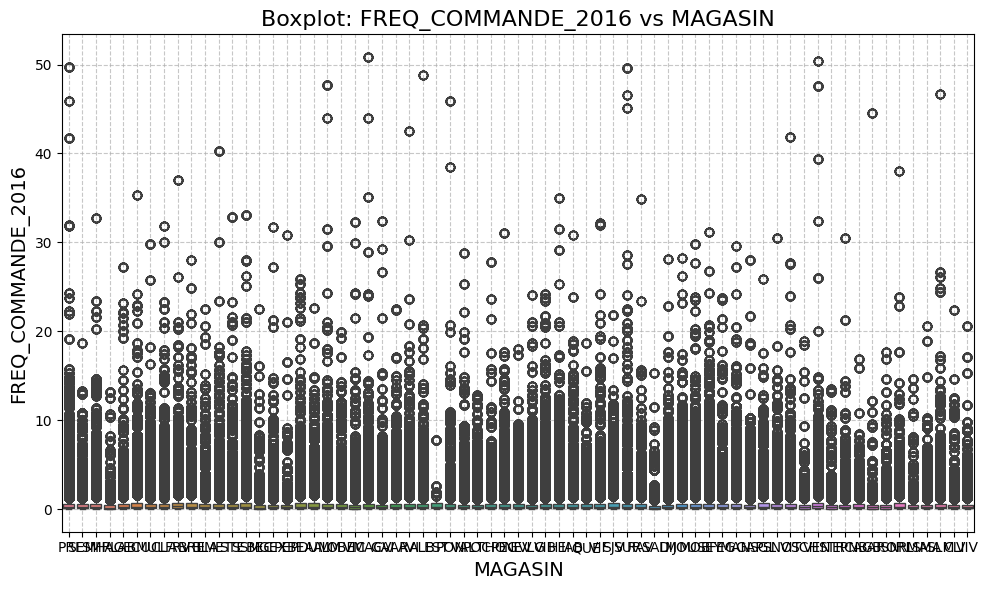

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (2), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


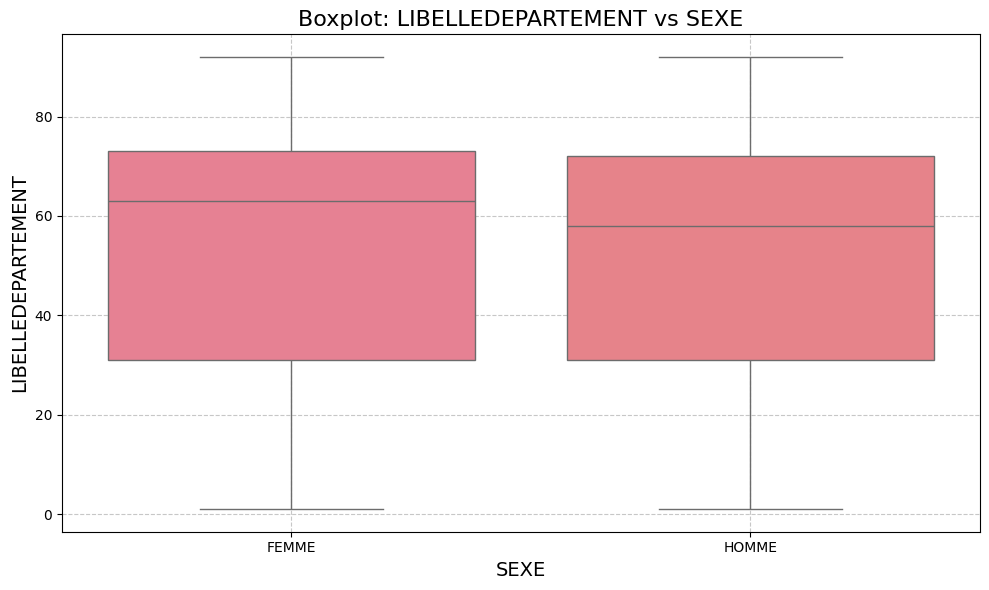

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (2), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


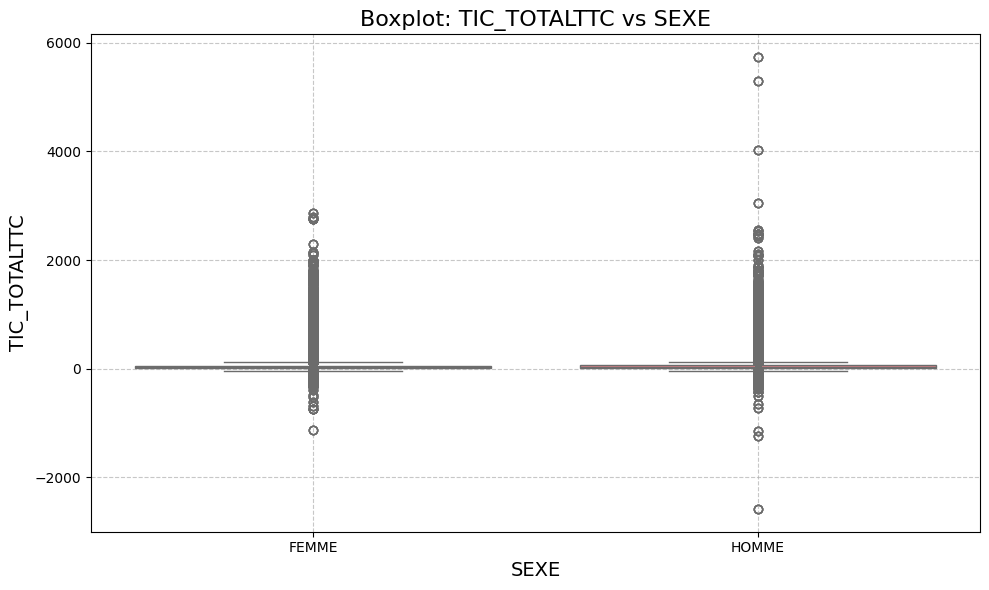

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (2), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


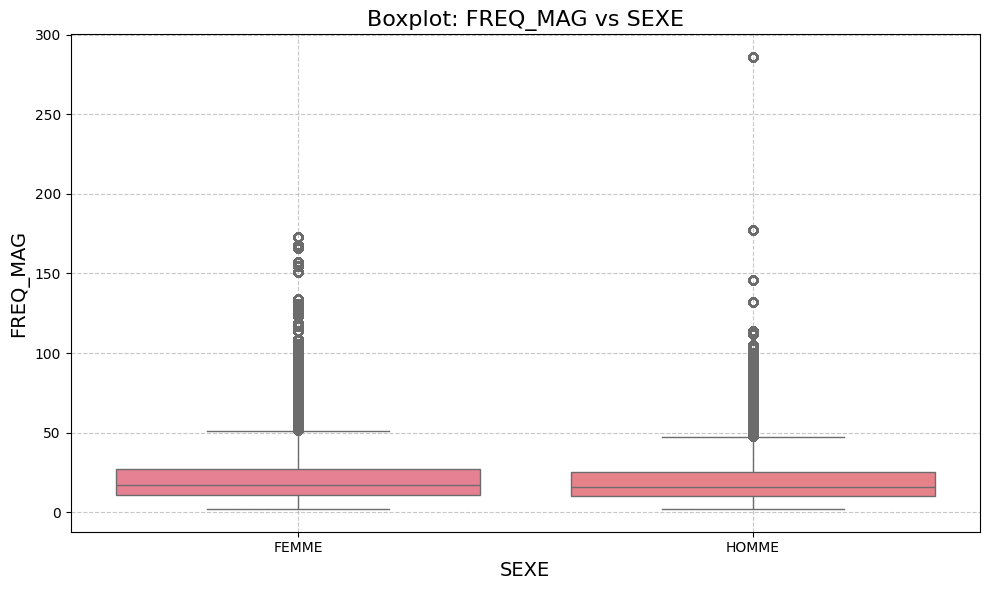

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (2), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


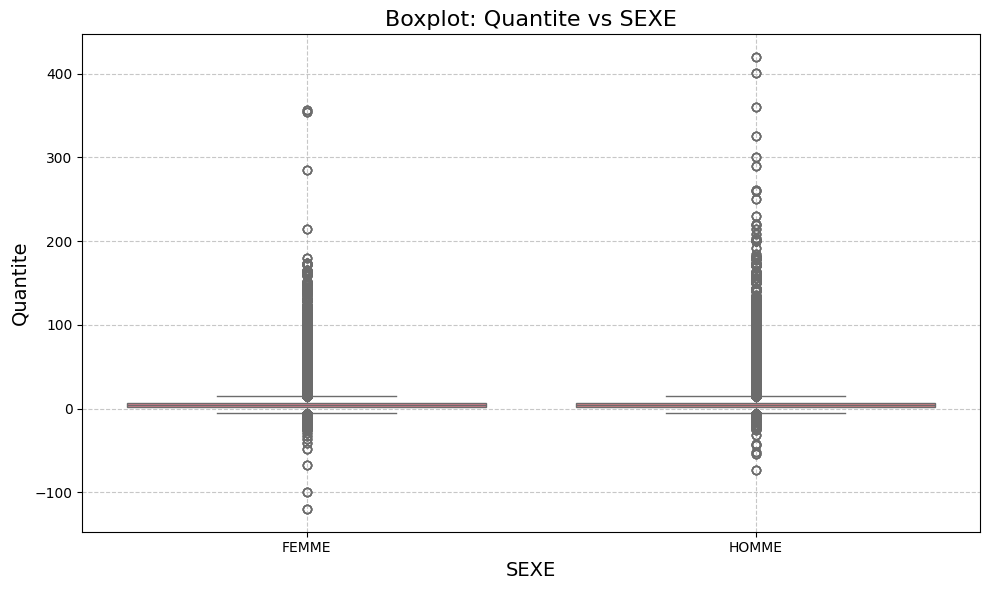

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (2), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


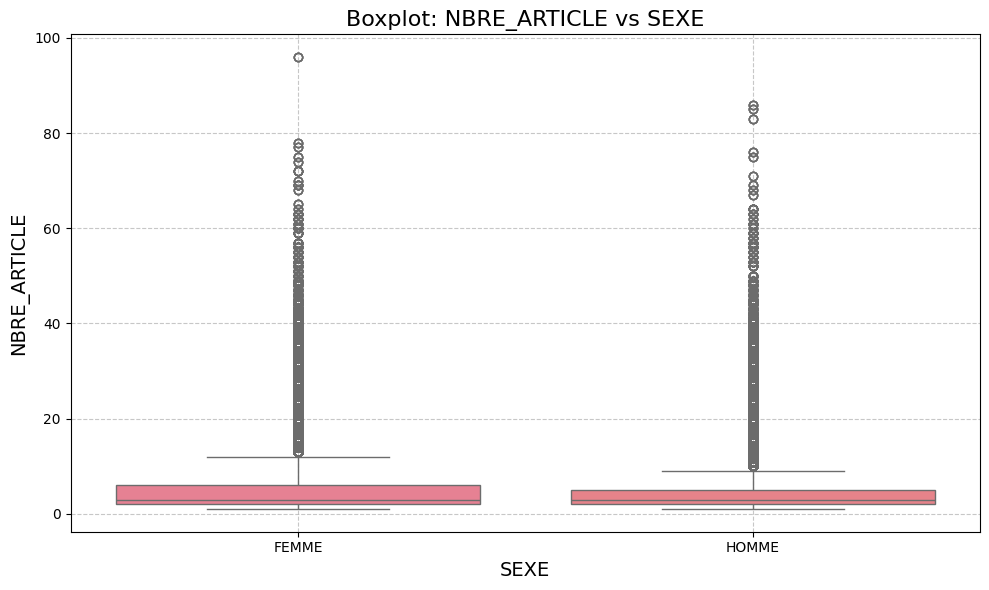

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (2), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


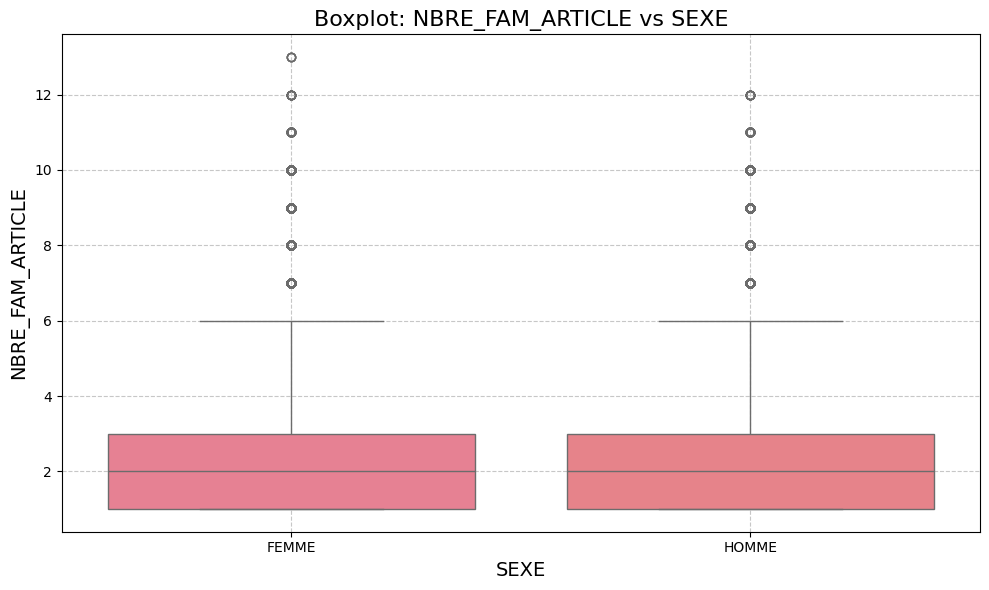

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (2), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


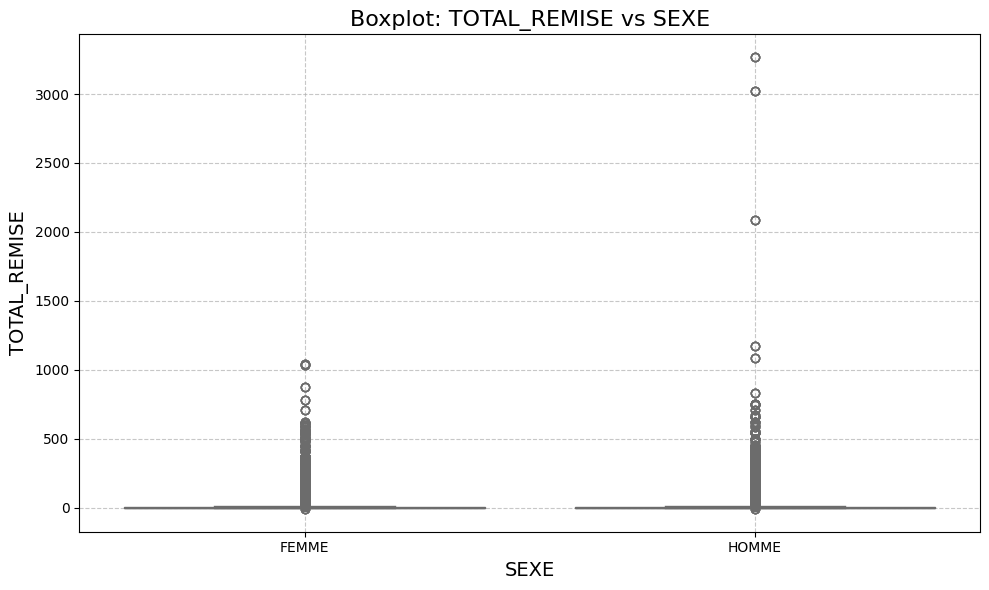

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (2), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


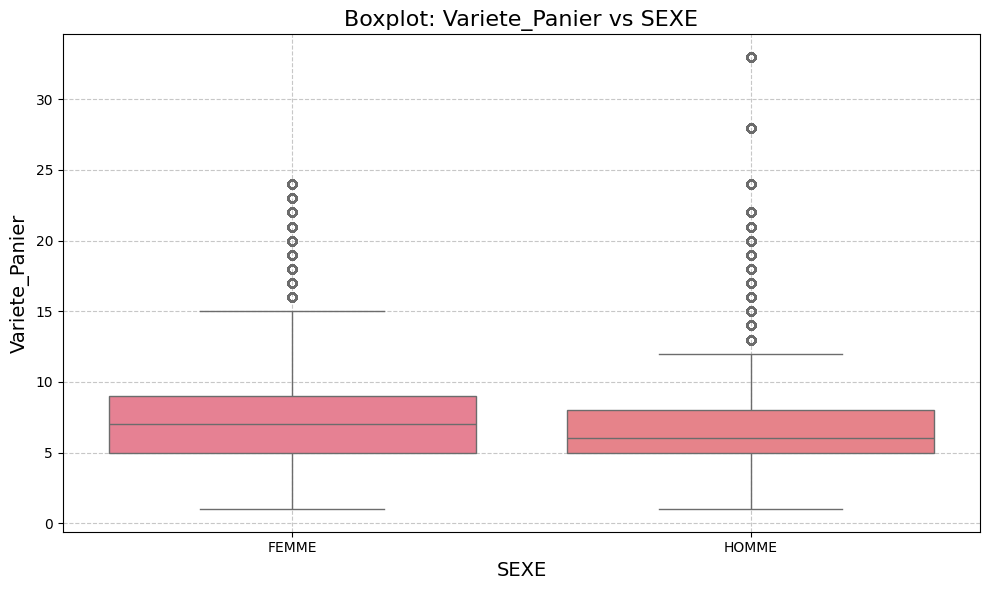

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (2), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


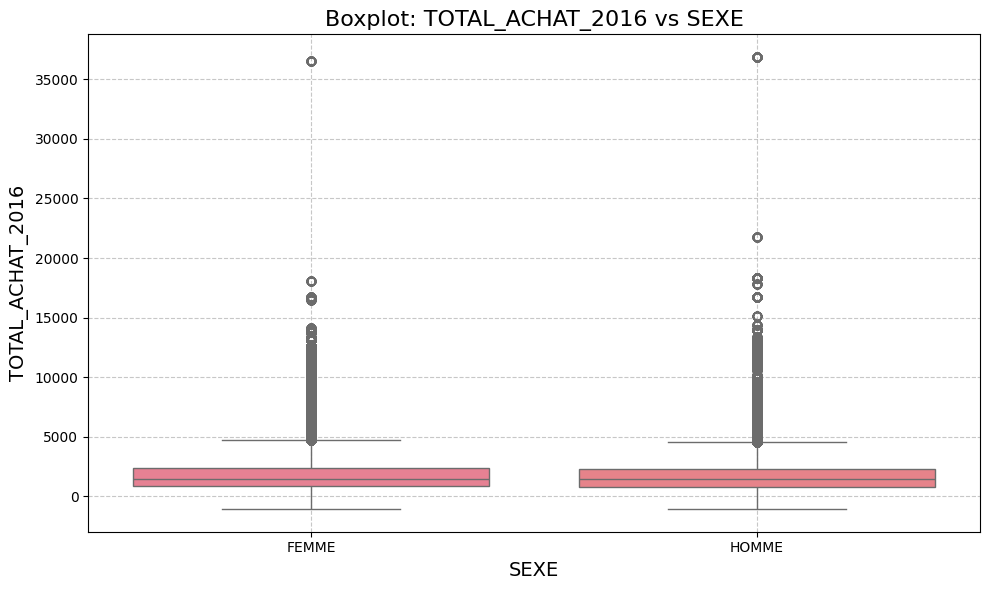

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (2), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


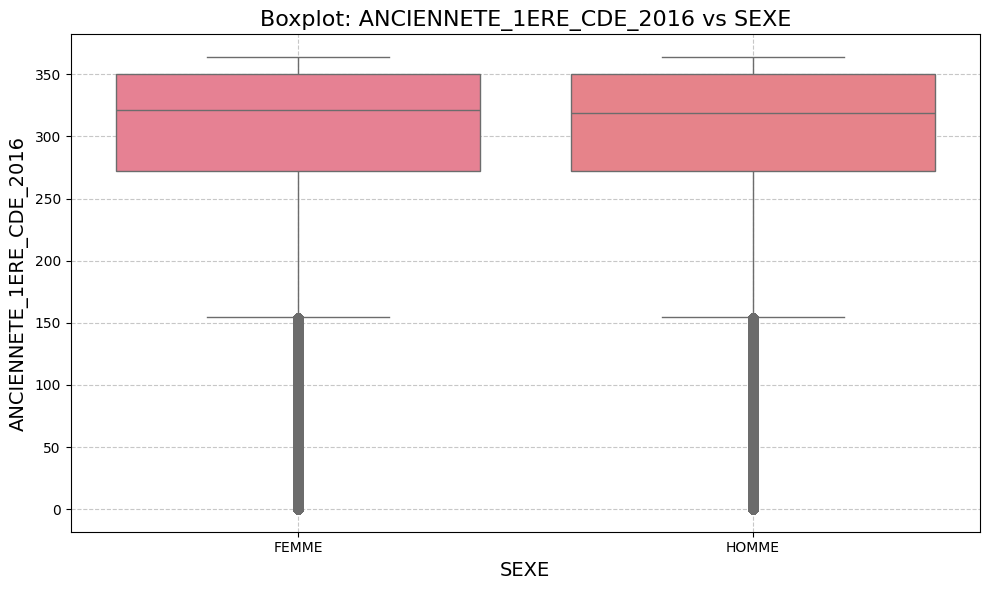

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (2), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


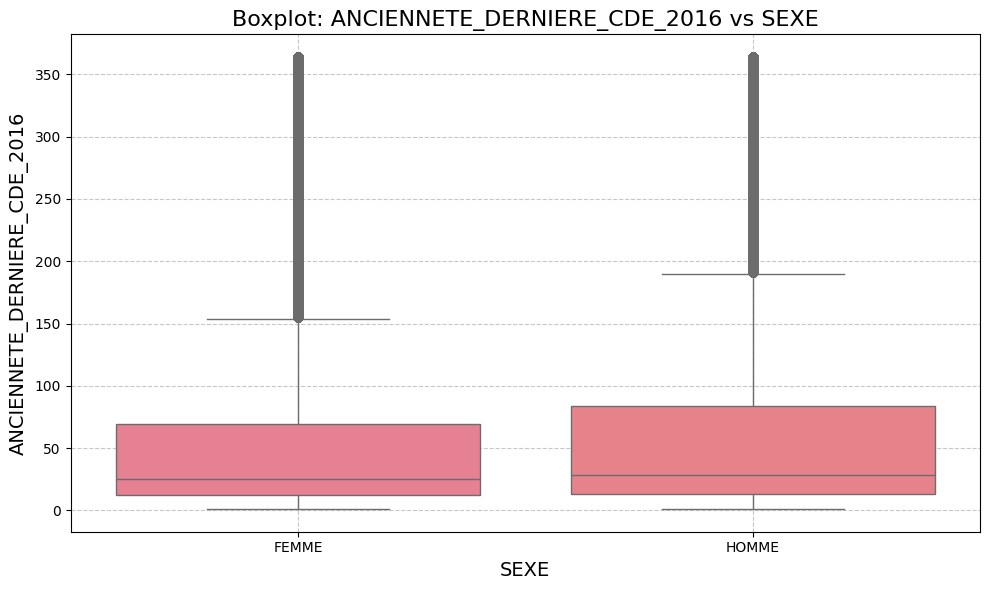

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (2), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


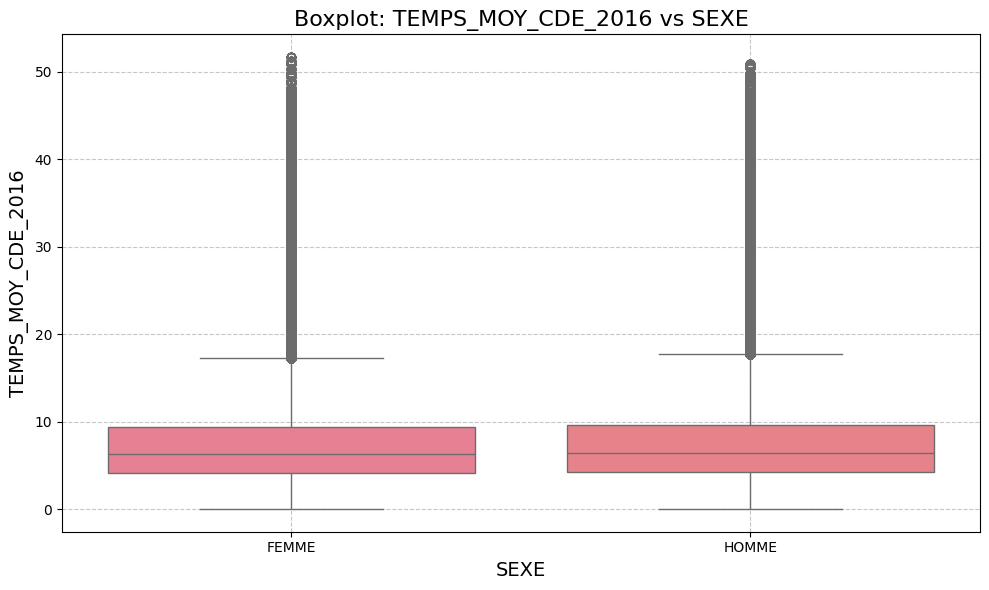

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (2), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


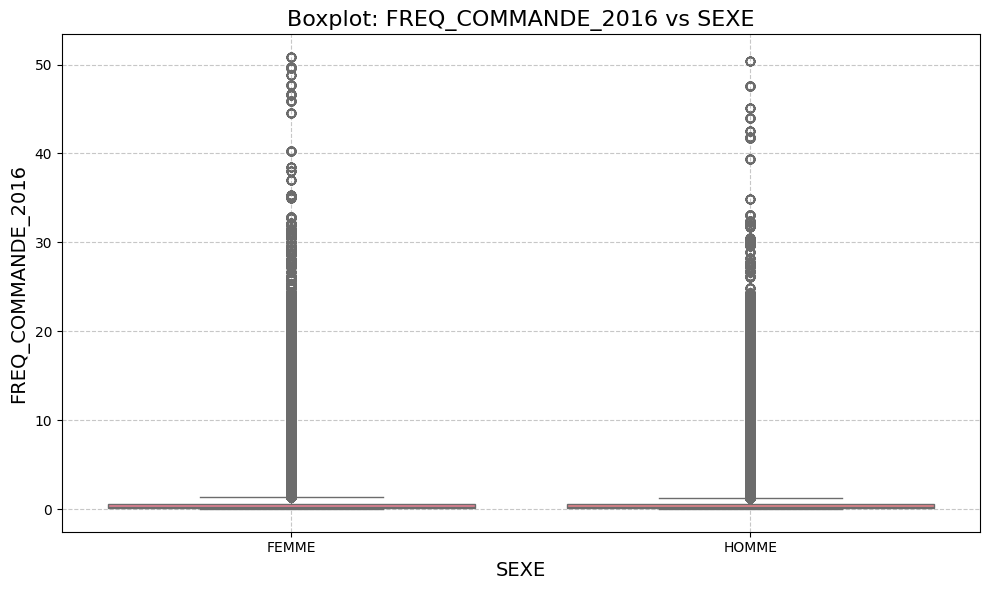

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


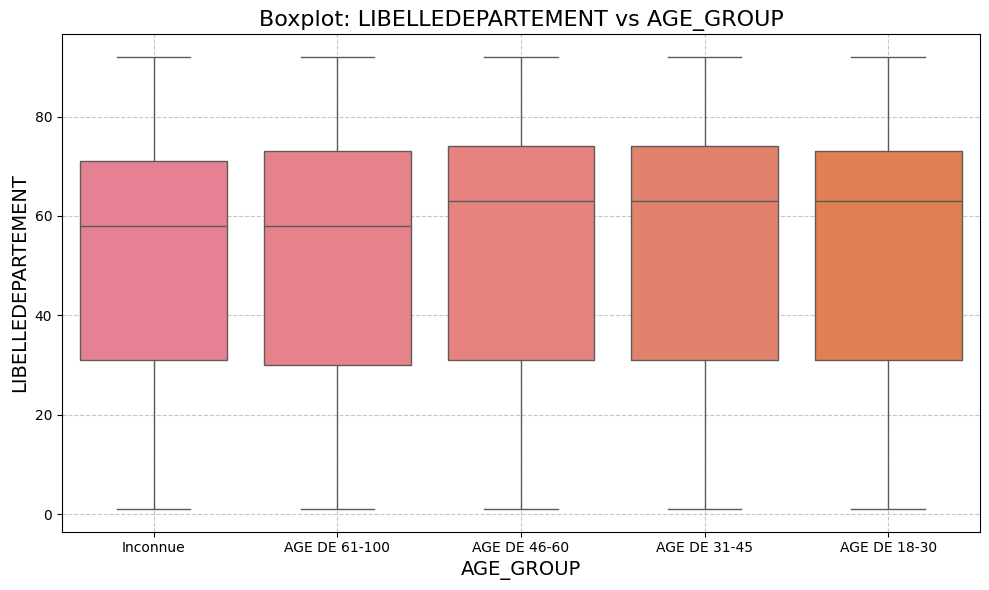

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


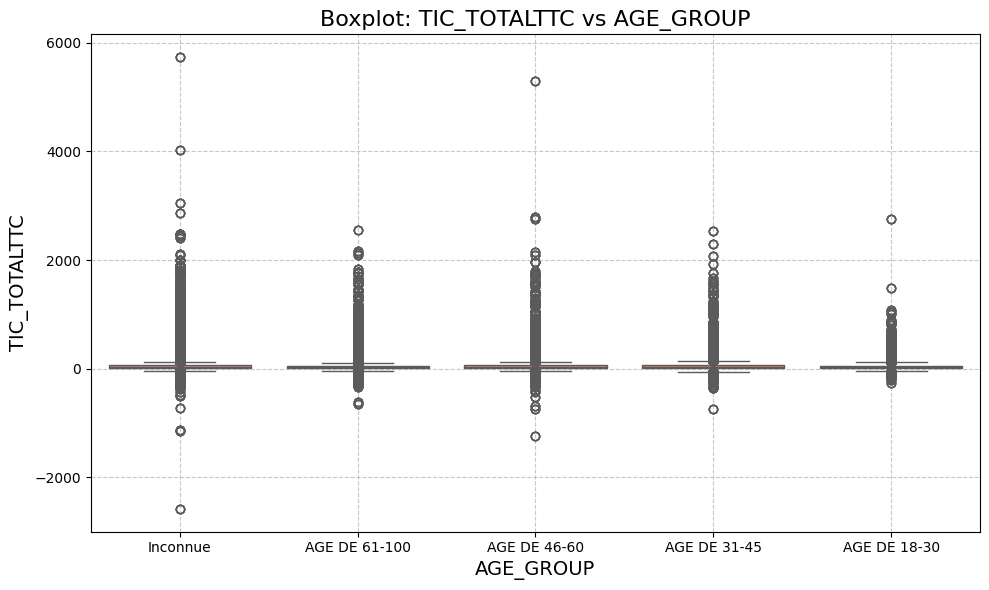

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


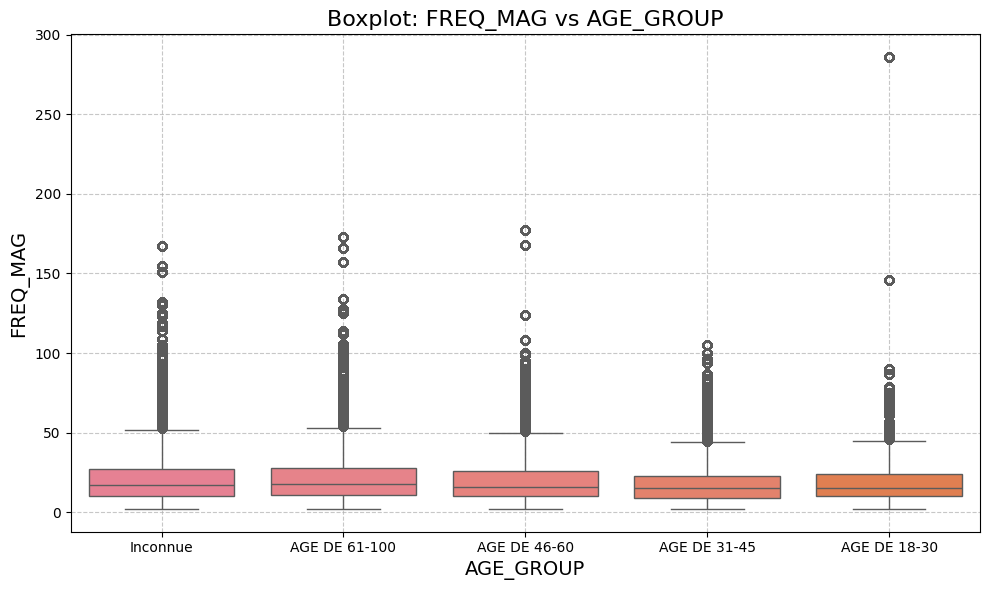

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


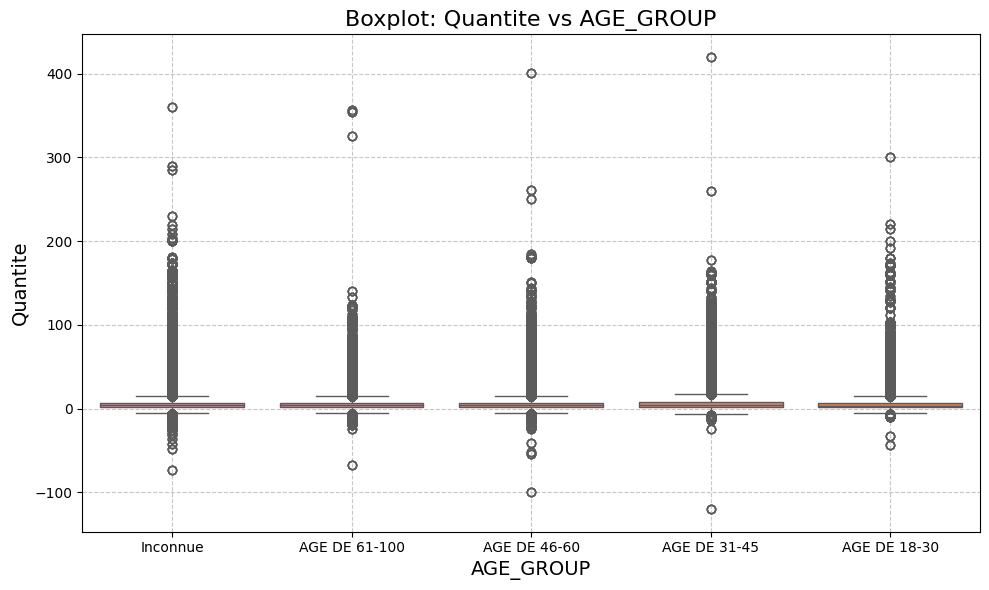

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


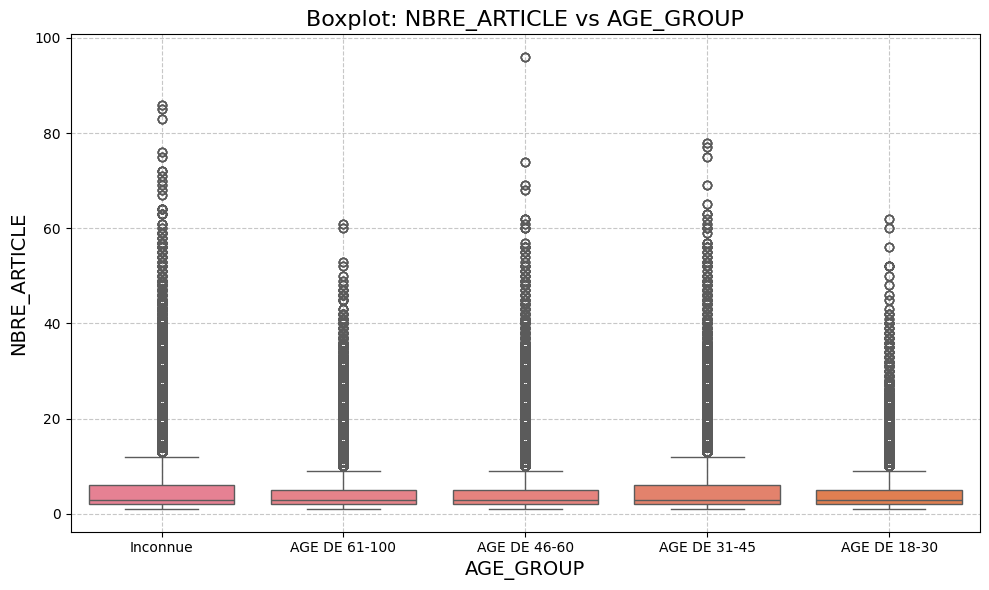

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


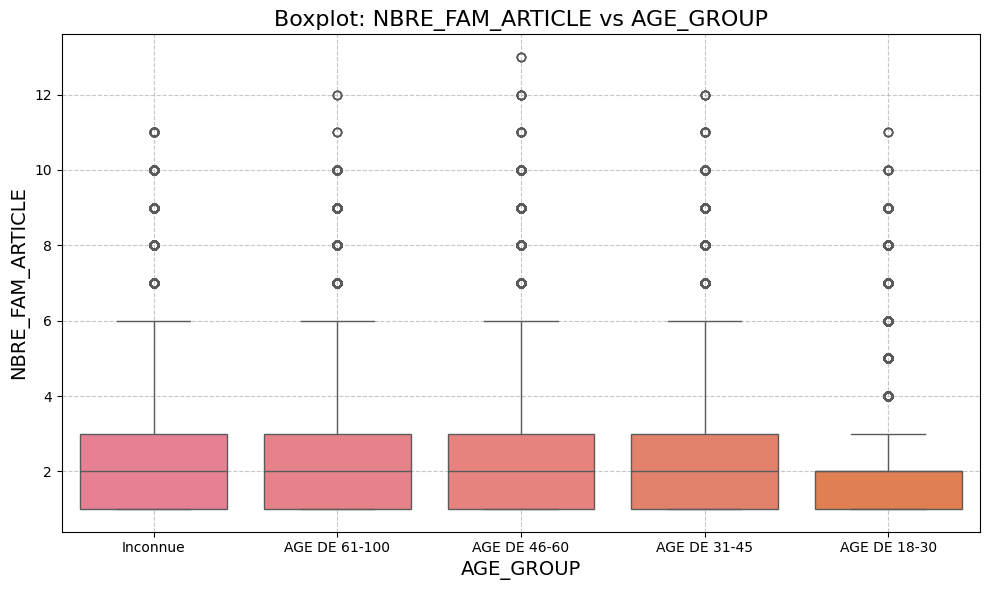

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


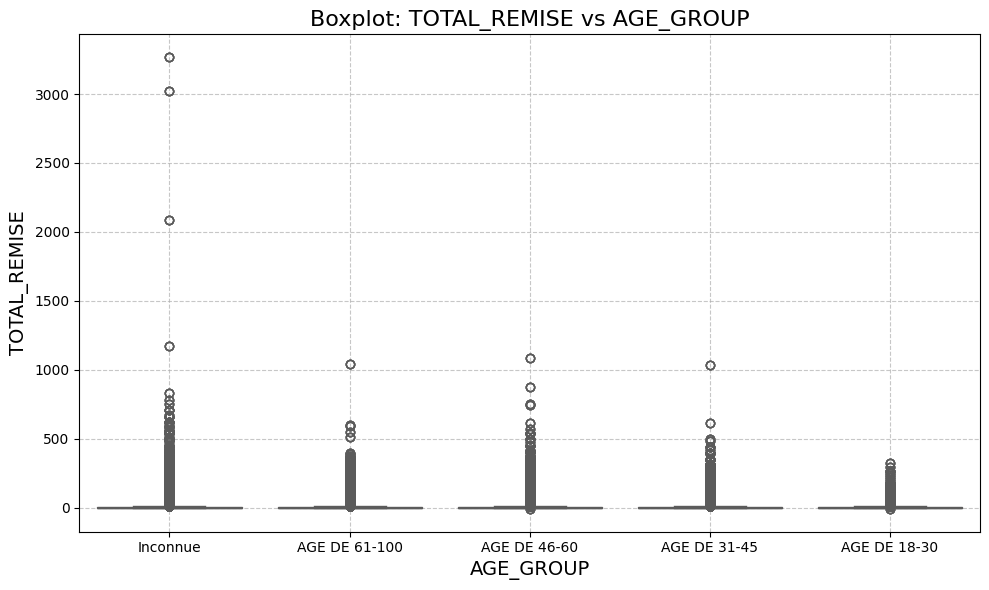

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


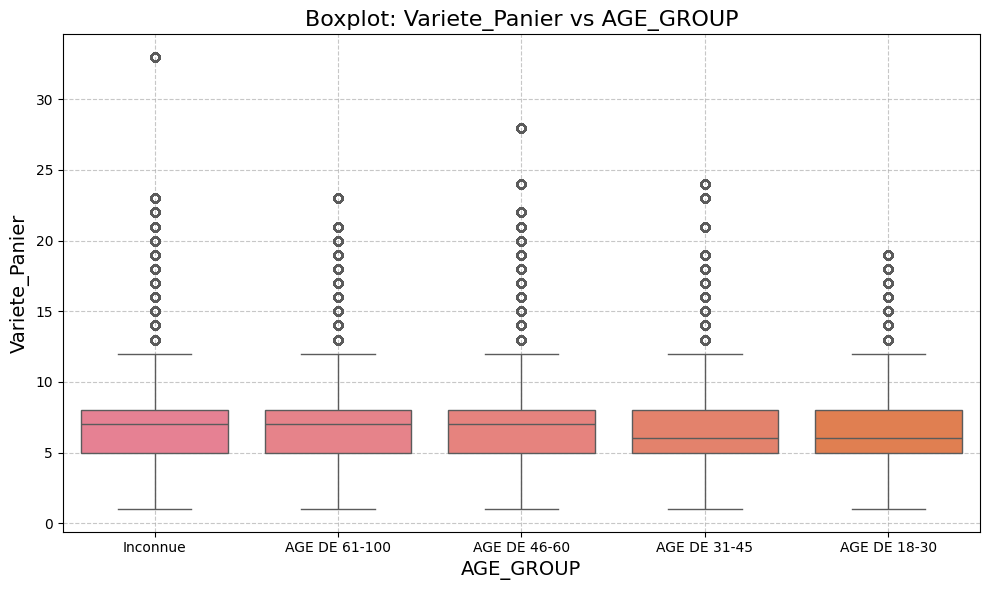

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


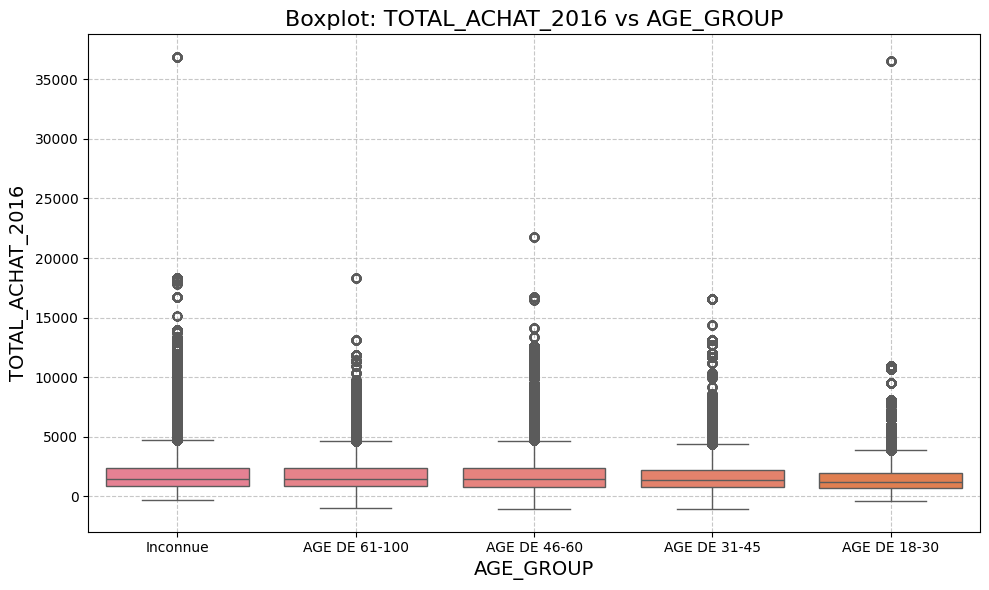

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


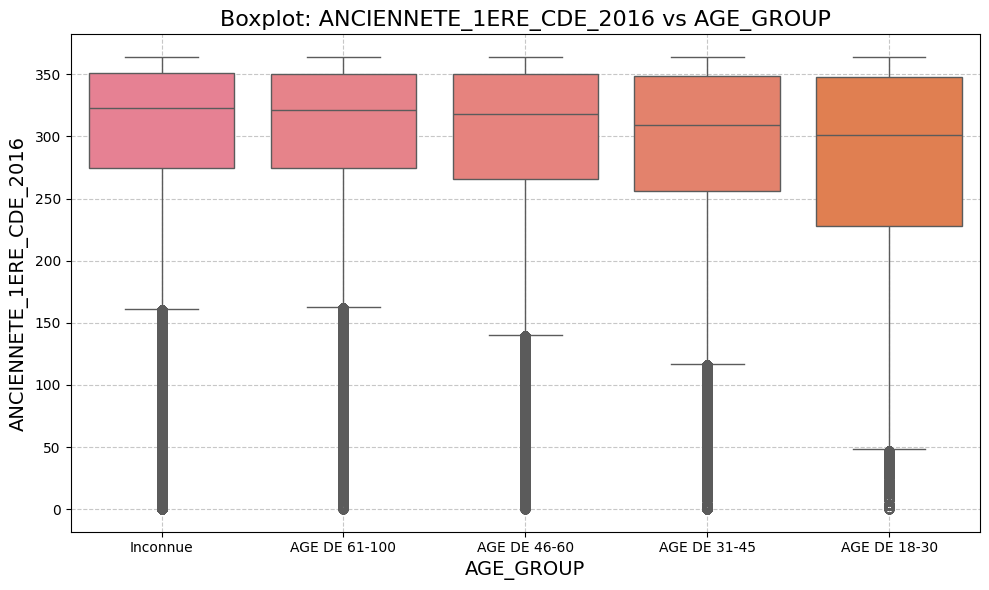

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


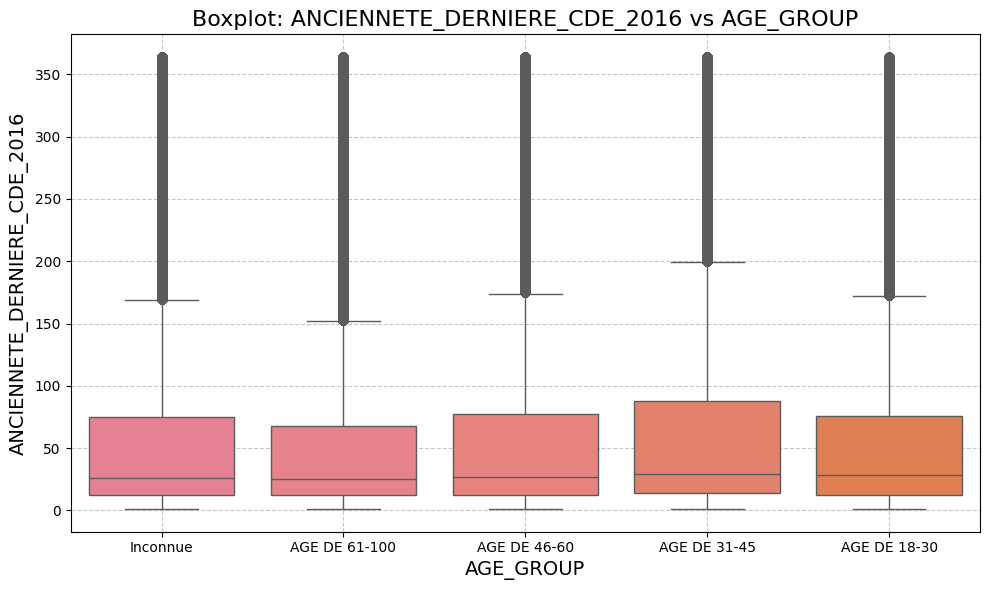

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


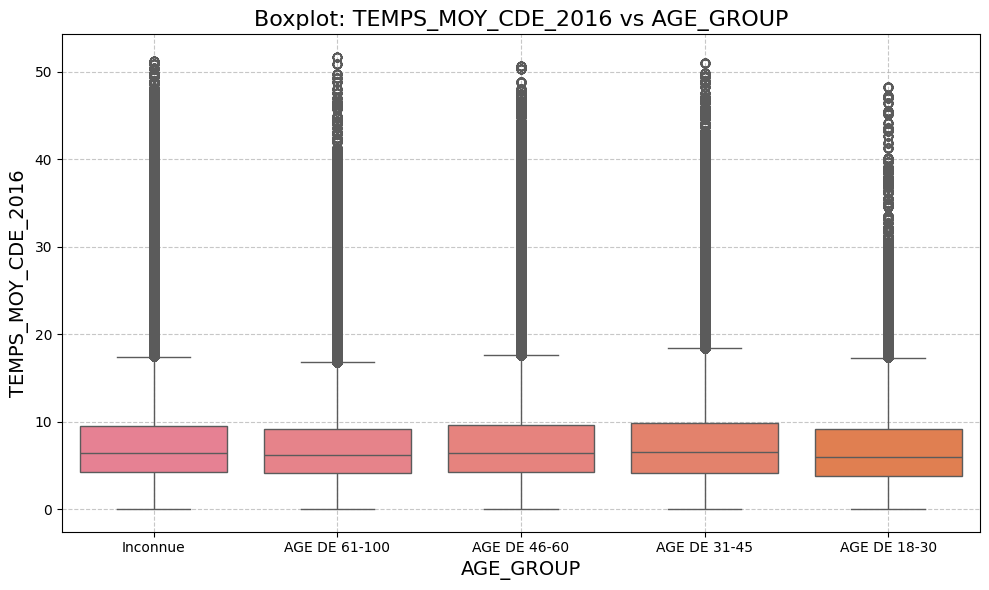

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


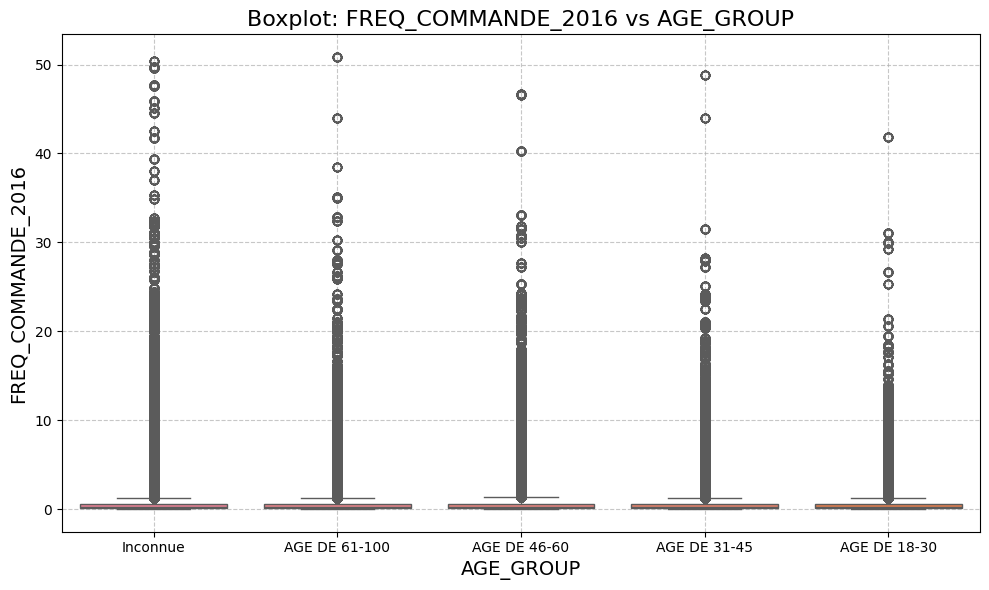

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


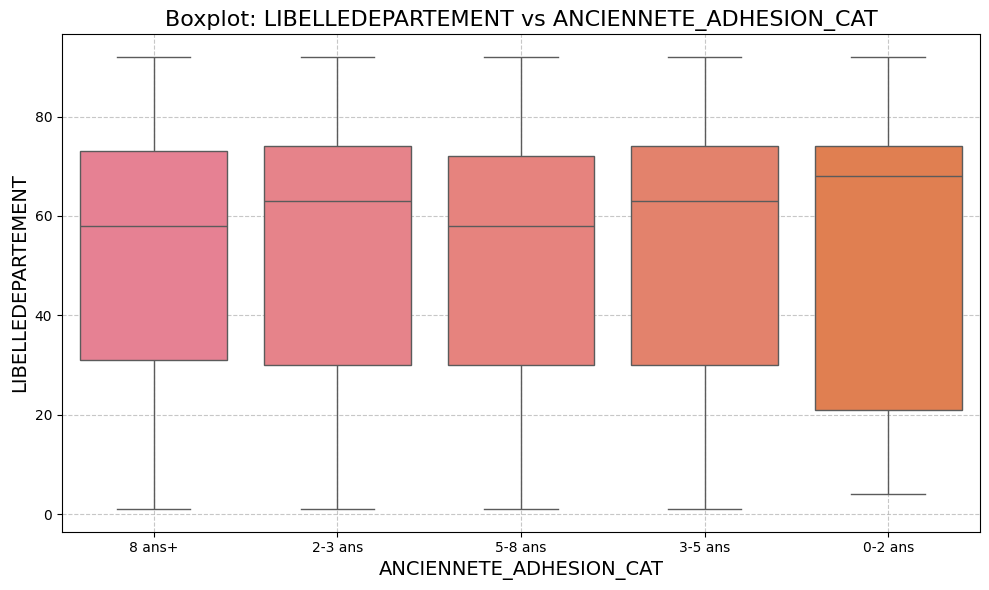

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


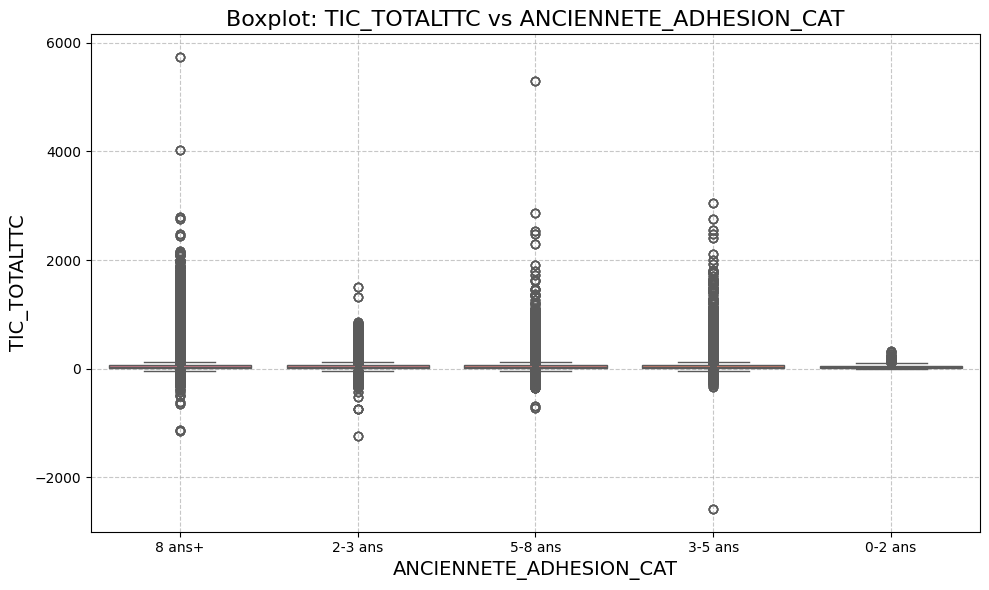

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


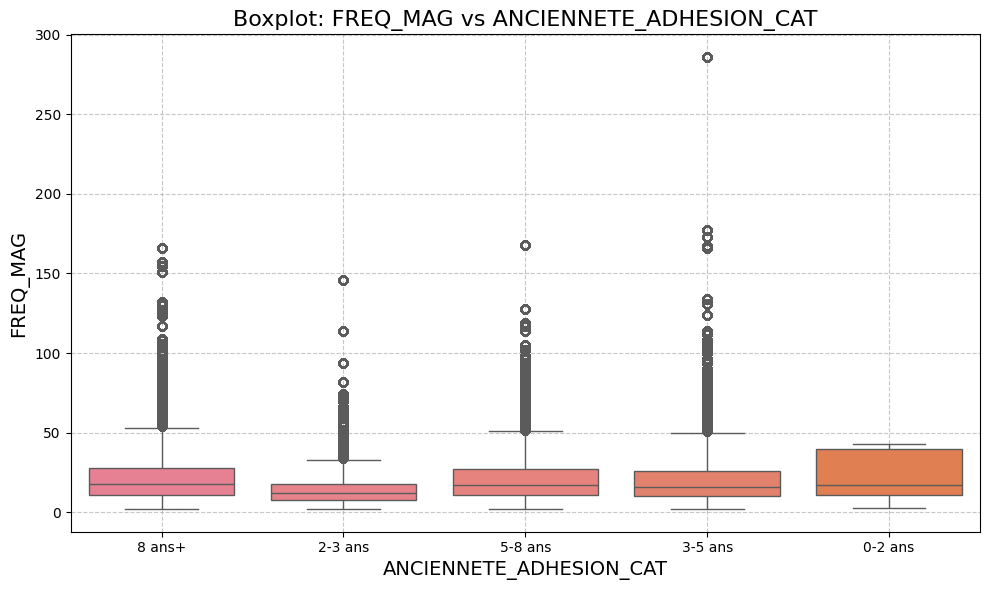

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


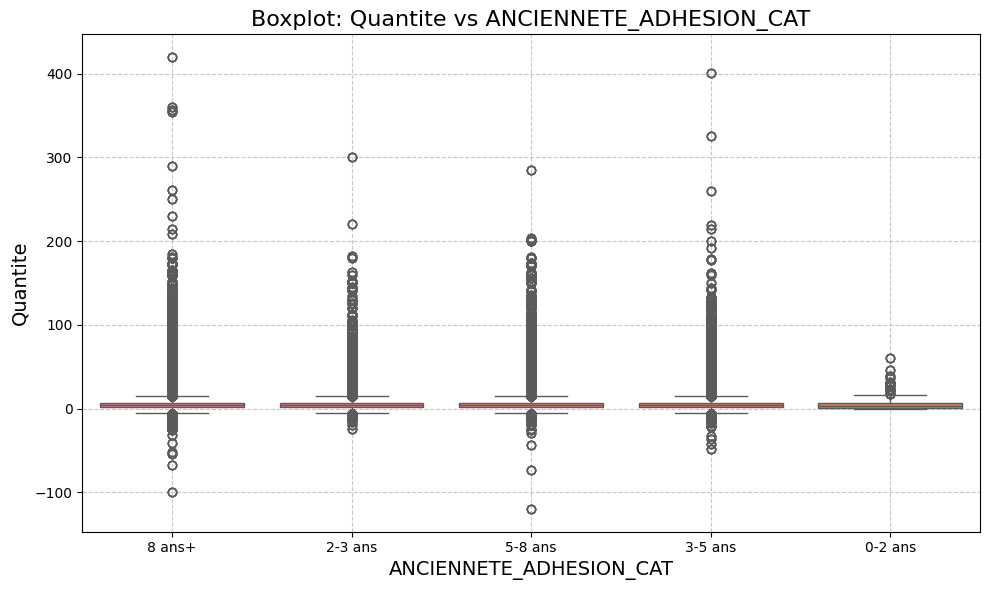

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


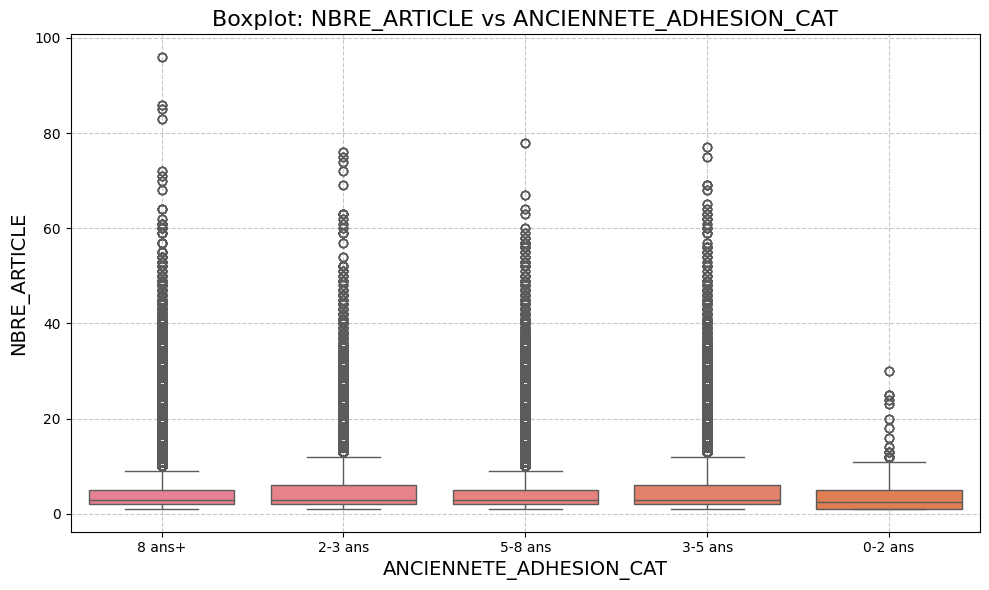

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


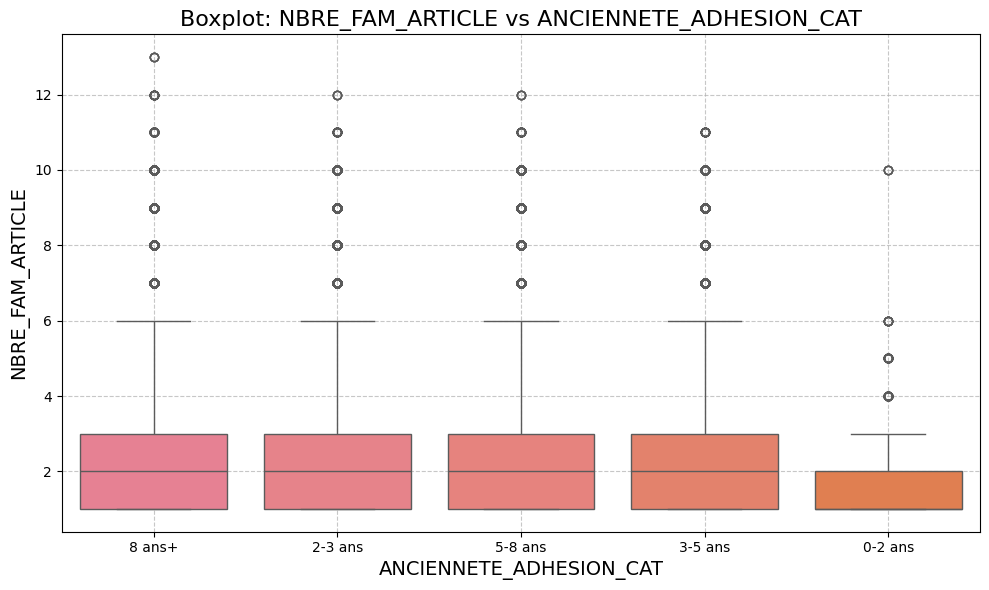

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


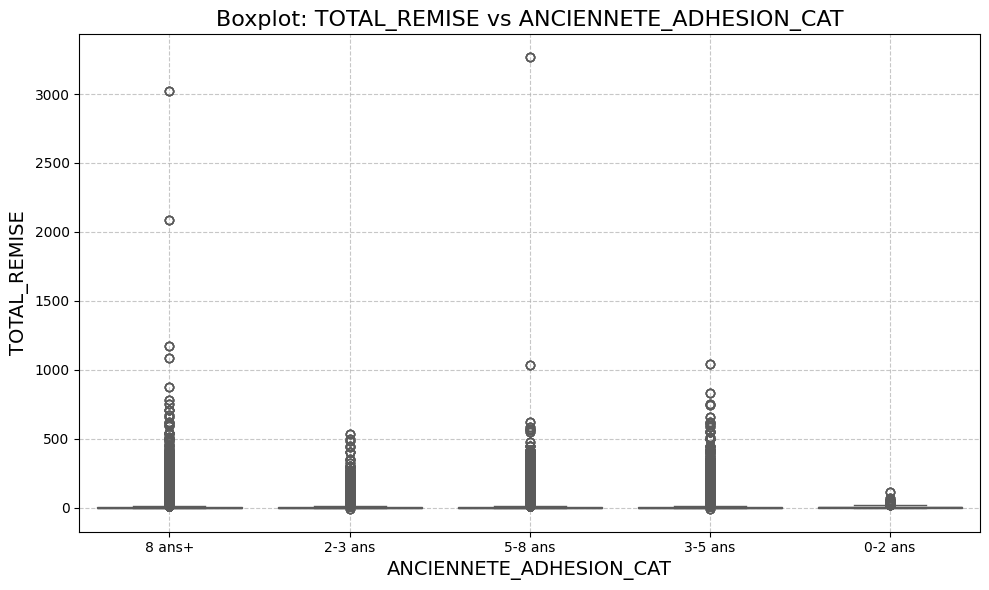

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


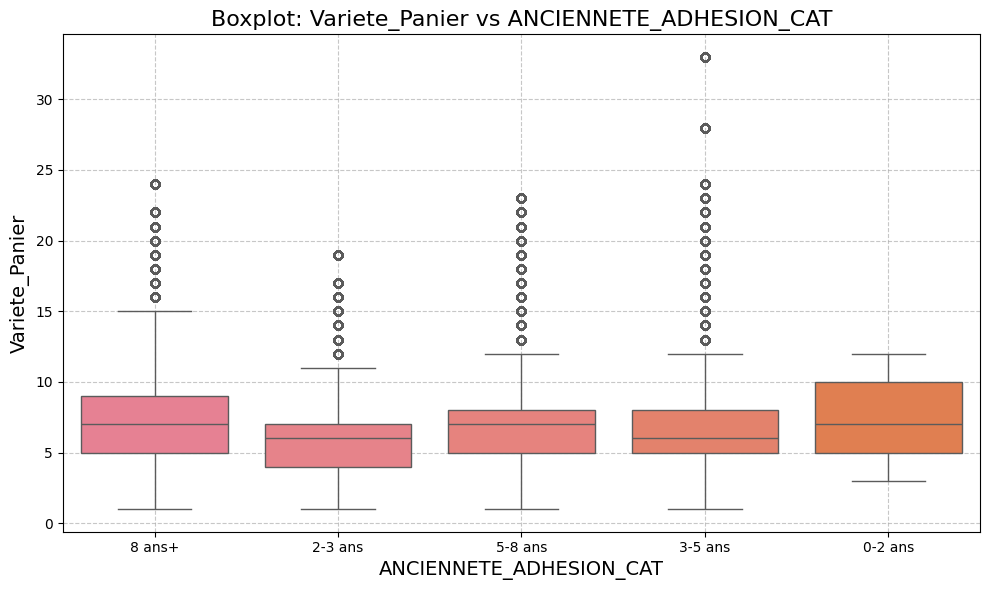

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


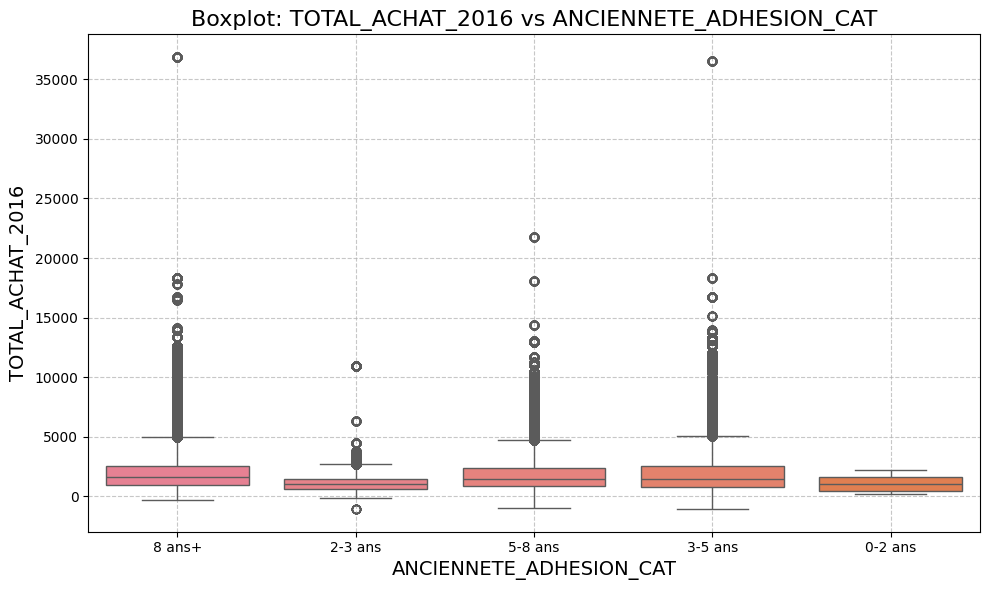

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


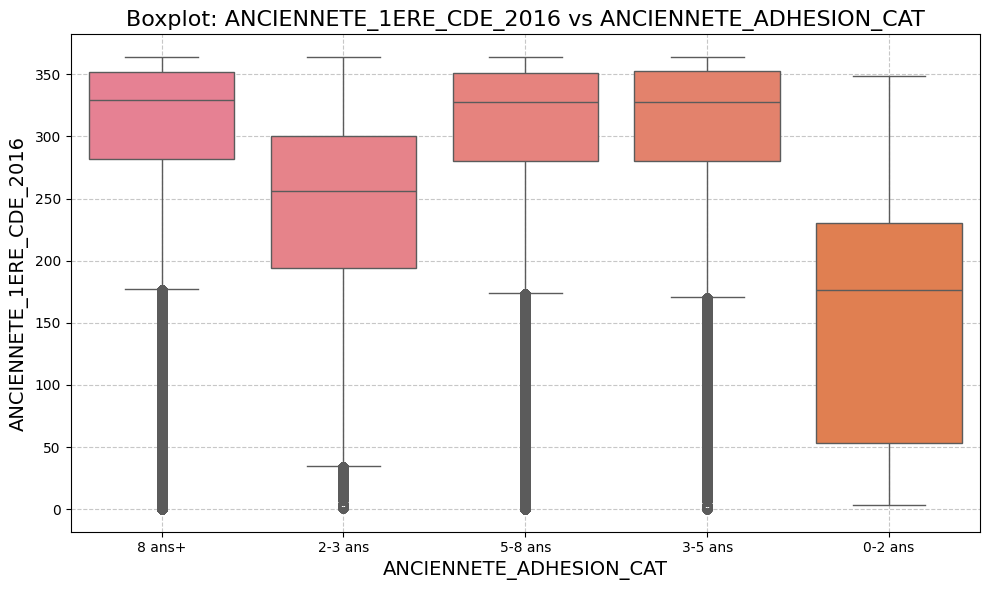

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


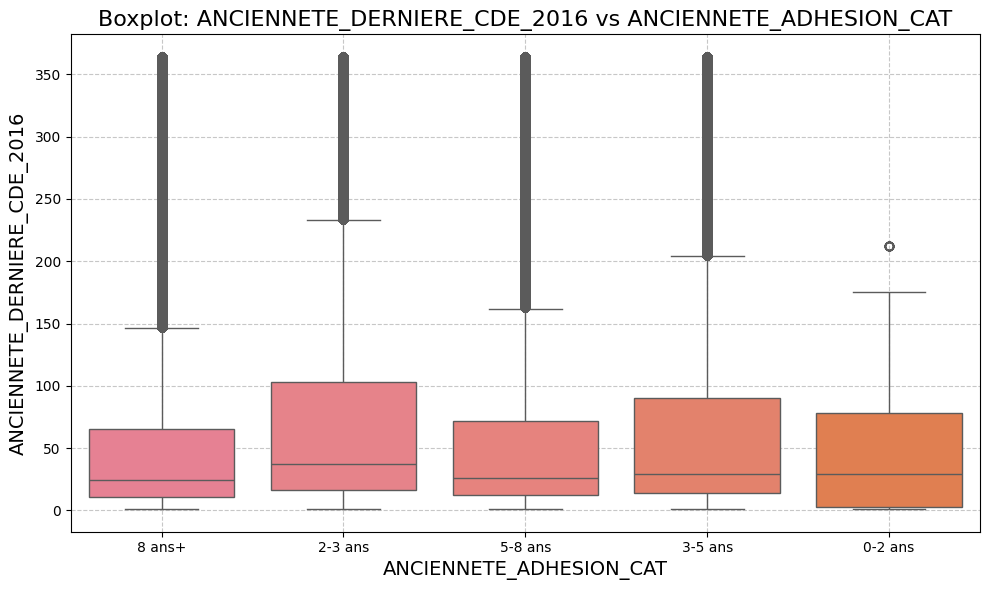

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


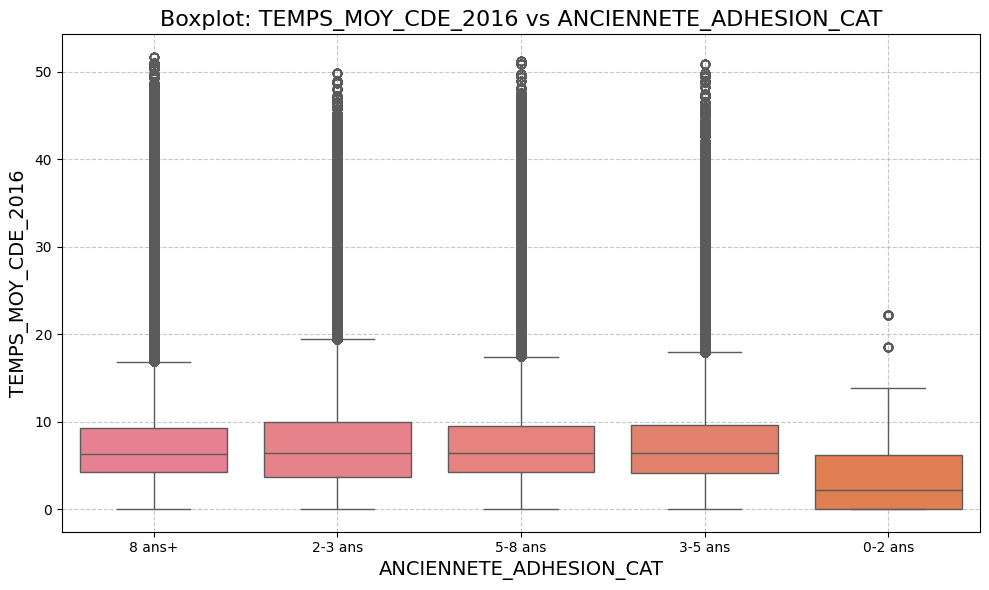

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


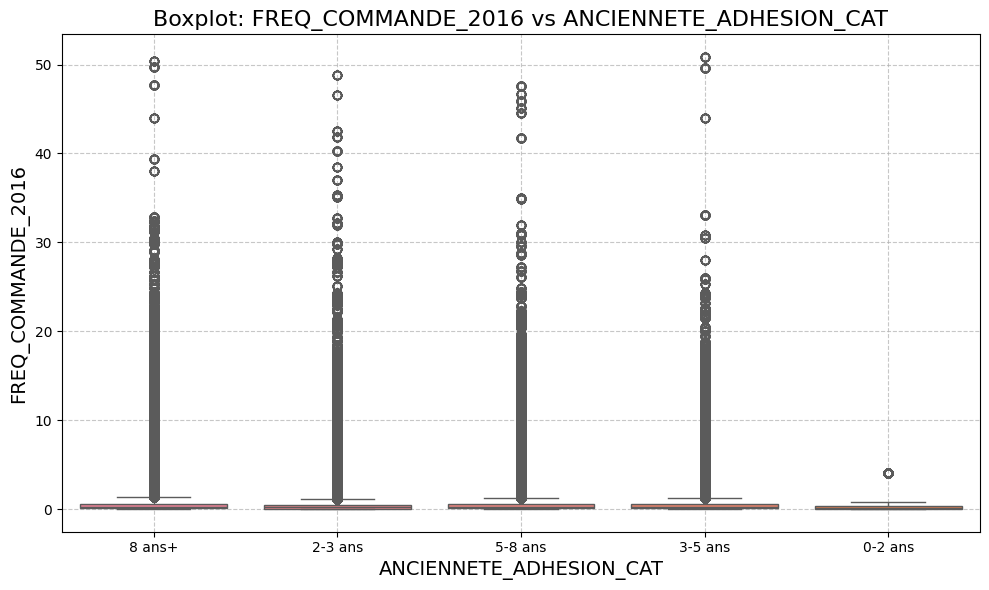

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


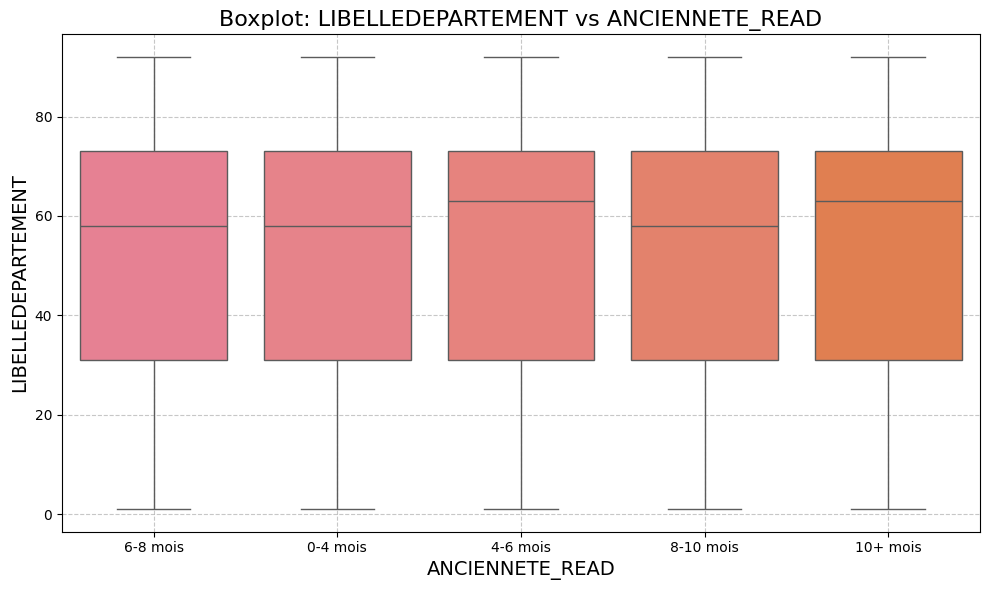

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


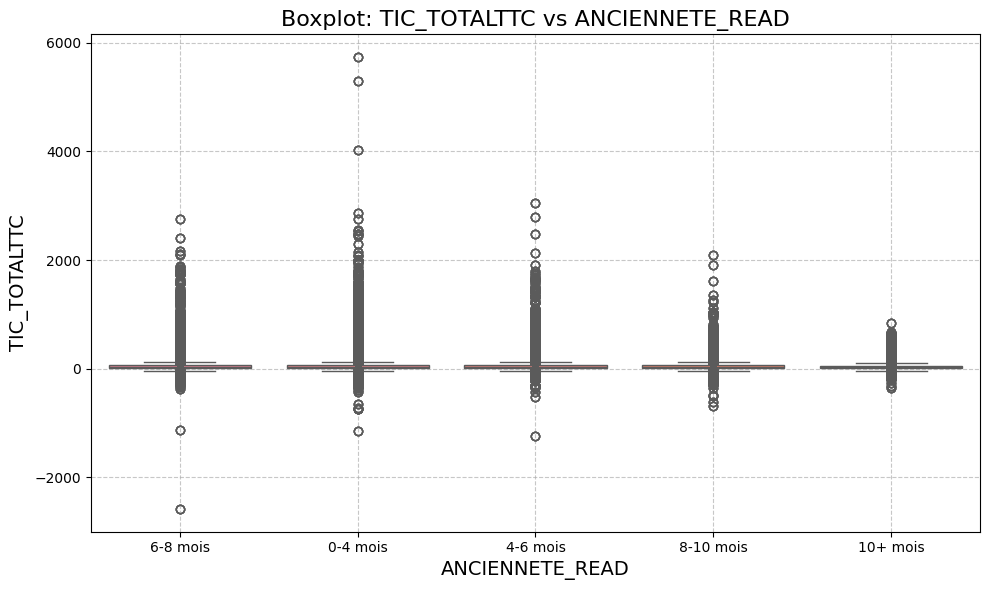

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


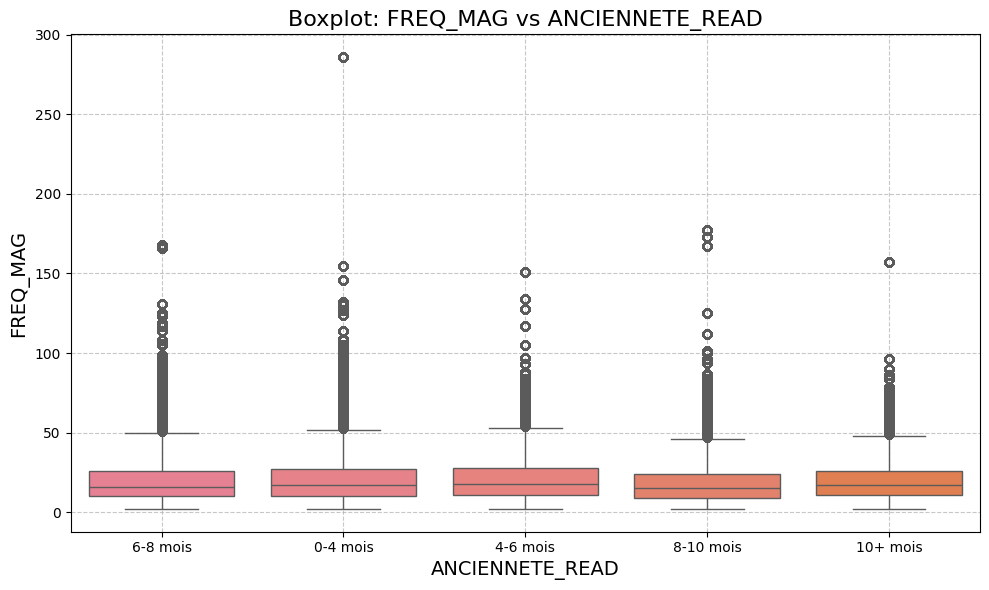

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


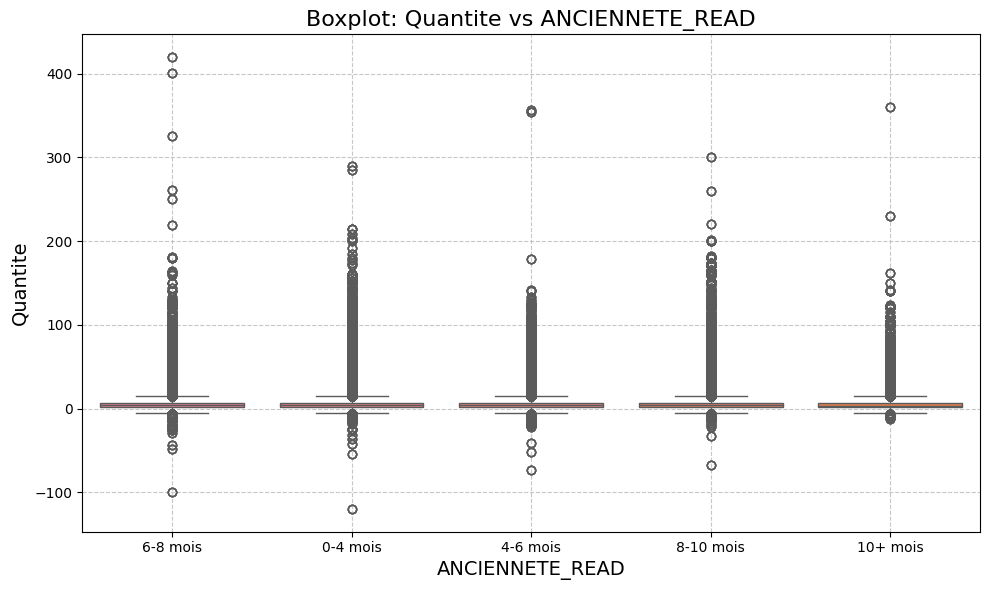

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


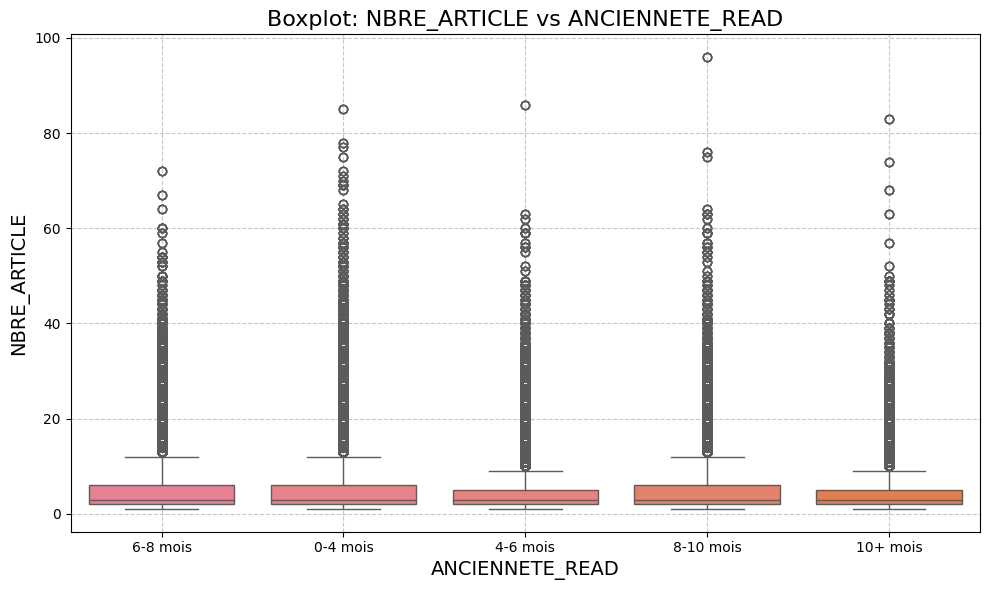

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


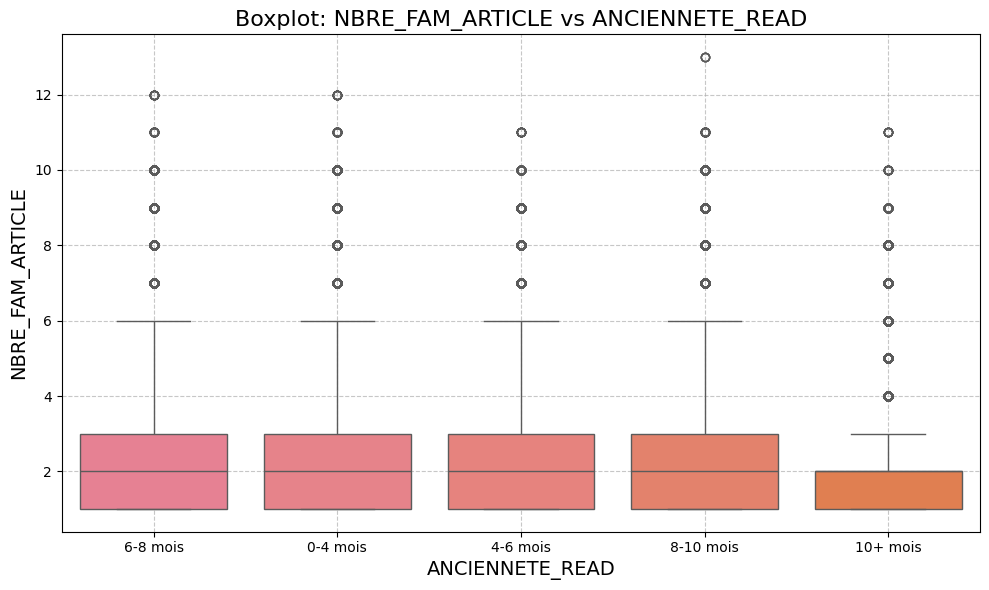

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


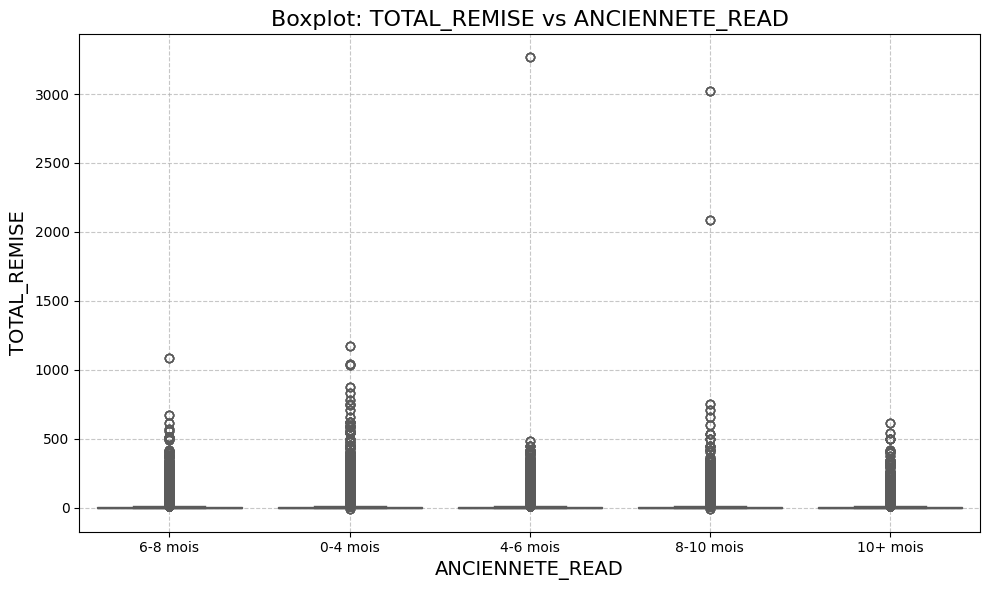

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


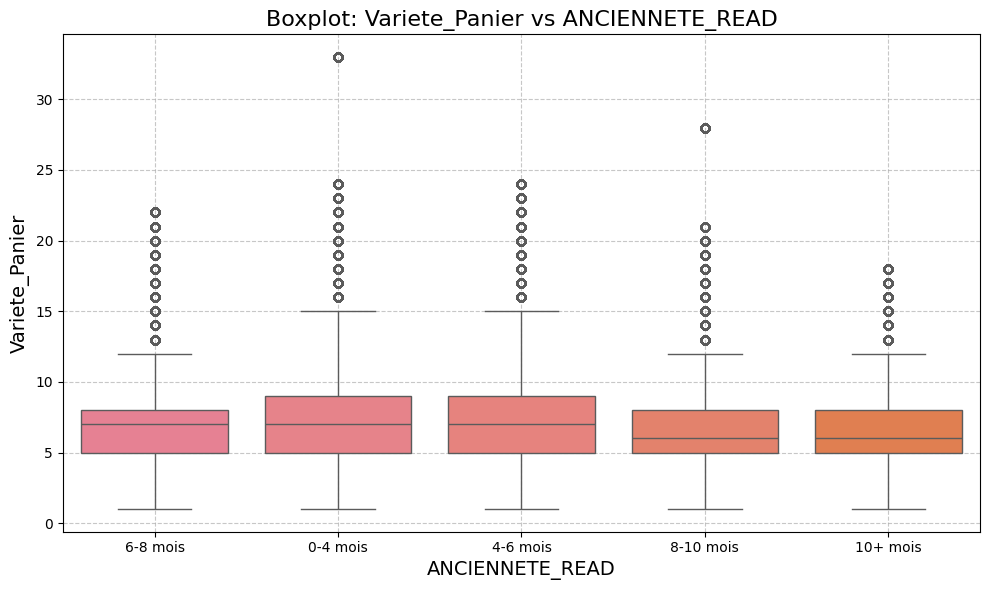

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


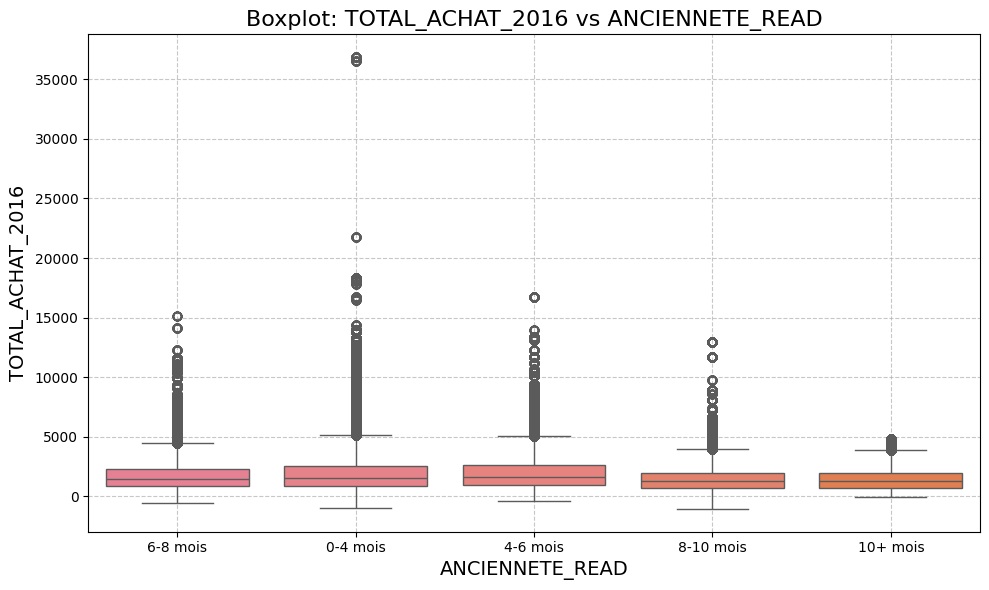

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


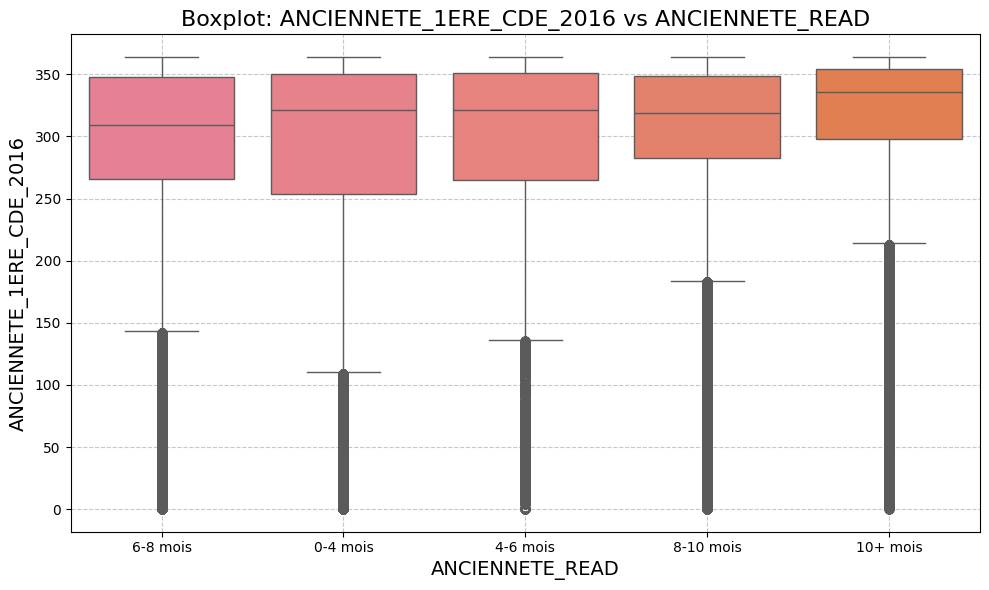

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


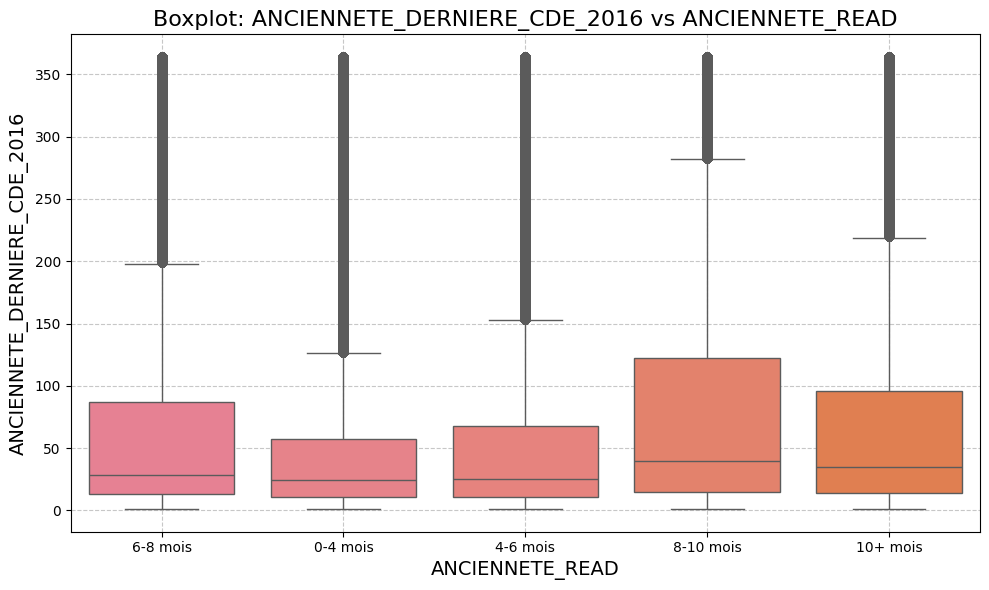

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


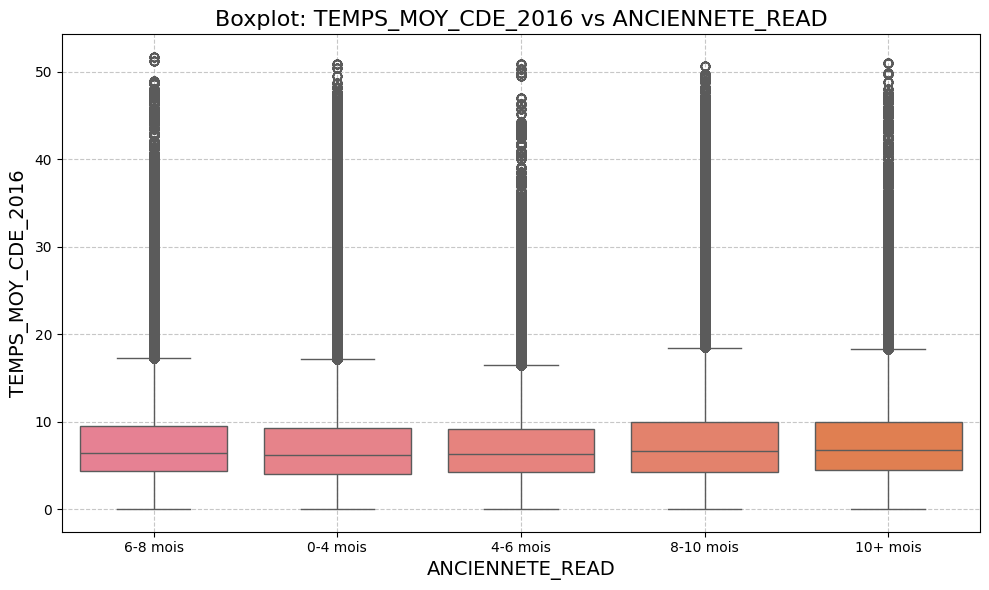

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (5), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


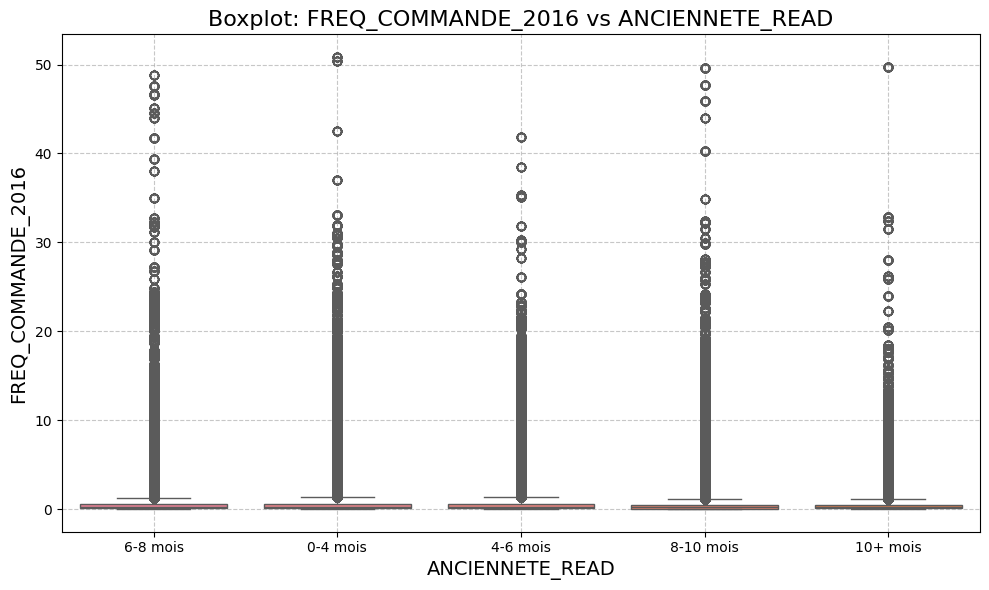

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (4), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


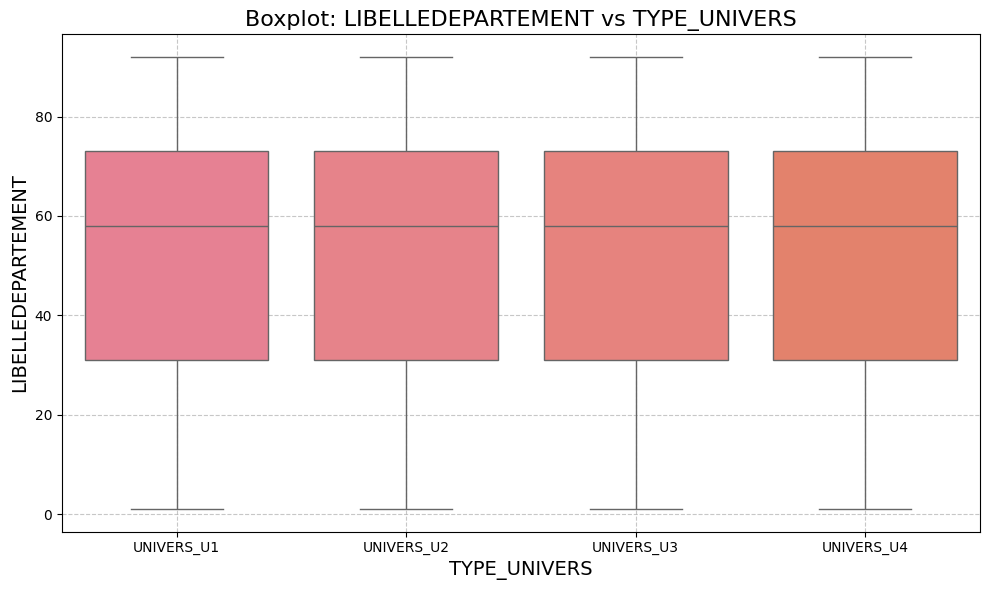

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (4), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


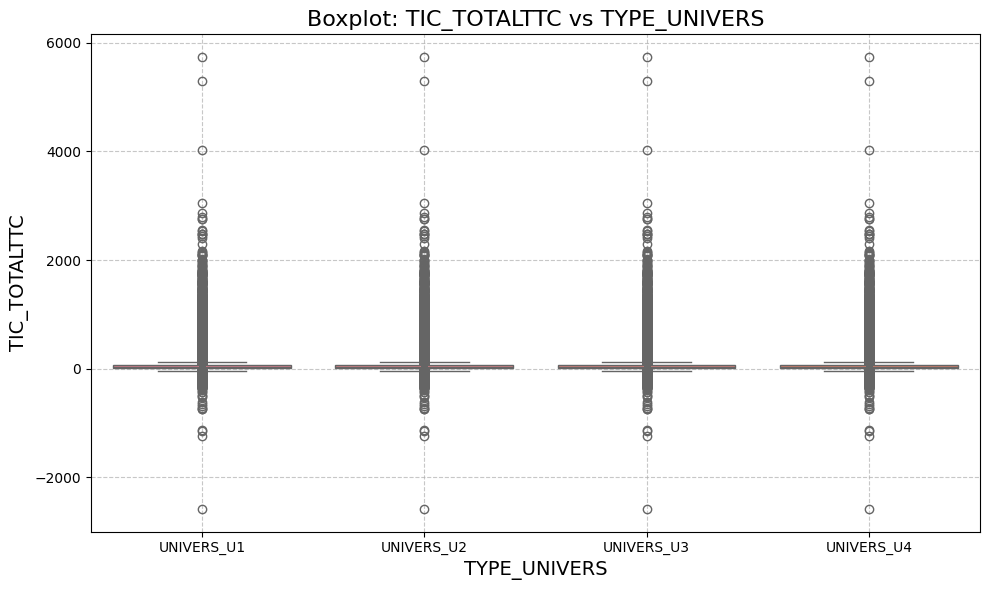

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (4), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


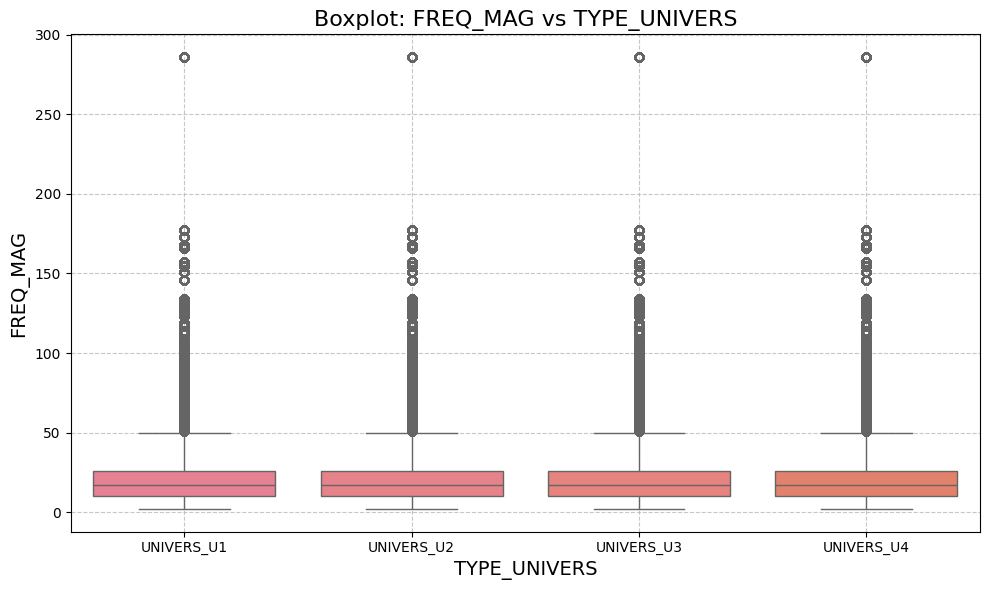

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (4), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


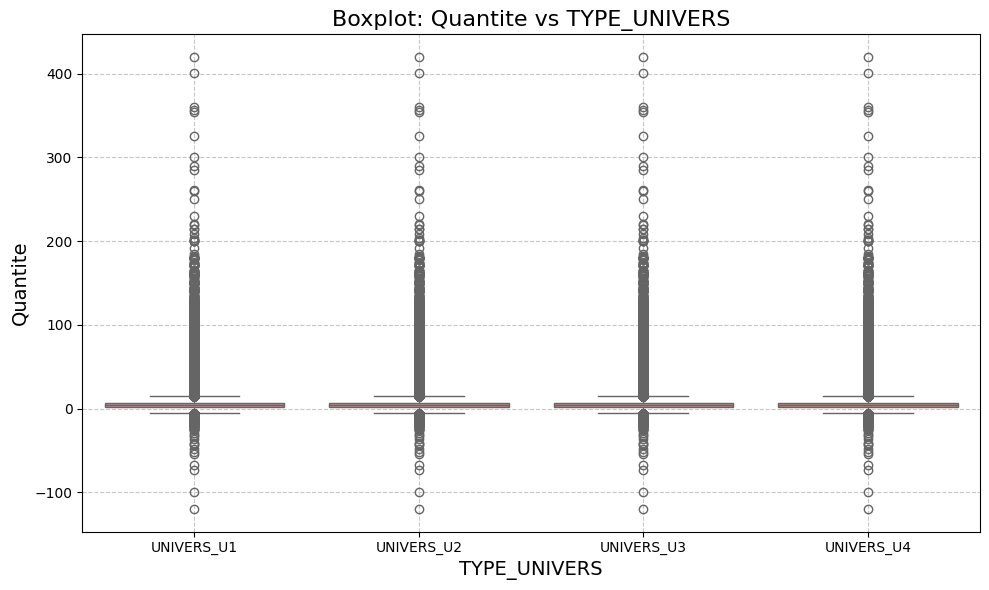

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (4), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


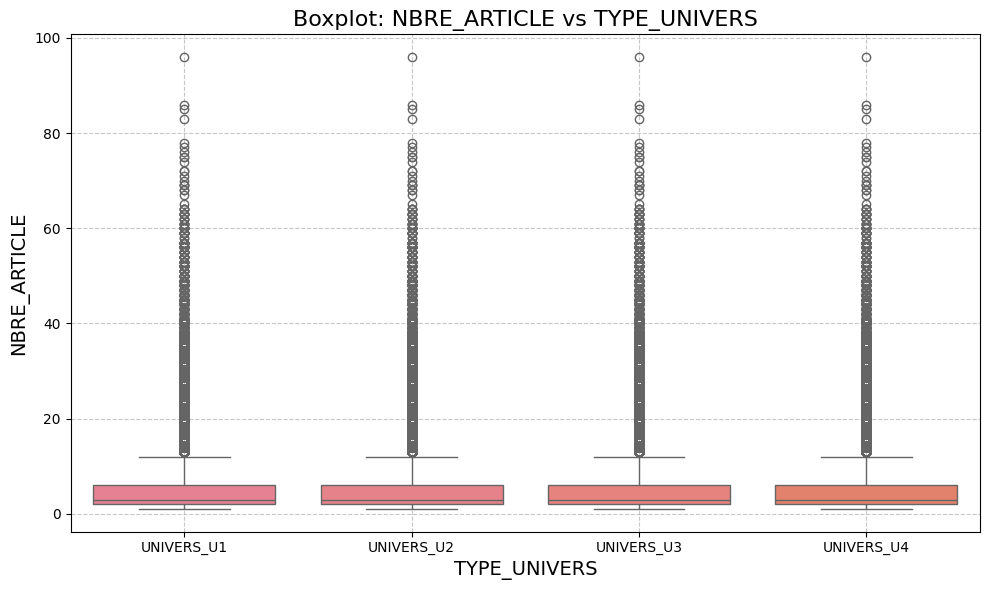

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (4), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


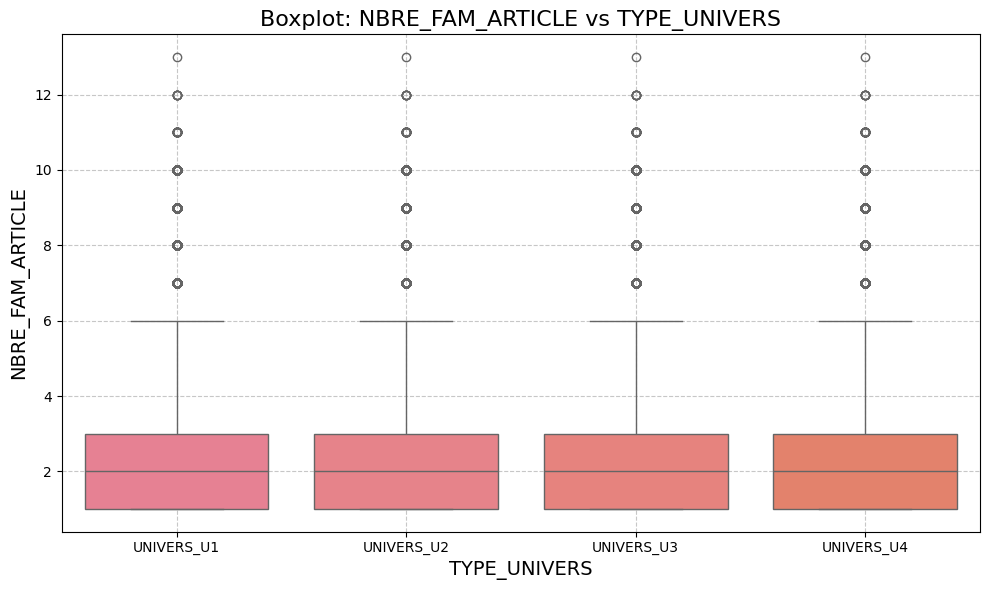

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (4), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


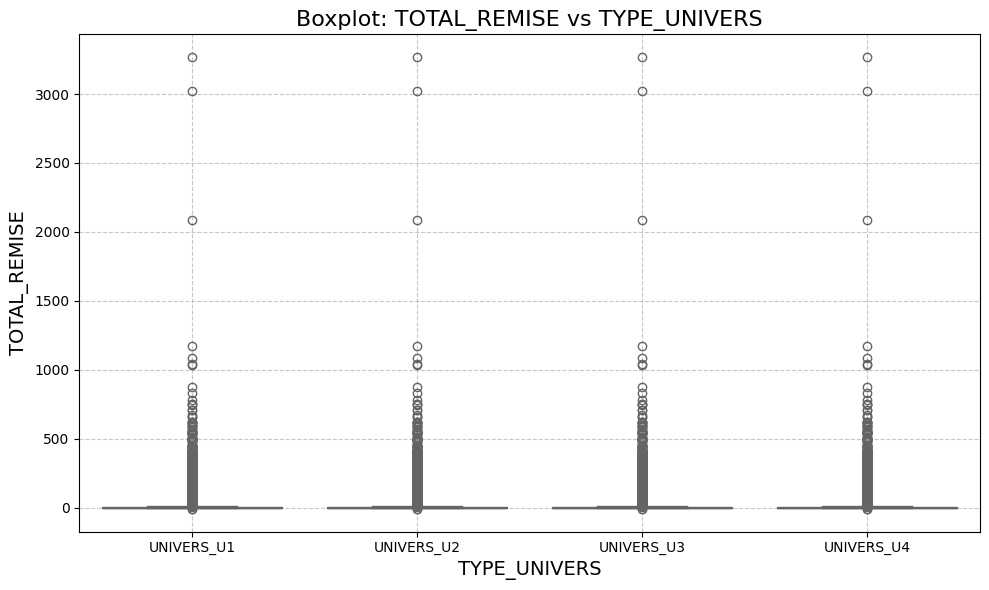

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (4), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


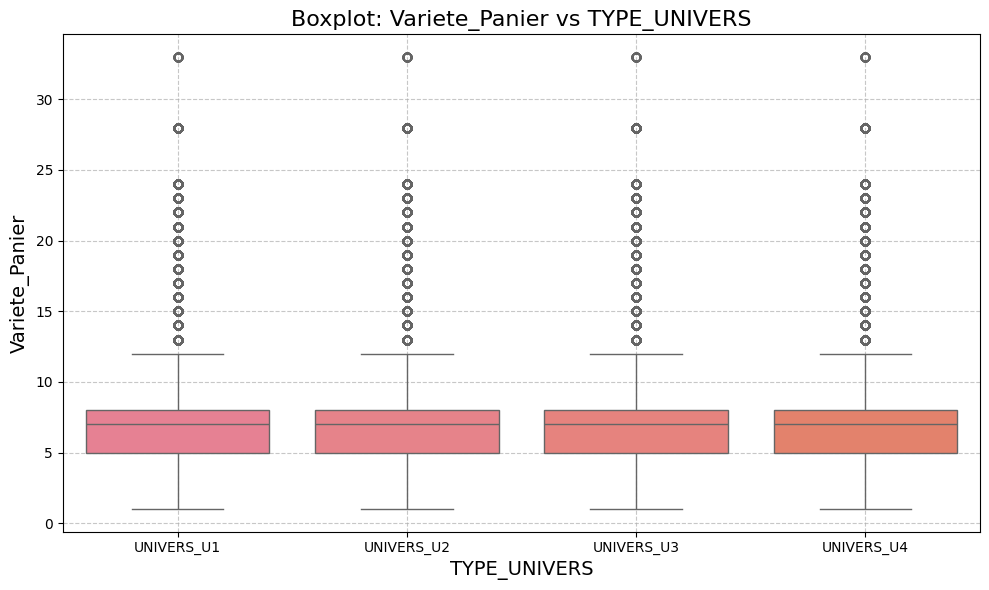

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (4), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


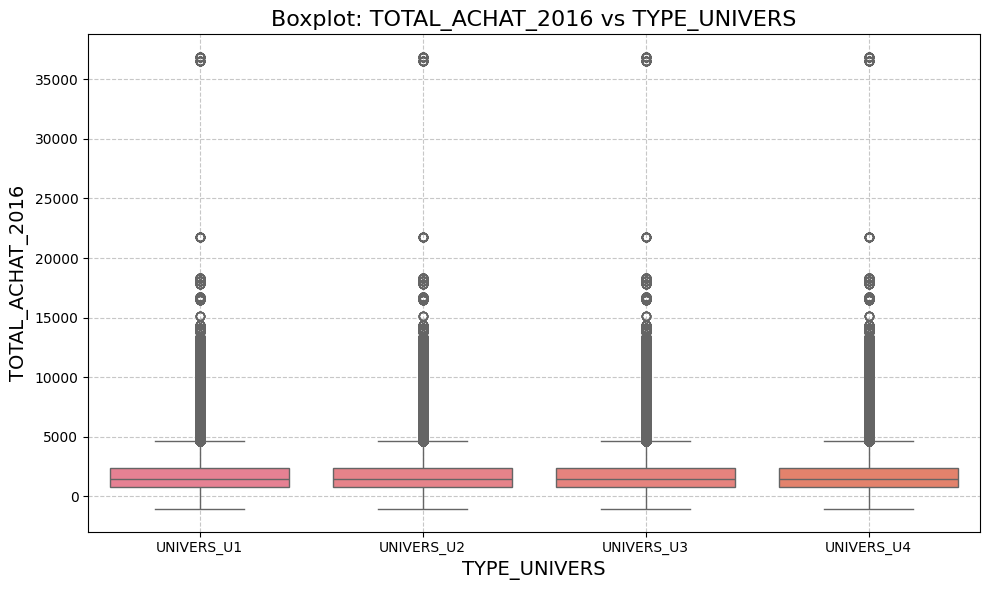

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (4), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


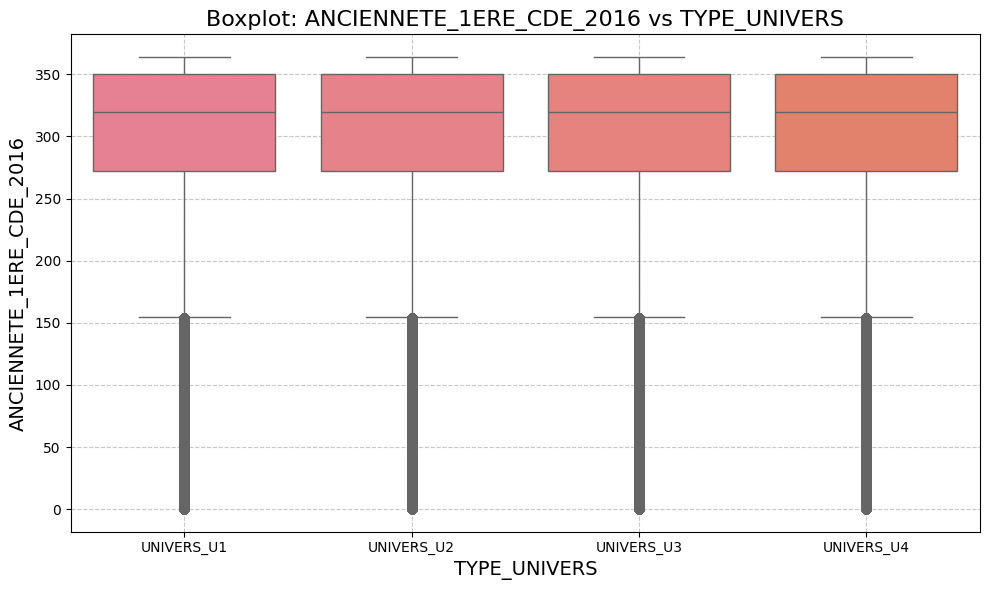

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (4), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


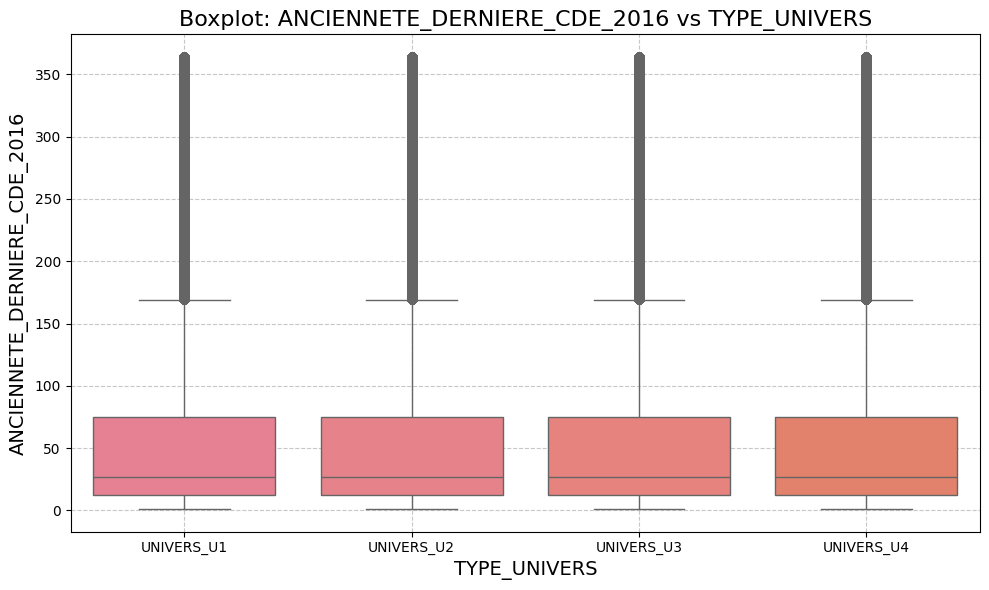

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (4), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


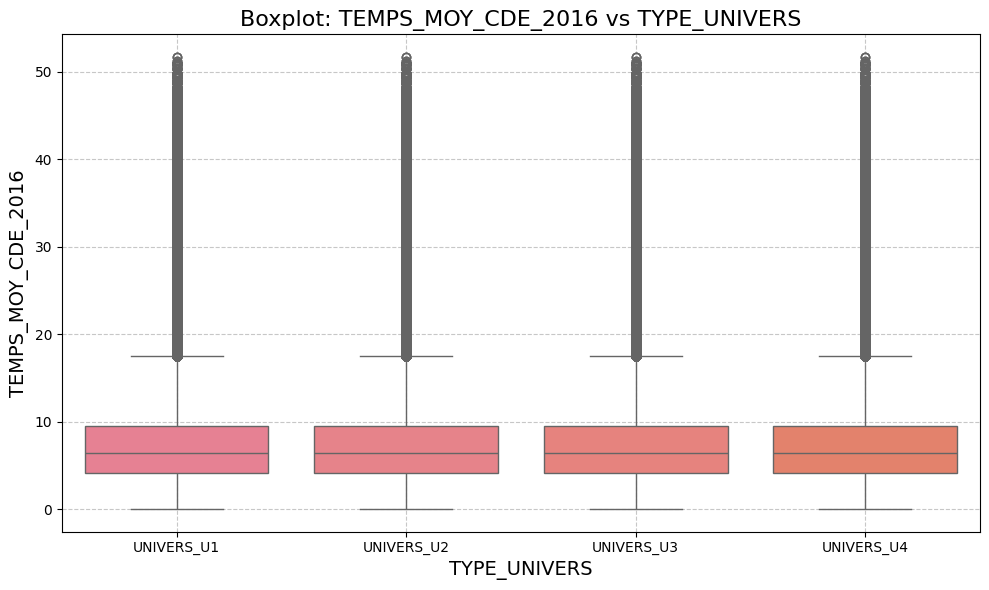

C:\Users\belga\AppData\Local\Temp\ipykernel_2572\4222423811.py:17: UserWarning: The palette list has more values (67) than needed (4), which may not be intended.
  sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)


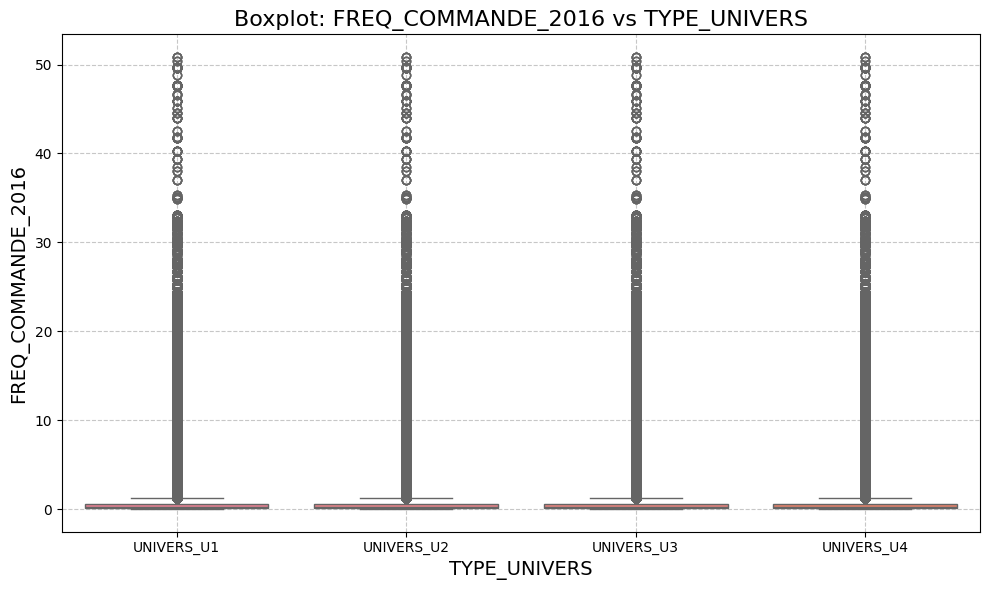

In [57]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import f_oneway

# Définir les variables quantitatives et catégorielles
var_quan = X_BOTANIC.select_dtypes(include=['int64', 'float64']).columns.tolist()
var_cat = X_BOTANIC.select_dtypes(include=['object', 'category']).columns.tolist()

# Utiliser une large palette de couleurs pour éviter les problèmes de catégories multiples
palette = sns.color_palette("husl", len(X_BOTANIC[var_cat[0]].unique()))

# Visualisation de Boxplot
for cat in var_cat:
    for quan in var_quan:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=cat, y=quan, data=X_BOTANIC, palette=palette, showfliers=True, hue=cat, dodge=False)
        plt.title(f'Boxplot: {quan} vs {cat}', fontsize=16)
        plt.xlabel(cat, fontsize=14)
        plt.ylabel(quan, fontsize=14)
        # Ajouter une grille pour plus de lisibilité
        plt.grid(True, linestyle='--', alpha=0.7)
        # Ajustement de la mise en page
        plt.tight_layout()
        # Affichage du graphique
        plt.show()

Suppression des variables corrélées en effectuant le test ANOVA

In [58]:

import pandas as pd
from scipy.stats import f_oneway

var_cat = ['MAGASIN', 'SEXE', 'AGE_GROUP', 'ANCIENNETE_ADHESION_CAT','ANCIENNETE_READ', 'LIBELLEDEPARTEMENT'] 
# Remplacez par vos variables quantitatives
var_quan = ['Quantite', 'NBRE_ARTICLE', 'NBRE_FAM_ARTICLE', 'TOTAL_REMISE', 'Variete_Panier', 'UNIVERS_PREFERE', 'TOTAL_ACHAT_2016', 'ANCIENNETE_1ERE_CDE_2016', 'ANCIENNETE_DERNIERE_CDE_2016', 'TEMPS_MOY_CDE_2016', 'FREQ_COMMANDE_2016']

# Initialiser une liste pour stocker les variables non significatives
non_significative_vars = set(var_quan)

# Test ANOVA pour chaque combinaison de variable catégorielle et quantitative
for cat in var_cat:
    for quan in var_quan:
        groups = [X_BOTANIC[quan][X_BOTANIC[cat] == level].dropna() for level in X_BOTANIC[cat].unique()]
        
        # Si tous les groupes ont des valeurs constantes, passer à la prochaine variation
        if all(len(group.unique()) <= 1 for group in groups):
            print(f"Tous les groupes de {cat} ont des valeurs constantes pour la variable {quan}. ANOVA non applicable.\n")
            continue

        # Effectuer le test ANOVA
        try:
            anova_result = f_oneway(*groups)
            print(f'ANOVA Test pour {quan} vs {cat}:')
            print(f'F-statistic: {anova_result.statistic}')
            print(f'p-value: {anova_result.pvalue}')
            
            if anova_result.pvalue < 0.05:
                non_significative_vars.discard(quan)  # Si significatif, retirer de la liste
        except Exception as e:
            print(f"Une erreur s'est produite pour {cat} vs {quan} : {e}")

print(f"Variables quantitatives non significatives (p-value >= 0.05) après ANOVA : {non_significative_vars}")

# Supprimer les variables non significatives du DataFrame
X_BOTANIC= X_BOTANIC.drop(columns=non_significative_vars)

print("Les variables non significatives ont été supprimées.")
print(X_BOTANIC.head())

ANOVA Test pour Quantite vs MAGASIN:
F-statistic: 1590.7825526602553
p-value: 0.0
ANOVA Test pour NBRE_ARTICLE vs MAGASIN:
F-statistic: 2926.788726541346
p-value: 0.0
ANOVA Test pour NBRE_FAM_ARTICLE vs MAGASIN:
F-statistic: 896.8287002549015
p-value: 0.0
ANOVA Test pour TOTAL_REMISE vs MAGASIN:
F-statistic: 234.48083588994947
p-value: 0.0
ANOVA Test pour Variete_Panier vs MAGASIN:
F-statistic: 6382.297327418367
p-value: 0.0
ANOVA Test pour UNIVERS_PREFERE vs MAGASIN:
F-statistic: 49.97259129261113
p-value: 0.0
ANOVA Test pour TOTAL_ACHAT_2016 vs MAGASIN:
F-statistic: 1807.90680891972
p-value: 0.0
ANOVA Test pour ANCIENNETE_1ERE_CDE_2016 vs MAGASIN:
F-statistic: 2674.5077872507763
p-value: 0.0
ANOVA Test pour ANCIENNETE_DERNIERE_CDE_2016 vs MAGASIN:
F-statistic: 885.5581253953421
p-value: 0.0
ANOVA Test pour TEMPS_MOY_CDE_2016 vs MAGASIN:
F-statistic: 633.2833925239038
p-value: 0.0
ANOVA Test pour FREQ_COMMANDE_2016 vs MAGASIN:
F-statistic: 207.80082612350708
p-value: 0.0
ANOVA Test po

In [59]:
X_BOTANIC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7408792 entries, 0 to 7408791
Data columns (total 20 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   MAGASIN                       object 
 1   SEXE                          object 
 2   AGE_GROUP                     object 
 3   ANCIENNETE_ADHESION_CAT       object 
 4   ANCIENNETE_READ               object 
 5   LIBELLEDEPARTEMENT            int64  
 6   TIC_TOTALTTC                  float64
 7   FREQ_MAG                      int64  
 8   TYPE_UNIVERS                  object 
 9   Quantite                      float64
 10  NBRE_ARTICLE                  int64  
 11  NBRE_FAM_ARTICLE              int64  
 12  TOTAL_REMISE                  float64
 13  Variete_Panier                int64  
 14  UNIVERS_PREFERE               int32  
 15  TOTAL_ACHAT_2016              float64
 16  ANCIENNETE_1ERE_CDE_2016      int64  
 17  ANCIENNETE_DERNIERE_CDE_2016  float64
 18  TEMPS_MOY_CDE_2016    

In [60]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import f_oneway

# Supposons que nous avons déjà un DataFrame X_BOTANIC
# Définir les variables quantitatives
var_quan = X_BOTANIC.select_dtypes(include=['int64', 'float64']).columns.tolist()
# Définir les variables catégorielles
var_cat = X_BOTANIC.select_dtypes(include=['object']).columns.tolist()
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# S'assurer que les colonnes existent
if 'category_col' in X_BOTANIC.columns and 'numeric_col' in X_BOTANIC.columns:
    
    # Visualisation de KDE Plot (Kernel Density Estimate Plot)
    plt.figure(figsize=(10, 6))
    
    # Tracer KDE pour chaque catégorie
    for category in X_BOTANIC['category_col'].unique():
        subset = X_BOTANIC[X_BOTANIC['category_col'] == category]
        sns.kdeplot(subset['numeric_col'], label=category, shade=True)
    
    # Titres et labels
    plt.title('KDE Plot: Variable numérique par catégorie ordinale')
    plt.xlabel('Variable numérique')
    plt.ylabel('Densité')
    plt.legend(title='Catégorie')
    
    # Affichage du plot
    plt.show()
else:
    print("Les colonnes 'category_col' et 'numeric_col' doivent exister dans le DataFrame.")

Les colonnes 'category_col' et 'numeric_col' doivent exister dans le DataFrame.


ANALYSE UNIVARIÉE

ANALYSE UNIVARIÉE DES VARIABLES CATÉGORIELLES

['MAGASIN', 'SEXE', 'AGE_GROUP', 'ANCIENNETE_ADHESION_CAT', 'ANCIENNETE_READ', 'TYPE_UNIVERS']


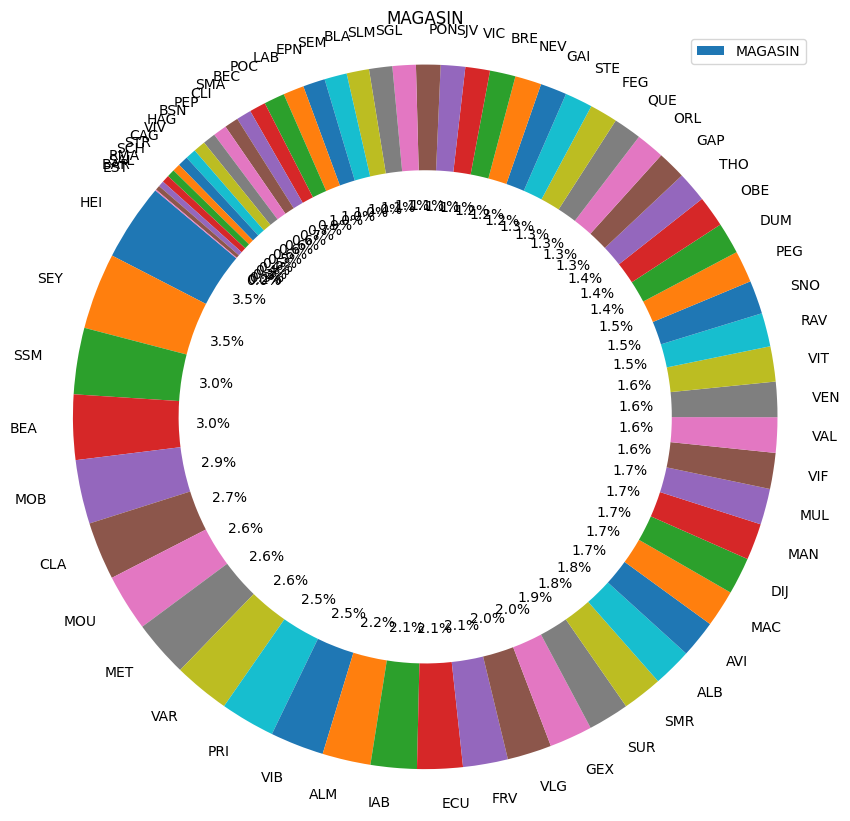

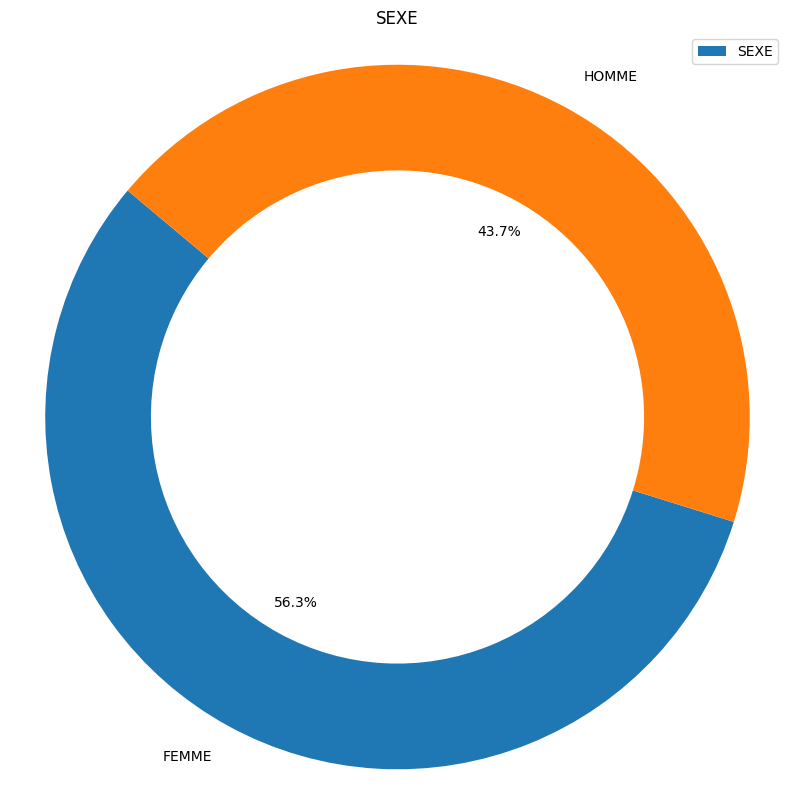

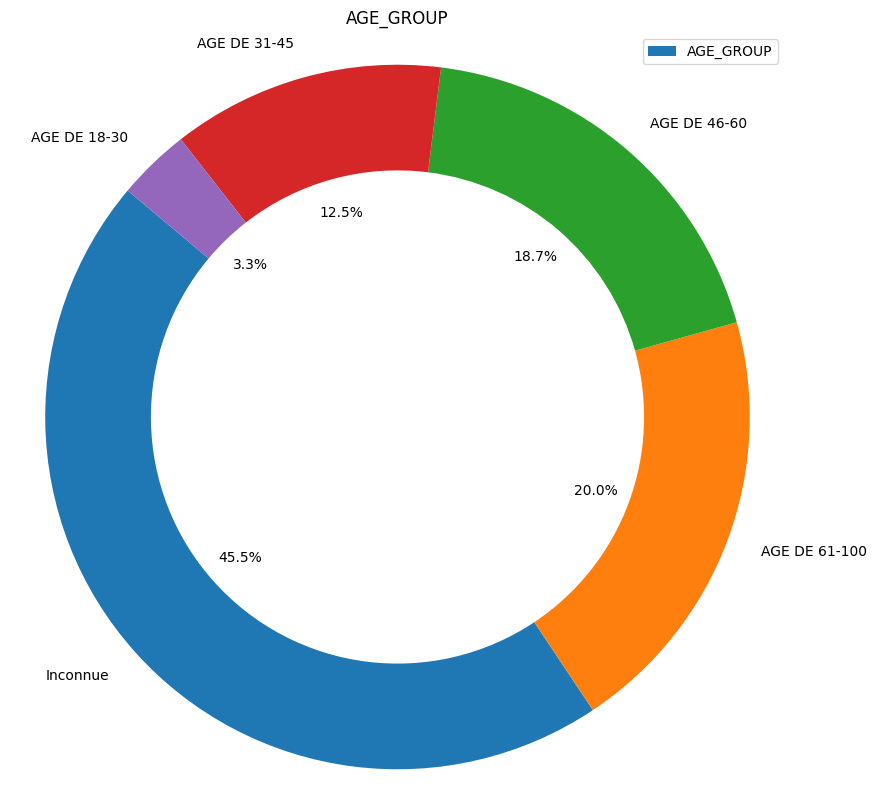

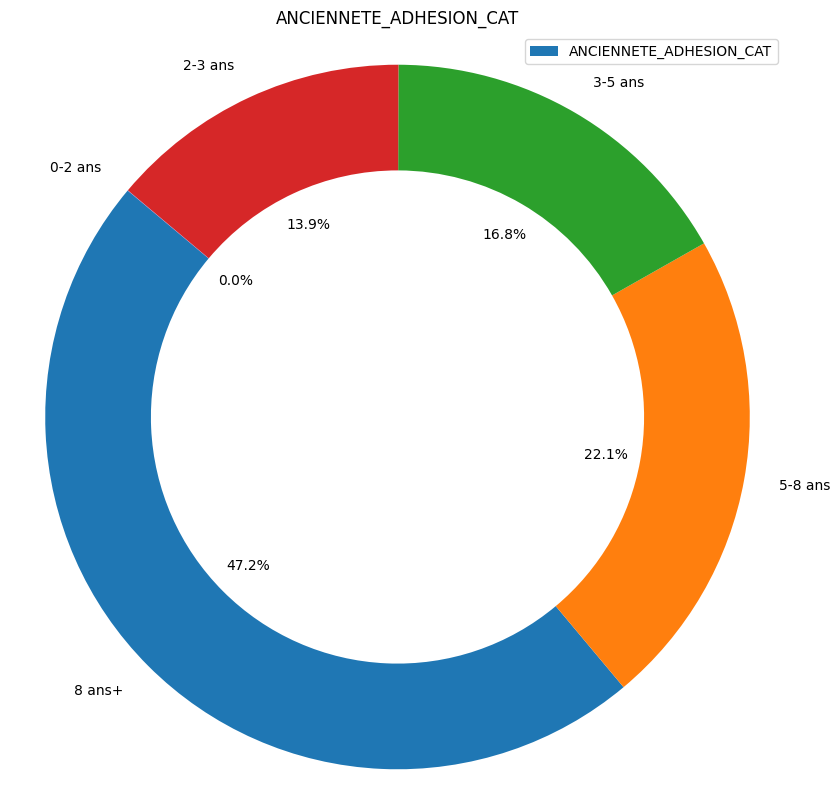

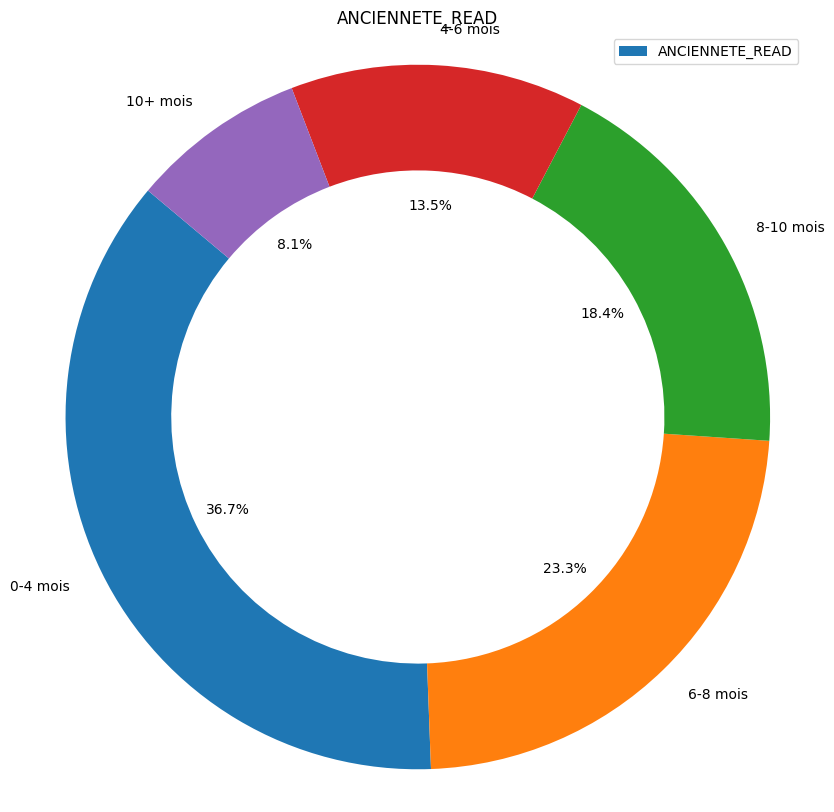

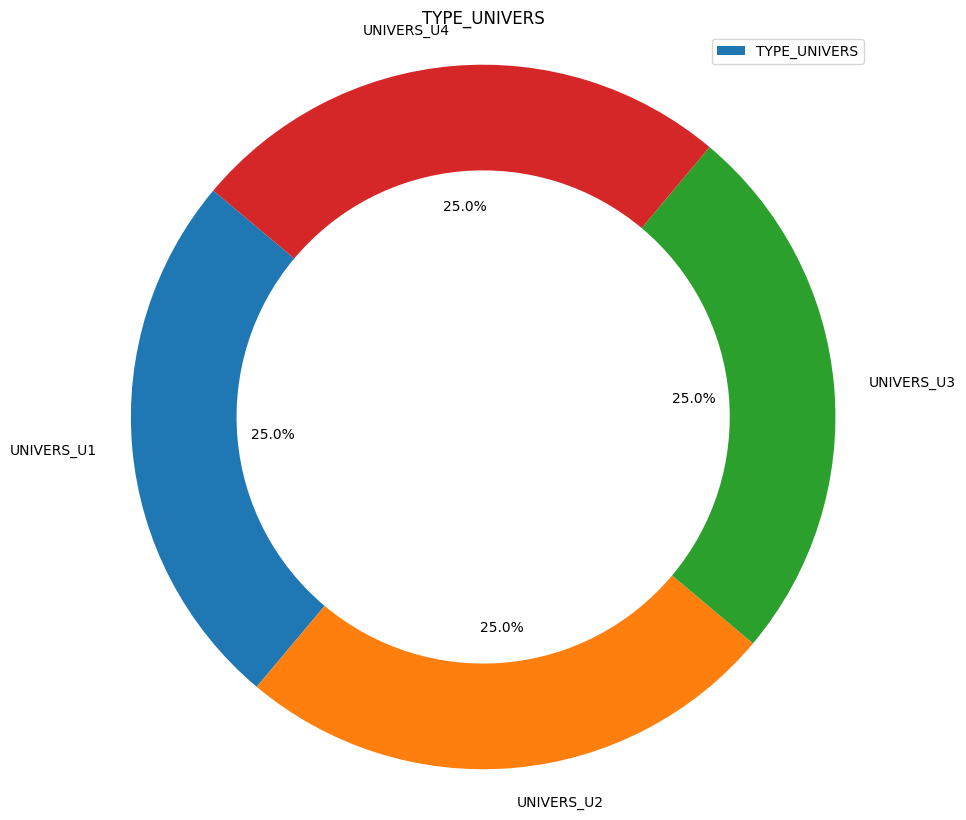

In [61]:
# Importation des bibliothèques nécessaires
import pandas as pd
import matplotlib.pyplot as plt

# Définition des variables catégorielles
var_cat = X_BOTANIC.select_dtypes(include=['object']).columns.tolist()
print(var_cat)

# Générer un graphique en donut pour chaque variable catégorielle
for var in var_cat:
    values = X_BOTANIC[var].value_counts()
    plt.figure(figsize=(10,10))
    plt.pie(values, labels=values.index, autopct='%1.1f%%', startangle=140, wedgeprops={'width': 0.3})
    plt.title(var)
    plt.axis('equal')  # Assure que le donut est rond
    plt.legend([var], loc='upper right')
    plt.show()

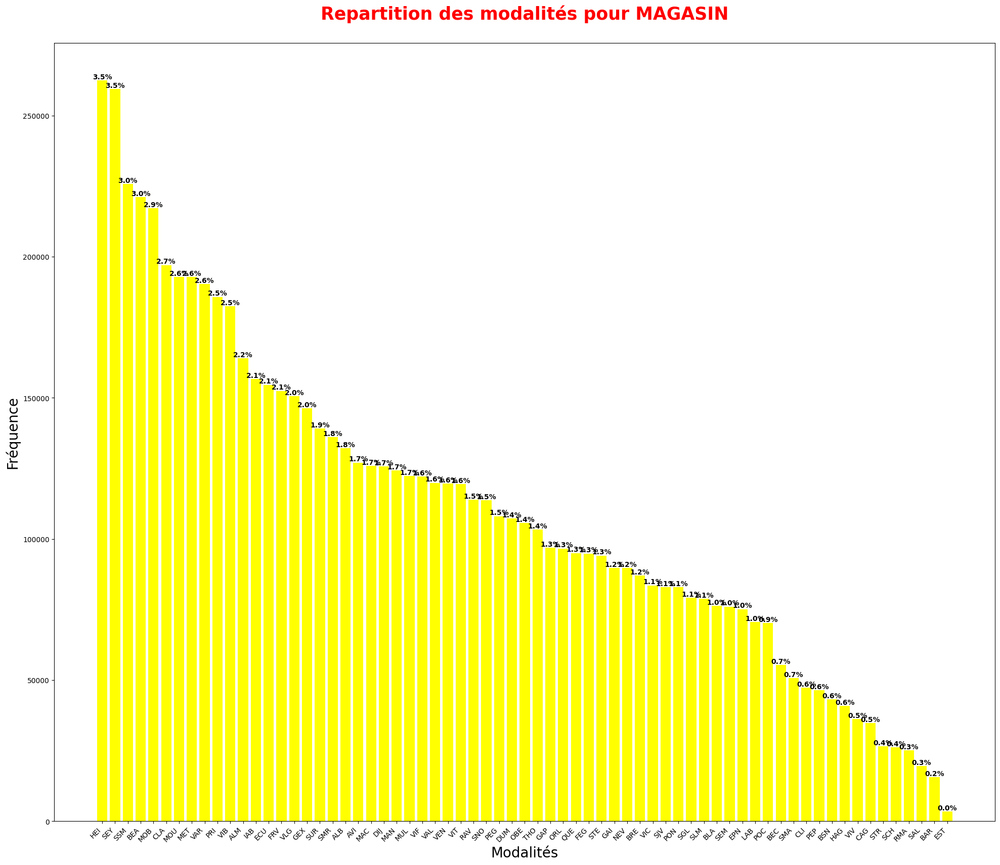

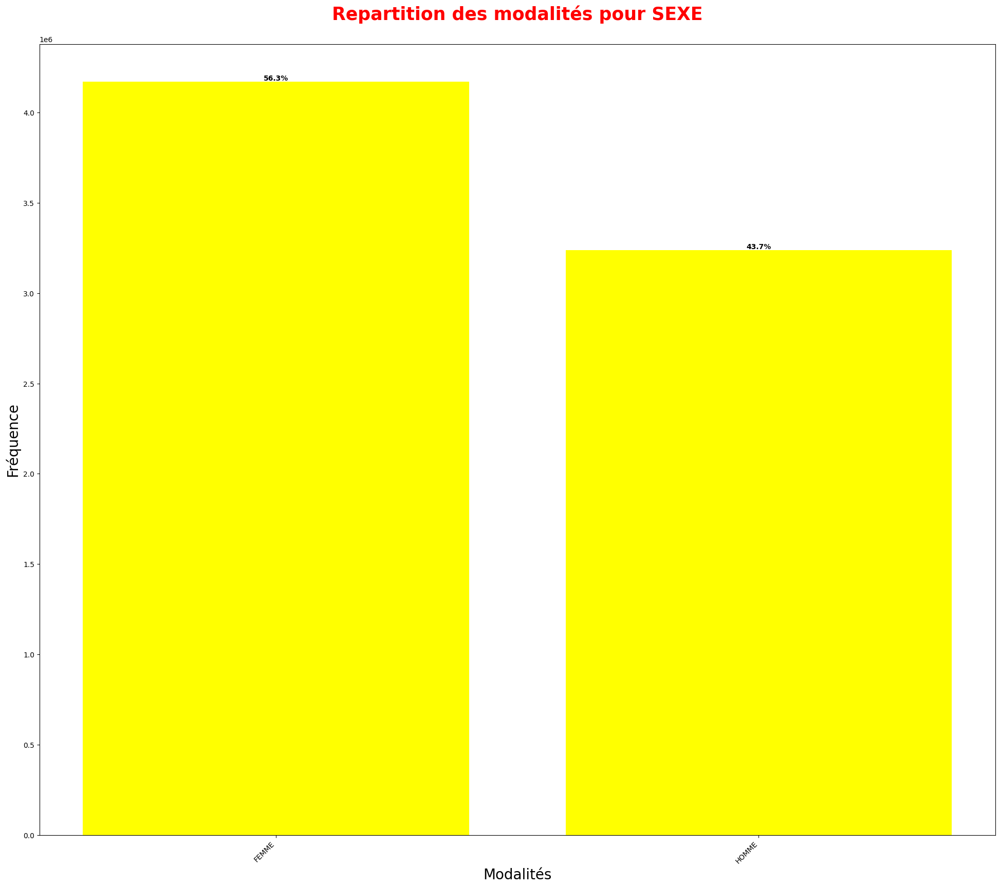

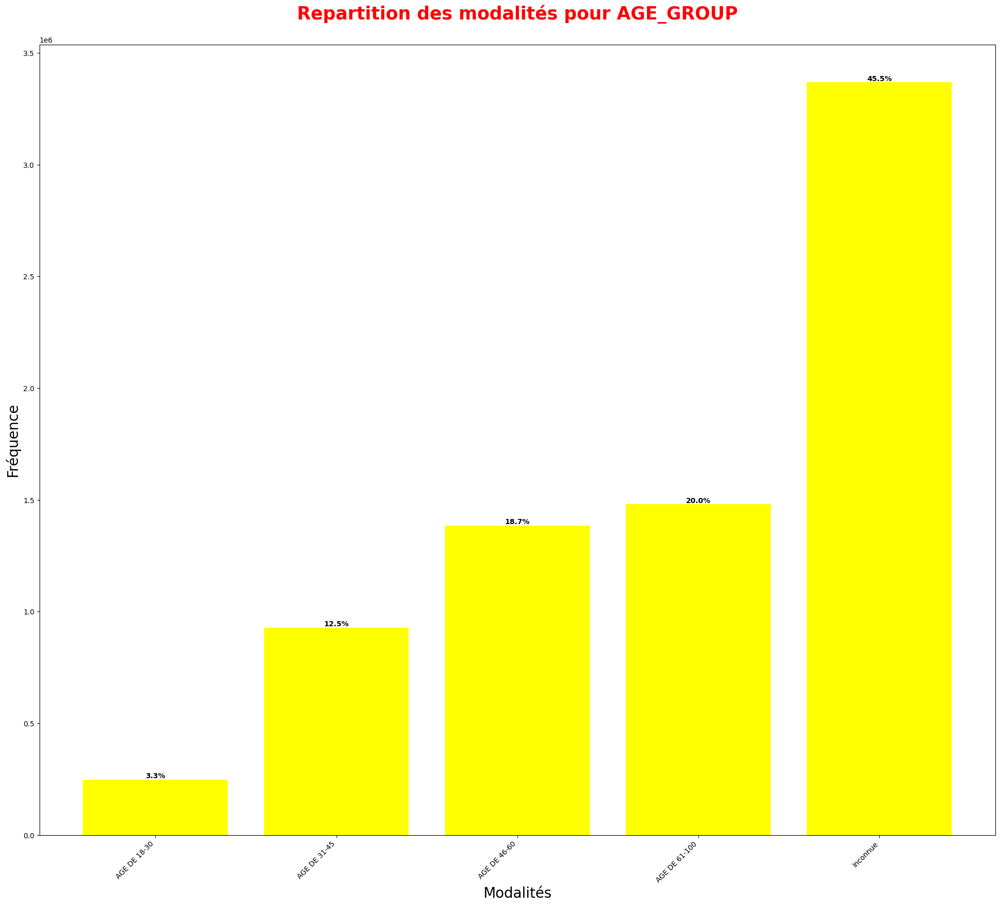

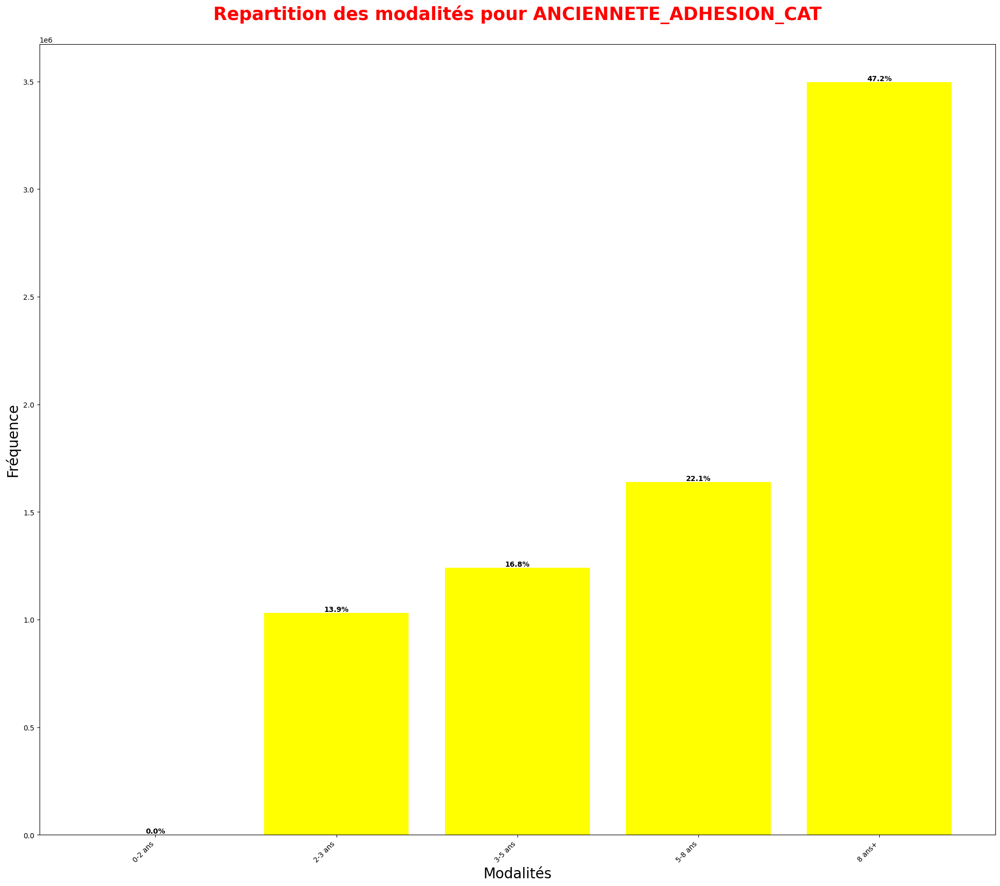

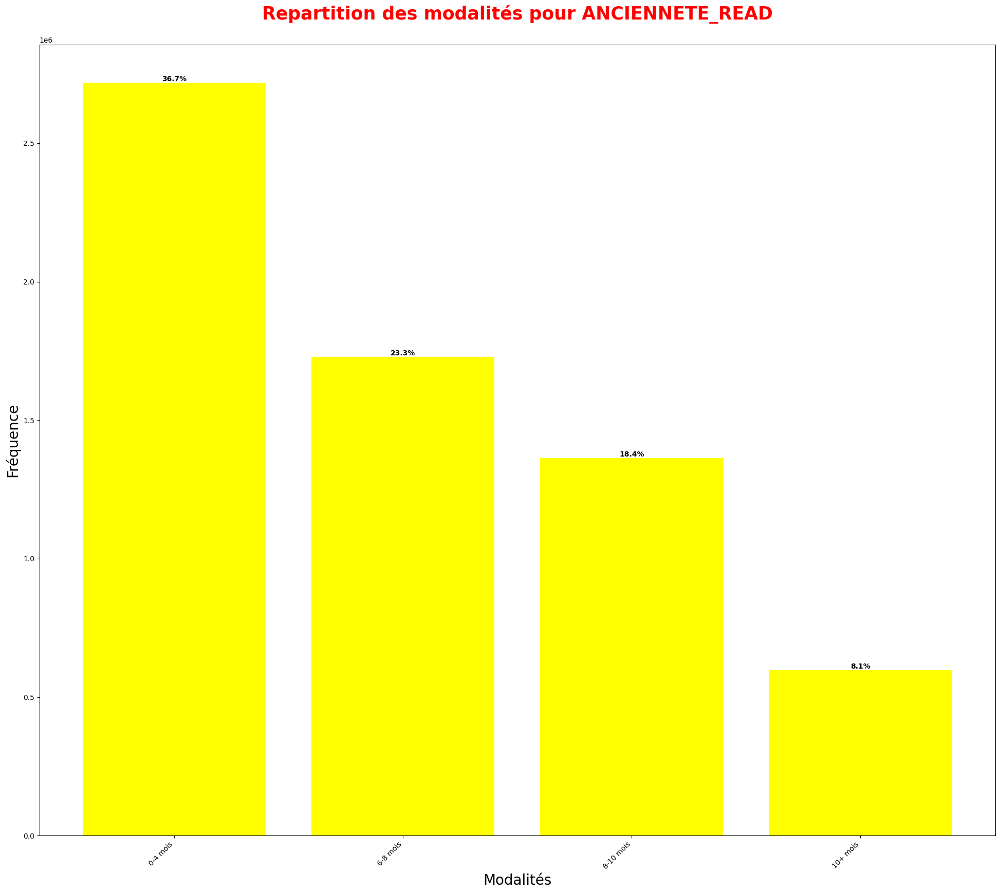

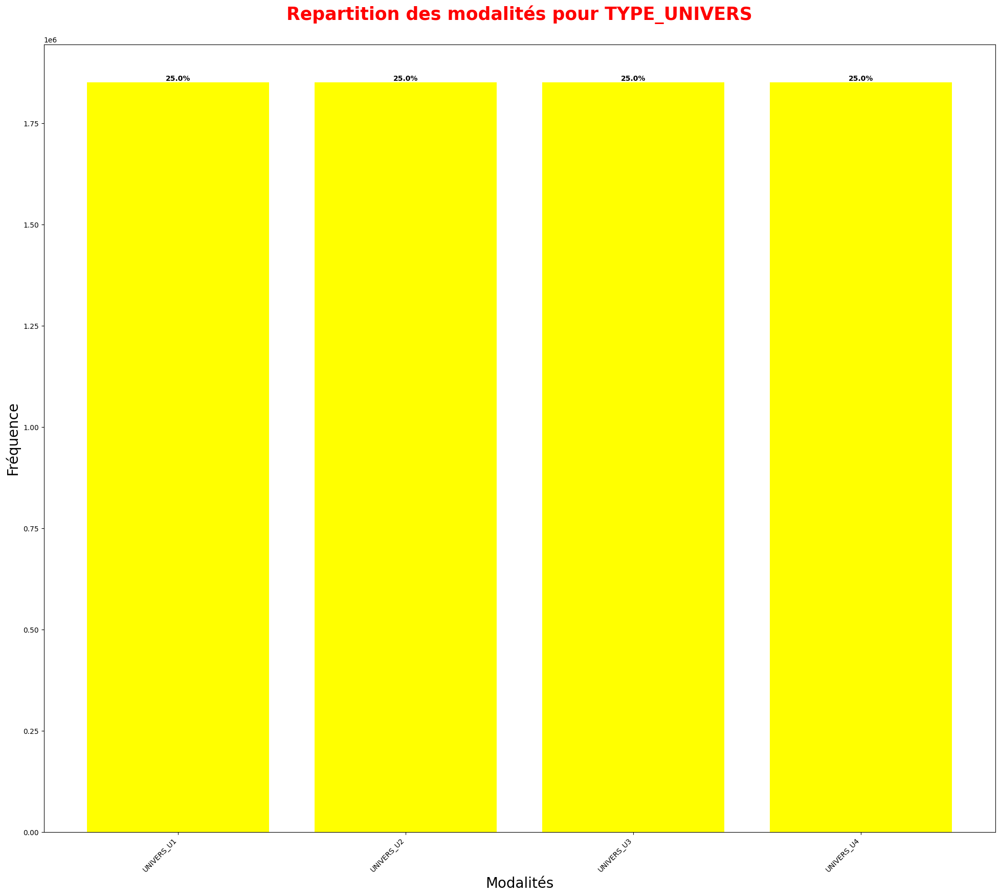

In [62]:
import pandas as pd
import matplotlib.pyplot as plt

# Définition des variables catégorielles
var_cat = X_BOTANIC.select_dtypes(include=['object']).columns.tolist()

# Nom des variables catégorielles nécessitant un tri spécifique

ordre_specifique = {
    'AGE_GROUP': ['AGE DE 18-30','AGE DE 31-45','AGE DE 46-60','AGE DE 61-100','Inconnue'],
    'ANCIENNETE_ADHESION_CAT': ['0-2 ans','2-3 ans', '3-5 ans', '5-8 ans', '8 ans+'],
     'ANCIENNETE_READ':['0-4 mois','6-8 mois','8-10 mois', '10+ mois']

}

# Générer un bar plot pour chaque variable catégorielle
for var in var_cat:
    value_counts = X_BOTANIC[var].value_counts()
    
    # Trier les catégories si nécessaire
    if var in ordre_specifique:
        categories = ordre_specifique[var]
        value_counts = value_counts.reindex(categories)
    
    # Calcul des pourcentages
    percentages = (value_counts / len(X_BOTANIC)) * 100
    
    plt.figure(figsize=(24, 20))
    bars = plt.bar(value_counts.index, value_counts, color='yellow')
    
    # Ajouter les pourcentages au-dessus des barres
    for bar, percentage in zip(bars, percentages):
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 1, f'{percentage:.1f}%', 
                 ha='center', va='bottom', fontweight='bold')
    
    plt.title(f"Repartition des modalités pour {var}\n", fontsize=25, color='red', fontweight='bold')
    plt.xlabel('Modalités', fontsize=20)
    plt.ylabel('Fréquence', fontsize=20)
    plt.xticks(rotation=45, ha='right')
    plt.show()

ANALYSE UNIVARIÉE DES VARIABLES QUANTITATIVES

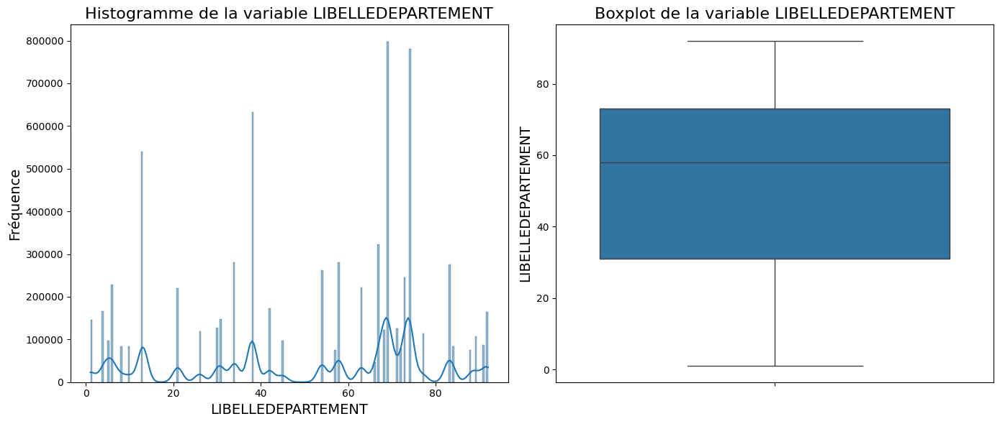


Statistiques descriptives de la variable LIBELLEDEPARTEMENT :
count    7.408792e+06
mean     5.095000e+01
std      2.660964e+01
min      1.000000e+00
25%      3.100000e+01
50%      5.800000e+01
75%      7.300000e+01
max      9.200000e+01
Name: LIBELLEDEPARTEMENT, dtype: float64

--------------------------------------------------



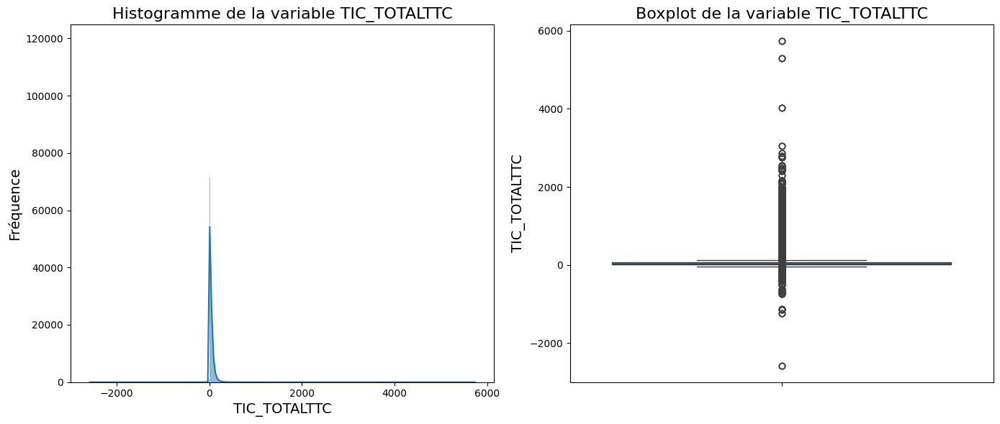


Statistiques descriptives de la variable TIC_TOTALTTC :
count    7.408792e+06
mean     4.723621e+01
std      5.134357e+01
min     -2.582000e+03
25%      1.790000e+01
50%      3.330000e+01
75%      6.097000e+01
max      5.736300e+03
Name: TIC_TOTALTTC, dtype: float64

--------------------------------------------------



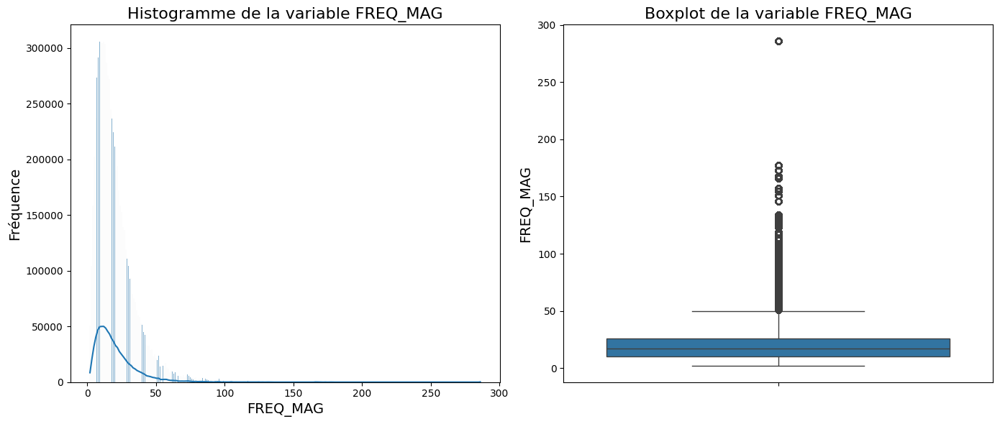


Statistiques descriptives de la variable FREQ_MAG :
count    7.408792e+06
mean     2.047763e+01
std      1.559139e+01
min      2.000000e+00
25%      1.000000e+01
50%      1.700000e+01
75%      2.600000e+01
max      2.860000e+02
Name: FREQ_MAG, dtype: float64

--------------------------------------------------



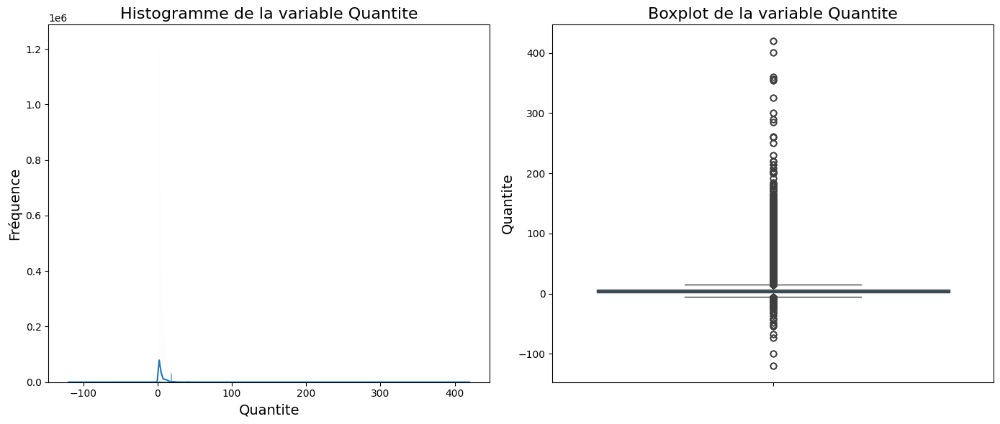


Statistiques descriptives de la variable Quantite :
count    7.408792e+06
mean     5.870041e+00
std      7.085074e+00
min     -1.200000e+02
25%      2.000000e+00
50%      4.000000e+00
75%      7.000000e+00
max      4.200000e+02
Name: Quantite, dtype: float64

--------------------------------------------------



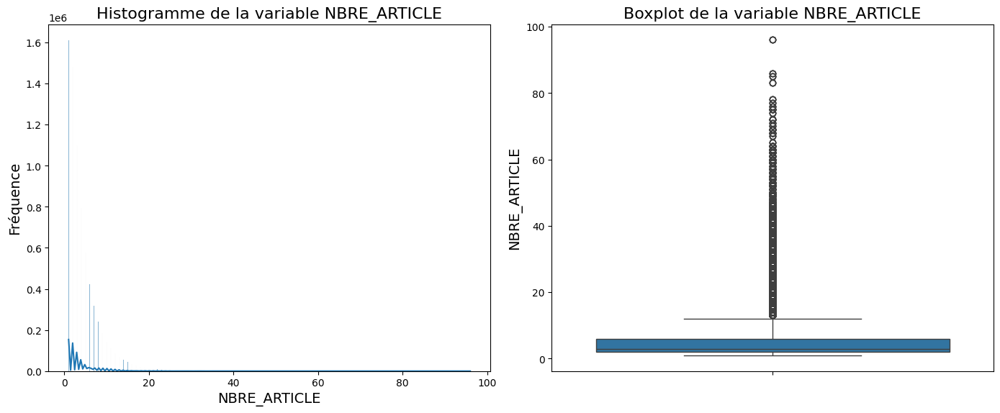


Statistiques descriptives de la variable NBRE_ARTICLE :
count    7.408792e+06
mean     4.312891e+00
std      4.053143e+00
min      1.000000e+00
25%      2.000000e+00
50%      3.000000e+00
75%      6.000000e+00
max      9.600000e+01
Name: NBRE_ARTICLE, dtype: float64

--------------------------------------------------



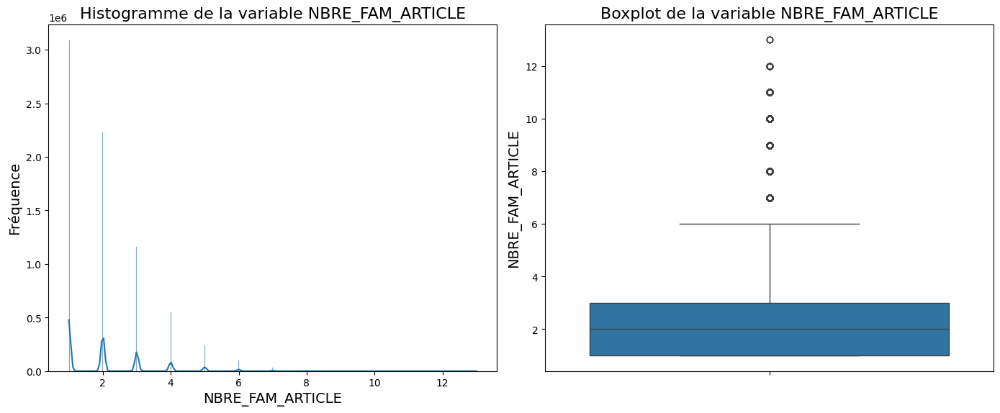


Statistiques descriptives de la variable NBRE_FAM_ARTICLE :
count    7.408792e+06
mean     2.074490e+00
std      1.250042e+00
min      1.000000e+00
25%      1.000000e+00
50%      2.000000e+00
75%      3.000000e+00
max      1.300000e+01
Name: NBRE_FAM_ARTICLE, dtype: float64

--------------------------------------------------



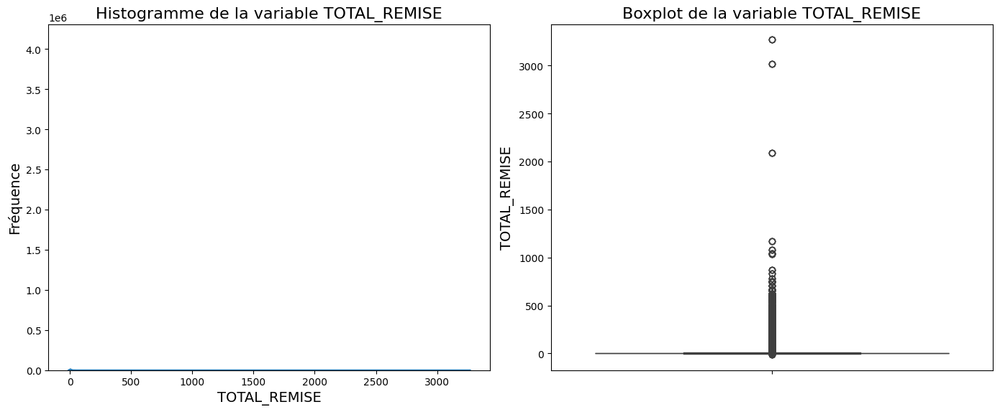


Statistiques descriptives de la variable TOTAL_REMISE :
count    7.408792e+06
mean     4.237081e+00
std      1.140383e+01
min     -1.065800e+01
25%      0.000000e+00
50%      0.000000e+00
75%      5.034000e+00
max      3.268909e+03
Name: TOTAL_REMISE, dtype: float64

--------------------------------------------------



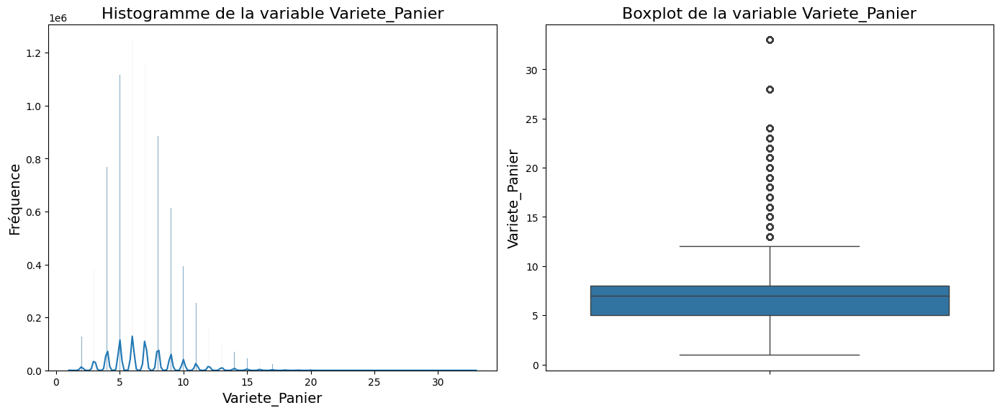


Statistiques descriptives de la variable Variete_Panier :
count    7.408792e+06
mean     6.935604e+00
std      2.781091e+00
min      1.000000e+00
25%      5.000000e+00
50%      7.000000e+00
75%      8.000000e+00
max      3.300000e+01
Name: Variete_Panier, dtype: float64

--------------------------------------------------



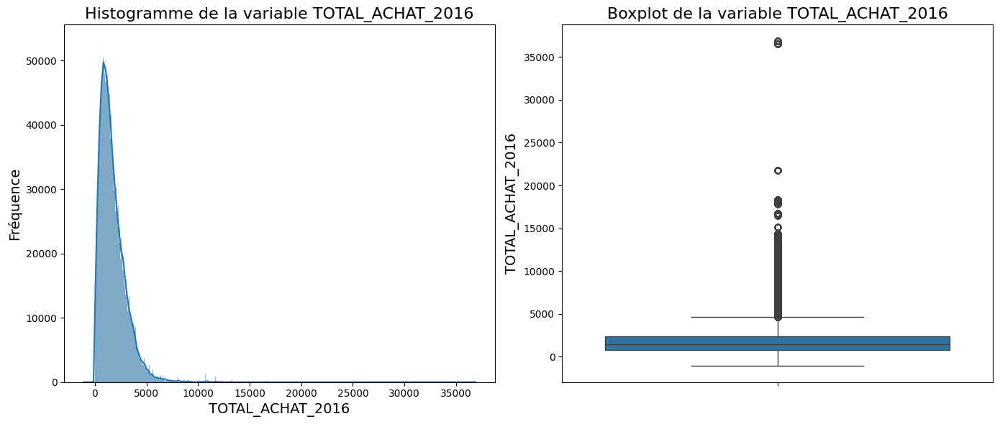


Statistiques descriptives de la variable TOTAL_ACHAT_2016 :
count    7.408792e+06
mean     1.728973e+03
std      1.301360e+03
min     -1.079800e+03
25%      8.182400e+02
50%      1.433640e+03
75%      2.342080e+03
max      3.688064e+04
Name: TOTAL_ACHAT_2016, dtype: float64

--------------------------------------------------



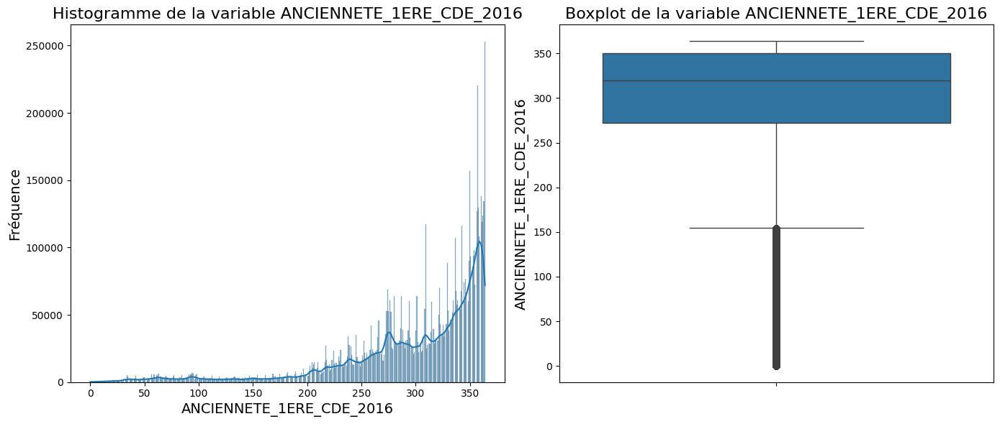


Statistiques descriptives de la variable ANCIENNETE_1ERE_CDE_2016 :
count    7.408792e+06
mean     2.982137e+02
std      6.925761e+01
min      0.000000e+00
25%      2.720000e+02
50%      3.200000e+02
75%      3.500000e+02
max      3.640000e+02
Name: ANCIENNETE_1ERE_CDE_2016, dtype: float64

--------------------------------------------------



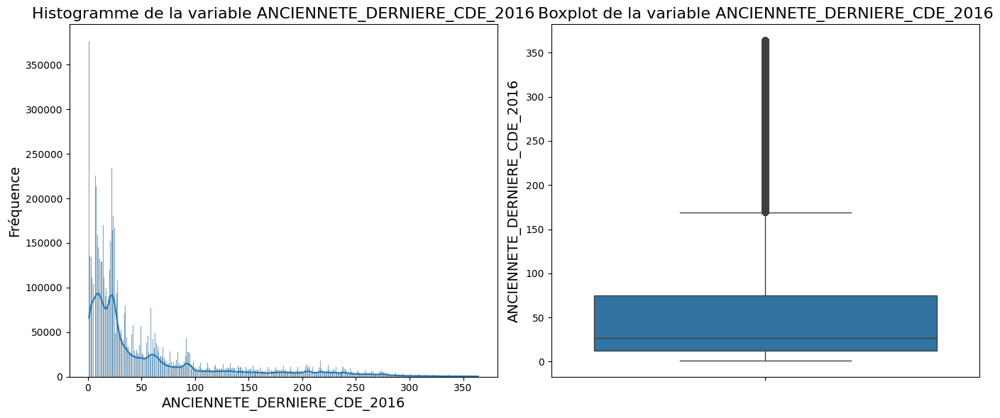


Statistiques descriptives de la variable ANCIENNETE_DERNIERE_CDE_2016 :
count    7.408792e+06
mean     5.916659e+01
std      7.160271e+01
min      1.000000e+00
25%      1.200000e+01
50%      2.700000e+01
75%      7.500000e+01
max      3.640000e+02
Name: ANCIENNETE_DERNIERE_CDE_2016, dtype: float64

--------------------------------------------------



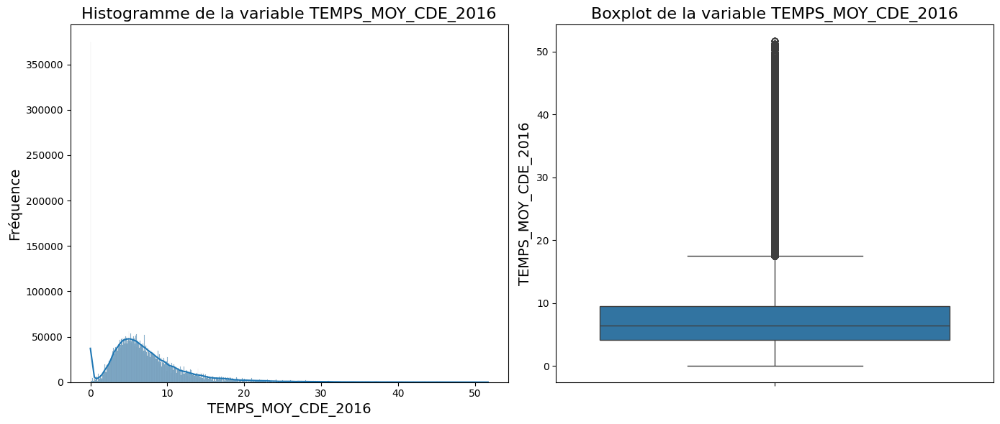


Statistiques descriptives de la variable TEMPS_MOY_CDE_2016 :
count    7.408792e+06
mean     7.498851e+00
std      5.370206e+00
min      0.000000e+00
25%      4.186667e+00
50%      6.370370e+00
75%      9.514286e+00
max      5.171429e+01
Name: TEMPS_MOY_CDE_2016, dtype: float64

--------------------------------------------------



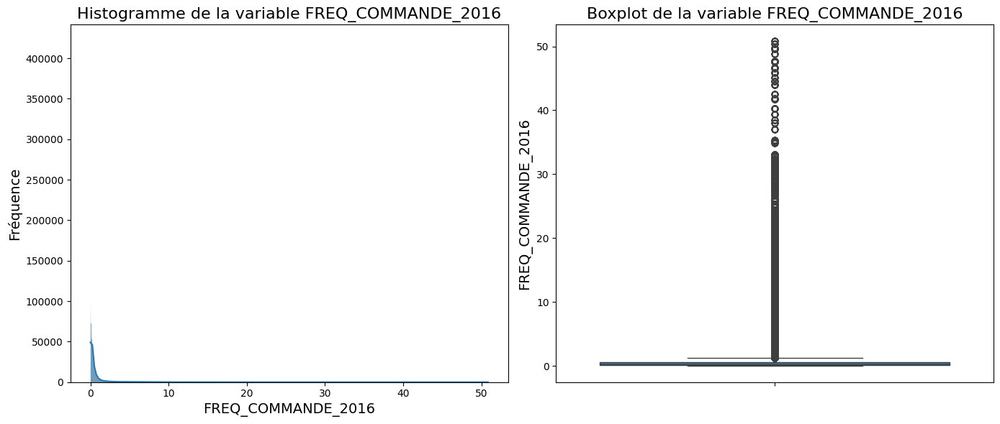


Statistiques descriptives de la variable FREQ_COMMANDE_2016 :
count    7.408792e+06
mean     7.294579e-01
std      1.735843e+00
min      0.000000e+00
25%      9.057971e-02
50%      2.444444e-01
75%      5.740741e-01
max      5.085714e+01
Name: FREQ_COMMANDE_2016, dtype: float64

--------------------------------------------------



In [63]:
# Importer les librairies nécessaires
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Définir les variables quantitatives
var_quan = X_BOTANIC.select_dtypes(include=['int64','float64']).columns.tolist()

# Générer des histogrammes et des boxplots pour chaque variable quantitative
for var in var_quan:
    # Créer une nouvelle figure
    plt.figure(figsize=(14, 6))
    
    # Sous-figure pour l'histogramme
    plt.subplot(1, 2, 1)
    sns.histplot(X_BOTANIC[var], kde=True)
    plt.title(f'Histogramme de la variable {var}', fontsize=16)
    plt.xlabel(var, fontsize=14)
    plt.ylabel('Fréquence', fontsize=14)

    # Sous-figure pour le boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(y=X_BOTANIC[var])
    plt.title(f'Boxplot de la variable {var}', fontsize=16)
    plt.ylabel(var, fontsize=14)
    
    # Ajuster la mise en page
    plt.tight_layout()
    
    # Afficher la figure
    plt.show()
    
    # Afficher les statistiques descriptives
    print(f'\nStatistiques descriptives de la variable {var} :')
    print(X_BOTANIC[var].describe())
    print('\n' + '-'*50 + '\n')

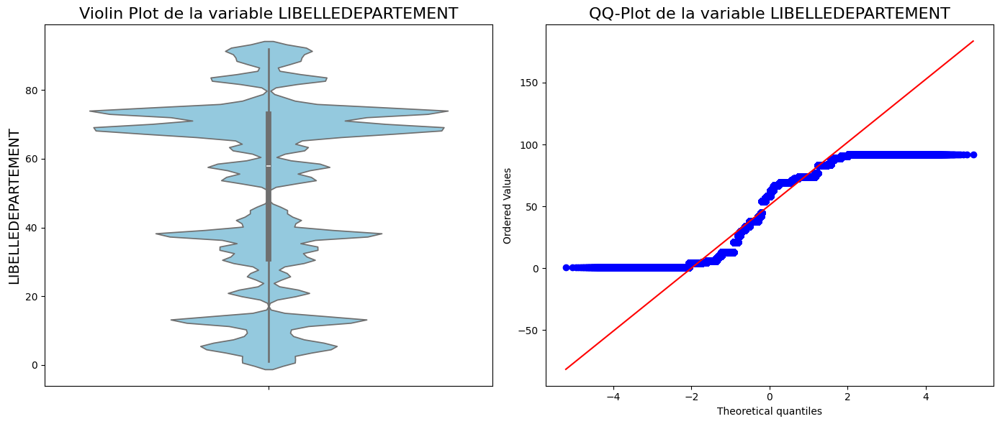


Statistiques descriptives de la variable LIBELLEDEPARTEMENT :
count    7.408792e+06
mean     5.095000e+01
std      2.660964e+01
min      1.000000e+00
25%      3.100000e+01
50%      5.800000e+01
75%      7.300000e+01
max      9.200000e+01
Name: LIBELLEDEPARTEMENT, dtype: float64

--------------------------------------------------



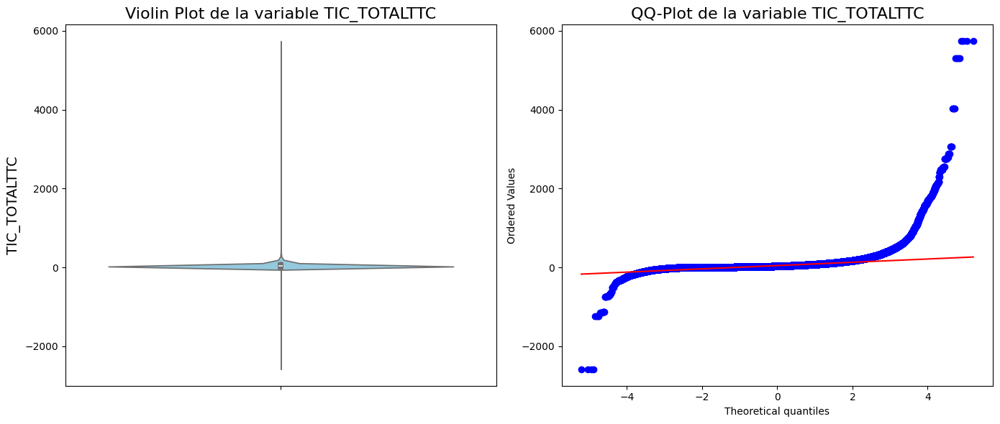


Statistiques descriptives de la variable TIC_TOTALTTC :
count    7.408792e+06
mean     4.723621e+01
std      5.134357e+01
min     -2.582000e+03
25%      1.790000e+01
50%      3.330000e+01
75%      6.097000e+01
max      5.736300e+03
Name: TIC_TOTALTTC, dtype: float64

--------------------------------------------------



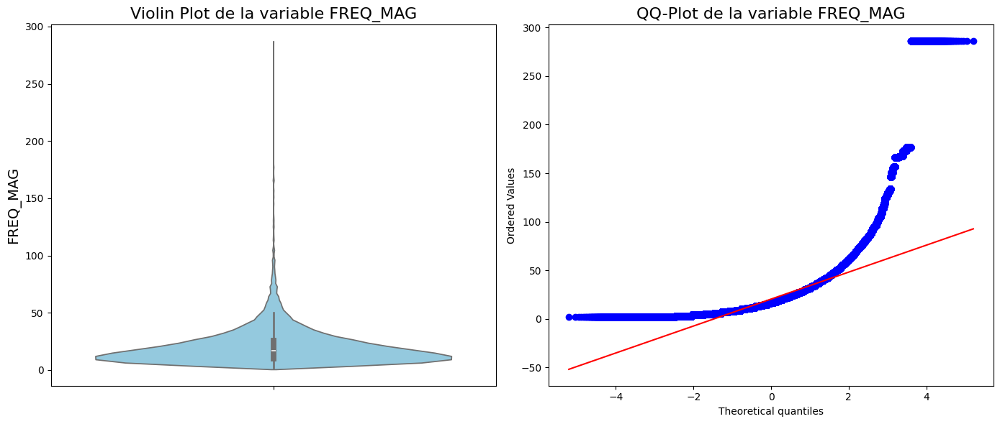


Statistiques descriptives de la variable FREQ_MAG :
count    7.408792e+06
mean     2.047763e+01
std      1.559139e+01
min      2.000000e+00
25%      1.000000e+01
50%      1.700000e+01
75%      2.600000e+01
max      2.860000e+02
Name: FREQ_MAG, dtype: float64

--------------------------------------------------



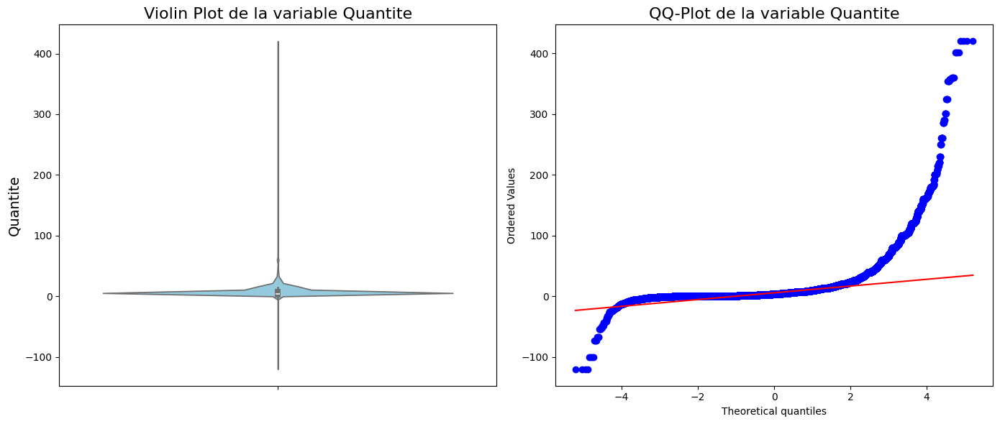


Statistiques descriptives de la variable Quantite :
count    7.408792e+06
mean     5.870041e+00
std      7.085074e+00
min     -1.200000e+02
25%      2.000000e+00
50%      4.000000e+00
75%      7.000000e+00
max      4.200000e+02
Name: Quantite, dtype: float64

--------------------------------------------------



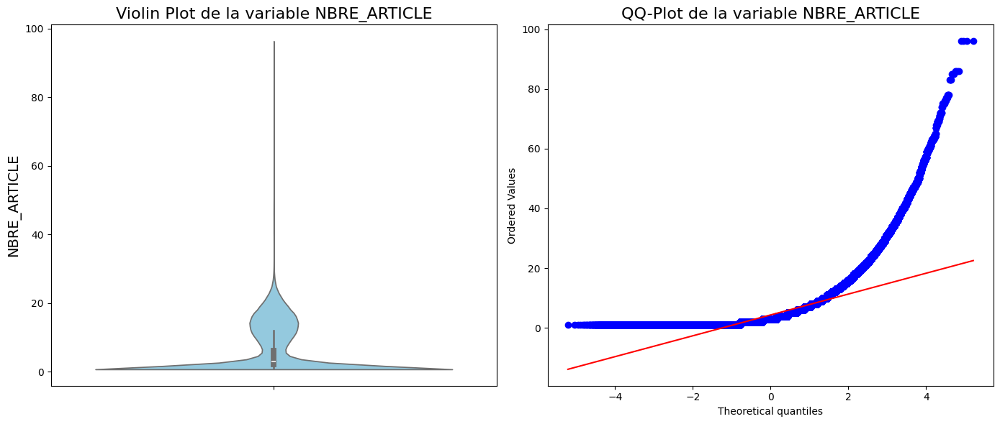


Statistiques descriptives de la variable NBRE_ARTICLE :
count    7.408792e+06
mean     4.312891e+00
std      4.053143e+00
min      1.000000e+00
25%      2.000000e+00
50%      3.000000e+00
75%      6.000000e+00
max      9.600000e+01
Name: NBRE_ARTICLE, dtype: float64

--------------------------------------------------



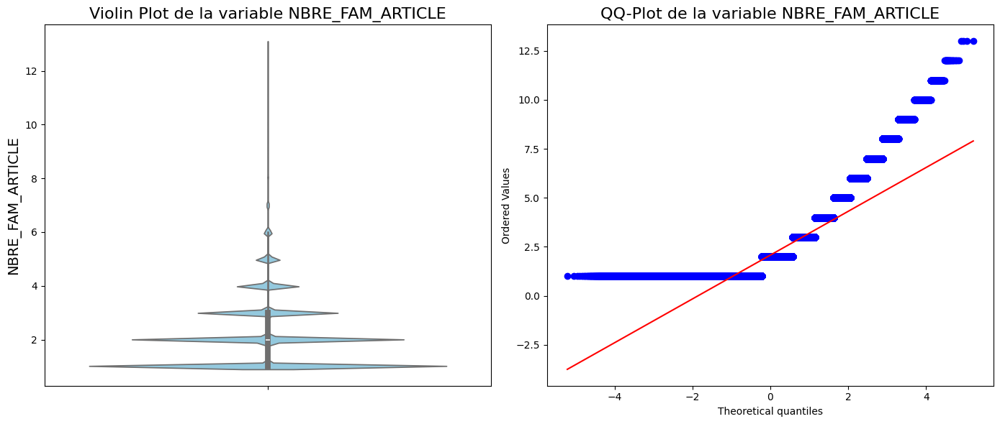


Statistiques descriptives de la variable NBRE_FAM_ARTICLE :
count    7.408792e+06
mean     2.074490e+00
std      1.250042e+00
min      1.000000e+00
25%      1.000000e+00
50%      2.000000e+00
75%      3.000000e+00
max      1.300000e+01
Name: NBRE_FAM_ARTICLE, dtype: float64

--------------------------------------------------



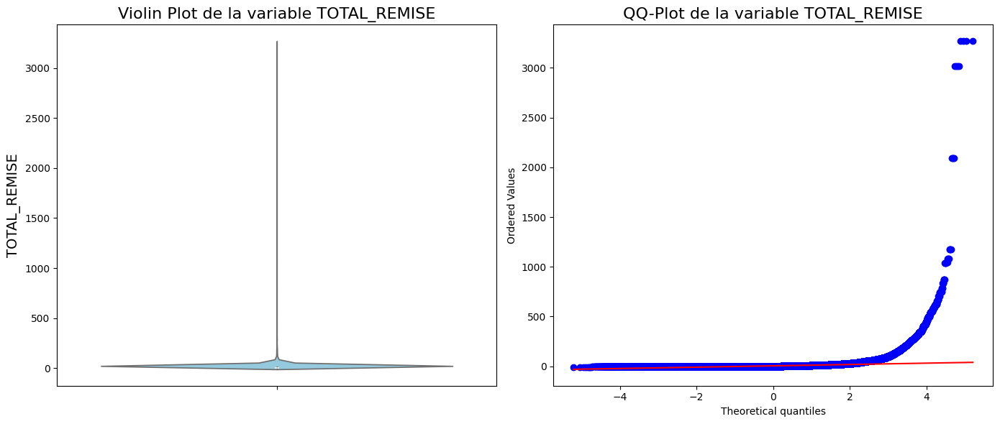


Statistiques descriptives de la variable TOTAL_REMISE :
count    7.408792e+06
mean     4.237081e+00
std      1.140383e+01
min     -1.065800e+01
25%      0.000000e+00
50%      0.000000e+00
75%      5.034000e+00
max      3.268909e+03
Name: TOTAL_REMISE, dtype: float64

--------------------------------------------------



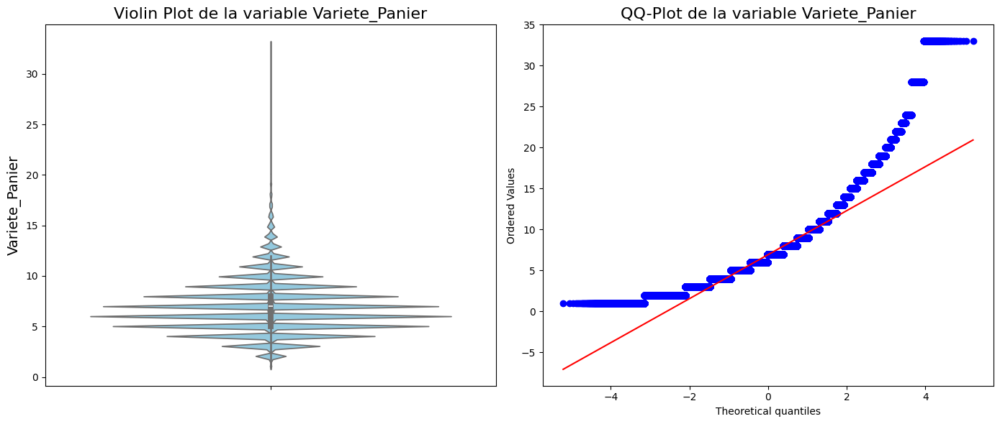


Statistiques descriptives de la variable Variete_Panier :
count    7.408792e+06
mean     6.935604e+00
std      2.781091e+00
min      1.000000e+00
25%      5.000000e+00
50%      7.000000e+00
75%      8.000000e+00
max      3.300000e+01
Name: Variete_Panier, dtype: float64

--------------------------------------------------



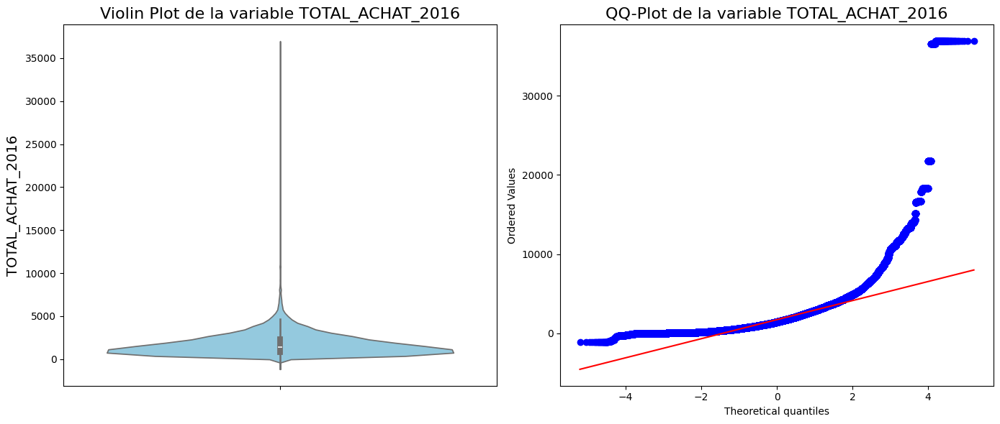


Statistiques descriptives de la variable TOTAL_ACHAT_2016 :
count    7.408792e+06
mean     1.728973e+03
std      1.301360e+03
min     -1.079800e+03
25%      8.182400e+02
50%      1.433640e+03
75%      2.342080e+03
max      3.688064e+04
Name: TOTAL_ACHAT_2016, dtype: float64

--------------------------------------------------



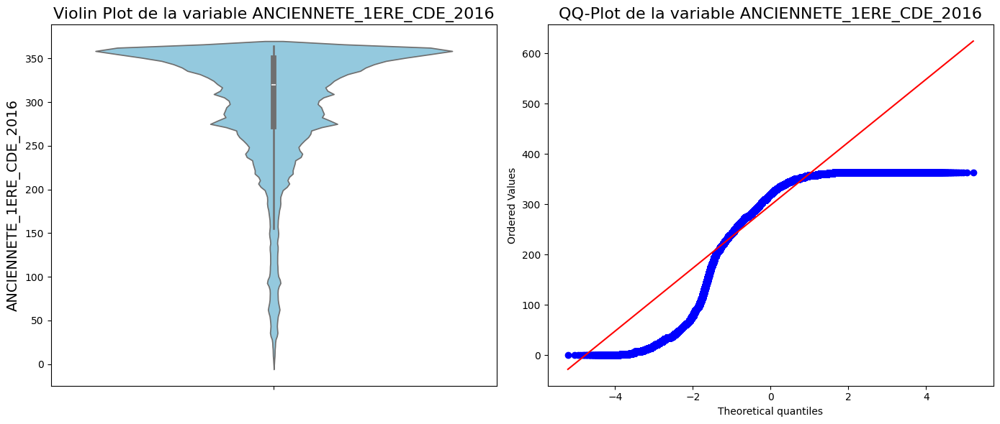


Statistiques descriptives de la variable ANCIENNETE_1ERE_CDE_2016 :
count    7.408792e+06
mean     2.982137e+02
std      6.925761e+01
min      0.000000e+00
25%      2.720000e+02
50%      3.200000e+02
75%      3.500000e+02
max      3.640000e+02
Name: ANCIENNETE_1ERE_CDE_2016, dtype: float64

--------------------------------------------------



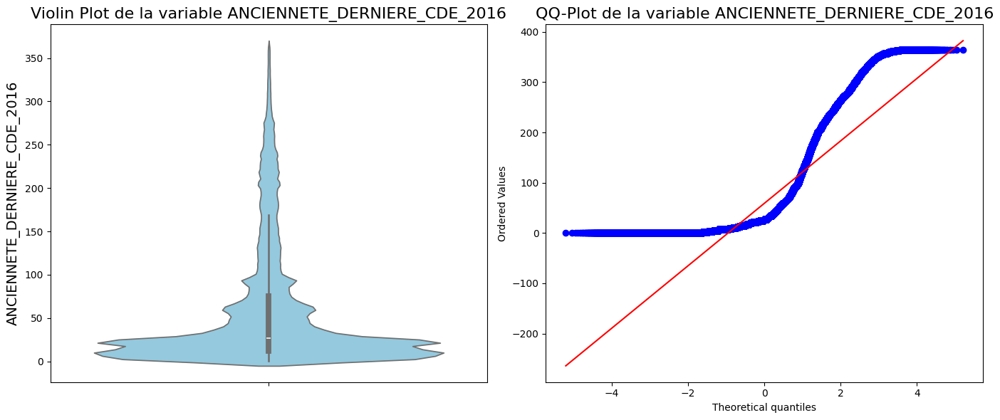


Statistiques descriptives de la variable ANCIENNETE_DERNIERE_CDE_2016 :
count    7.408792e+06
mean     5.916659e+01
std      7.160271e+01
min      1.000000e+00
25%      1.200000e+01
50%      2.700000e+01
75%      7.500000e+01
max      3.640000e+02
Name: ANCIENNETE_DERNIERE_CDE_2016, dtype: float64

--------------------------------------------------



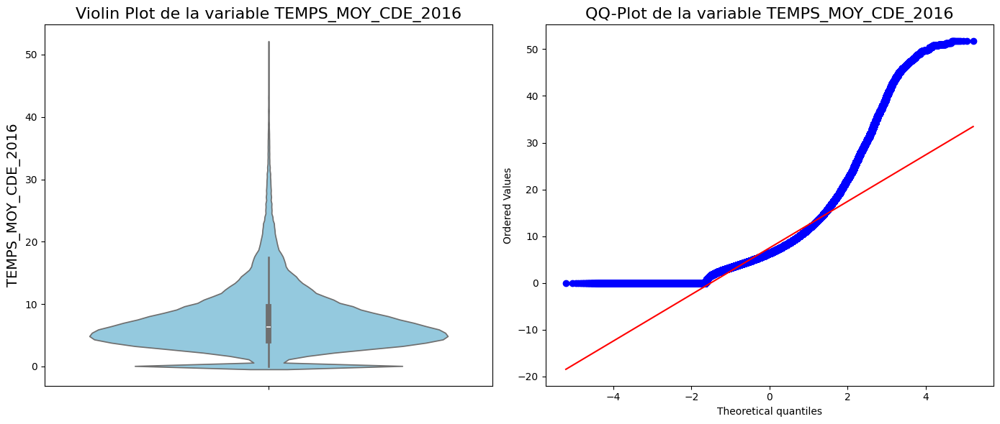


Statistiques descriptives de la variable TEMPS_MOY_CDE_2016 :
count    7.408792e+06
mean     7.498851e+00
std      5.370206e+00
min      0.000000e+00
25%      4.186667e+00
50%      6.370370e+00
75%      9.514286e+00
max      5.171429e+01
Name: TEMPS_MOY_CDE_2016, dtype: float64

--------------------------------------------------



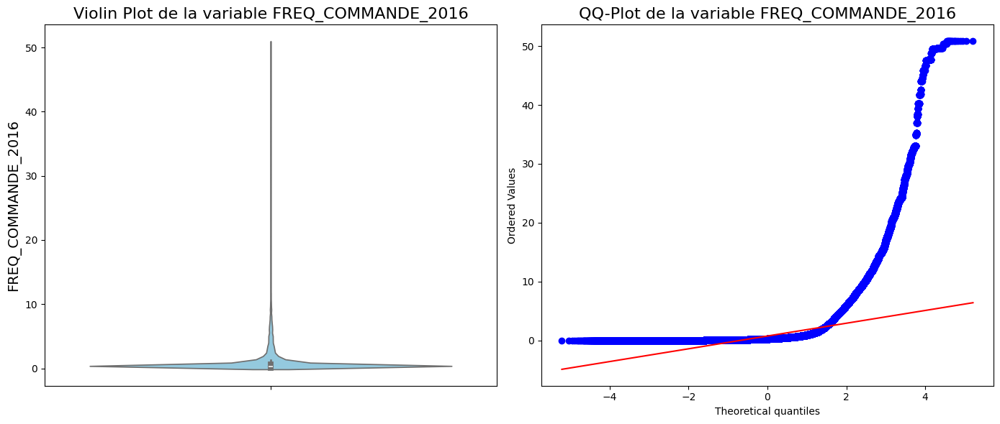


Statistiques descriptives de la variable FREQ_COMMANDE_2016 :
count    7.408792e+06
mean     7.294579e-01
std      1.735843e+00
min      0.000000e+00
25%      9.057971e-02
50%      2.444444e-01
75%      5.740741e-01
max      5.085714e+01
Name: FREQ_COMMANDE_2016, dtype: float64

--------------------------------------------------



In [64]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats

# Définir les variables quantitatives
var_quan = X_BOTANIC.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Générer des plots pour l'analyse univariée
for var in var_quan:
    # Distribution avec Violin Plot et Histogramme sur la même figure
    plt.figure(figsize=(14, 6))
    
    plt.subplot(1, 2, 1)
    sns.violinplot(y=X_BOTANIC[var], color='skyblue')
    plt.title(f'Violin Plot de la variable {var}', fontsize=16)
    plt.ylabel(var, fontsize=14)
    
    plt.subplot(1, 2, 2)
    stats.probplot(X_BOTANIC[var], dist="norm", plot=plt)
    plt.title(f'QQ-Plot de la variable {var}', fontsize=16)
    
    # Ajuster la mise en page
    plt.tight_layout()
    
    # Afficher la figure
    plt.show()
    
    # Afficher les statistiques descriptives
    print(f'\nStatistiques descriptives de la variable {var} :')
    print(X_BOTANIC[var].describe())
    print('\n' + '-'*50 + '\n')

ANALYSE BIVARIÉE

ANALYSE BIVARIÉE DES VARIABLES CATÉGORIELLES


Proportions d'attrition par catégorie dans la variable 'MAGASIN':
         Non attritionniste  Attritionniste
MAGASIN                                    
ALB                0.134967        0.865033
ALM                0.150246        0.849754
AVI                0.152780        0.847220
BAR                0.159827        0.840173
BEA                0.162119        0.837881
...                     ...             ...
VIC                0.131486        0.868514
VIF                0.146739        0.853261
VIT                0.135335        0.864665
VIV                0.143740        0.856260
VLG                0.118021        0.881979

[67 rows x 2 columns]


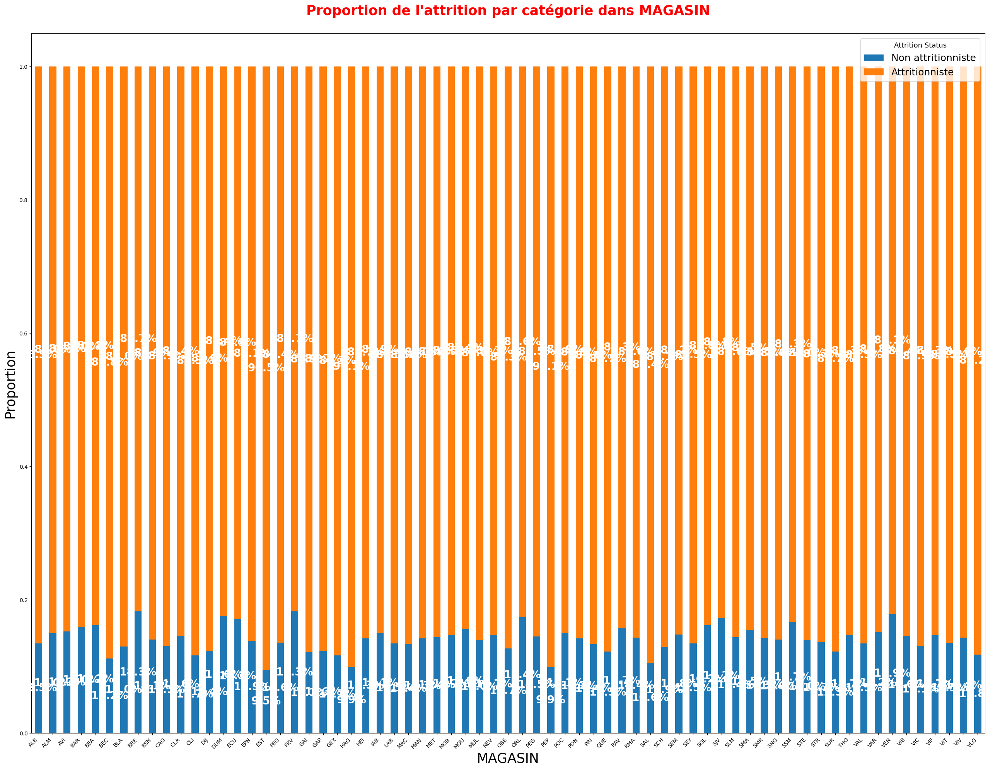


Proportions d'attrition par catégorie dans la variable 'SEXE':
       Non attritionniste  Attritionniste
SEXE                                     
FEMME            0.147613        0.852387
HOMME            0.140720        0.859280


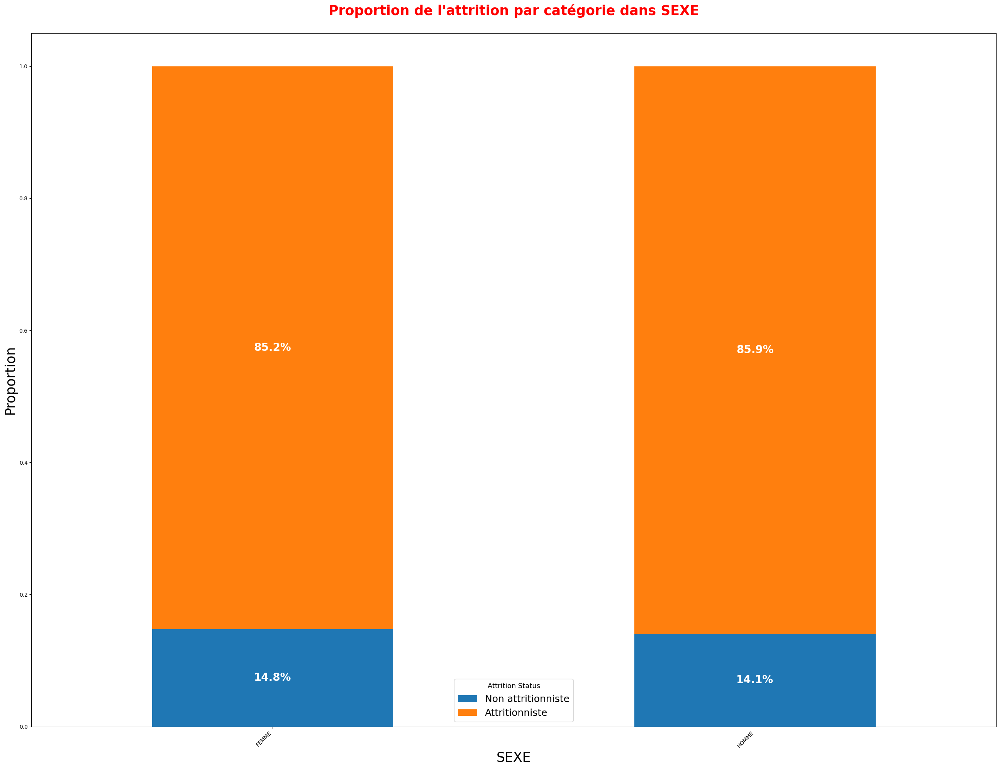


Proportions d'attrition par catégorie dans la variable 'AGE_GROUP':
               Non attritionniste  Attritionniste
AGE_GROUP                                        
AGE DE 18-30             0.137696        0.862304
AGE DE 31-45             0.135968        0.864032
AGE DE 46-60             0.148726        0.851274
AGE DE 61-100            0.142156        0.857844
Inconnue                 0.146864        0.853136


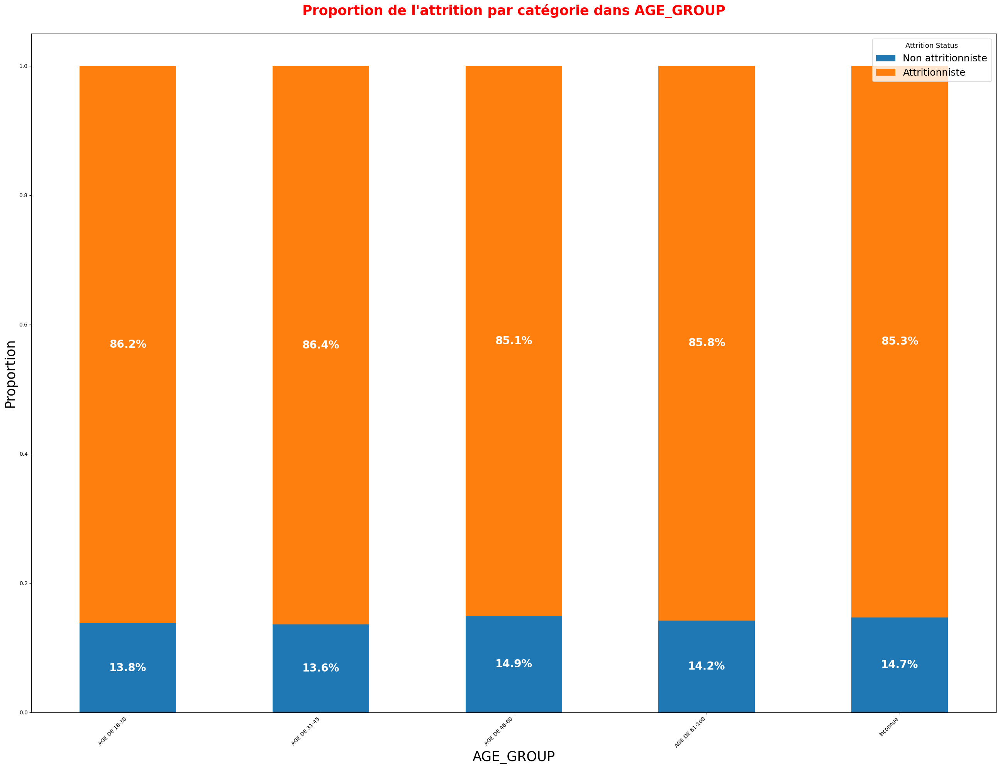


Proportions d'attrition par catégorie dans la variable 'ANCIENNETE_ADHESION_CAT':
                         Non attritionniste  Attritionniste
ANCIENNETE_ADHESION_CAT                                    
0-2 ans                            0.137795        0.862205
2-3 ans                            0.123054        0.876946
3-5 ans                            0.136452        0.863548
5-8 ans                            0.149064        0.850936
8 ans+                             0.151757        0.848243


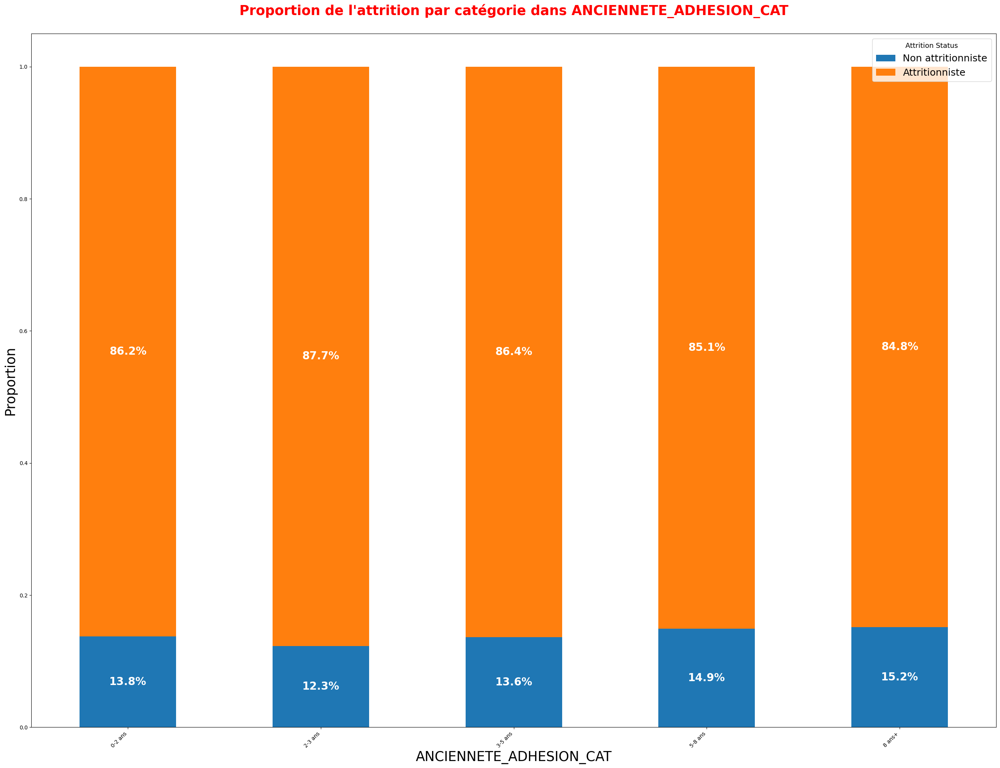


Proportions d'attrition par catégorie dans la variable 'ANCIENNETE_READ':
                 Non attritionniste  Attritionniste
ANCIENNETE_READ                                    
0-4 mois                   0.154199        0.845801
10+ mois                   0.137130        0.862870
4-6 mois                   0.153986        0.846014
6-8 mois                   0.142108        0.857892
8-10 mois                  0.124992        0.875008


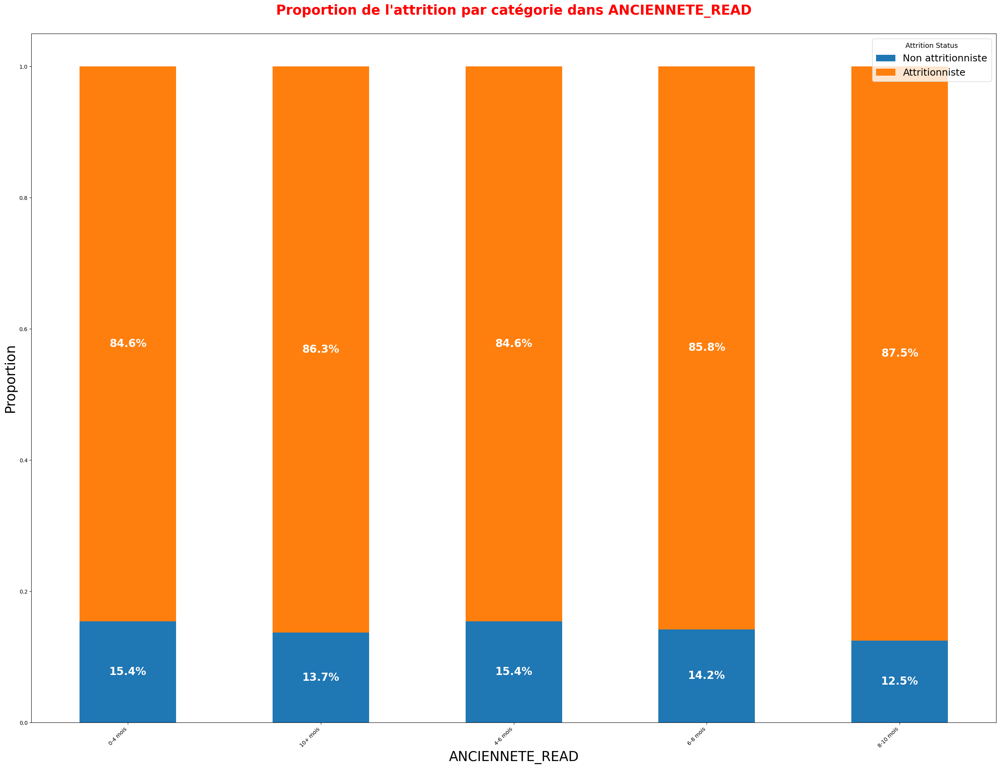


Proportions d'attrition par catégorie dans la variable 'TYPE_UNIVERS':
              Non attritionniste  Attritionniste
TYPE_UNIVERS                                    
UNIVERS_U1              0.144601        0.855399
UNIVERS_U2              0.144601        0.855399
UNIVERS_U3              0.144601        0.855399
UNIVERS_U4              0.144601        0.855399


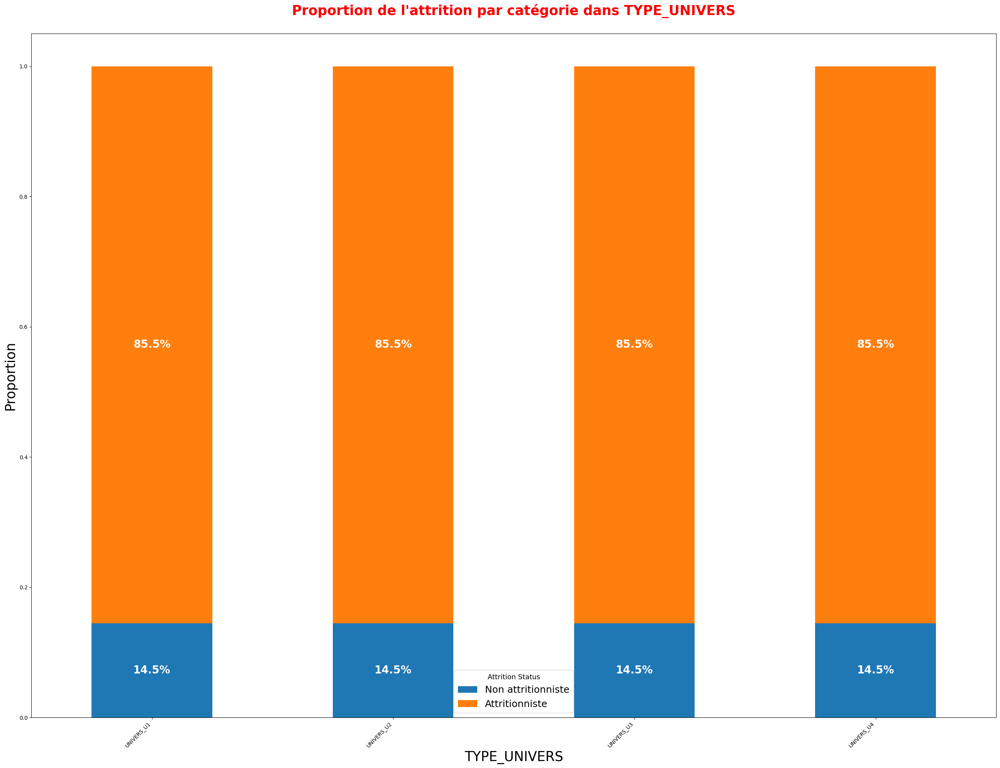

In [65]:
import pandas as pd
import matplotlib.pyplot as plt

# Définition des variables catégorielles
var_cat = X_BOTANIC.select_dtypes(include=['object']).columns.tolist()

# Générer un bar plot pour chaque variable catégorielle
for var in var_cat:
    # Calculer les proportions d'attrition
    prop_df = (df_BOTANIC_F.groupby([var, 'ATTRITION'])['ATTRITION'].count().unstack(level=1).fillna(0))
    prop_df_norm = prop_df.div(prop_df.sum(axis=1), axis=0)
    
    # Reformatage pour le tableau
    prop_df_table = prop_df_norm.copy()
    prop_df_table.columns = ['Non attritionniste', 'Attritionniste']
    
    # Affichage du tableau
    print(f"\nProportions d'attrition par catégorie dans la variable '{var}':")
    print(prop_df_table)
    
    # Créer le barplot
    fig, ax = plt.subplots(figsize=(26, 20)) 
    
    prop_df_norm.plot(kind='bar', stacked=True, ax=ax)
    
    plt.title(f"Proportion de l'attrition par catégorie dans {var}\n", fontsize=25, color='red', fontweight='bold')
    plt.xlabel(var, fontsize=25)
    plt.ylabel('Proportion', fontsize=25)
    plt.legend(['Non attritionniste', 'Attritionniste'], title='Attrition Status', fontsize=18, title_fontsize='13')
    
    # Rotate x-tick labels for better readability
    plt.xticks(rotation=45, ha='right')
    
    # Display percentages directly on the bars
    for p in ax.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        if not pd.isna(height) and height > 0:
            ax.text(x + width / 2., y + height / 2., f'{height:.1%}', ha='center', va='center', fontsize=20, color='white', fontweight='bold')
    
    # Show the plot
    plt.tight_layout()
    plt.show()

ANALYSE BIVARIÉE DES VARIABLES QUANTITATIVES

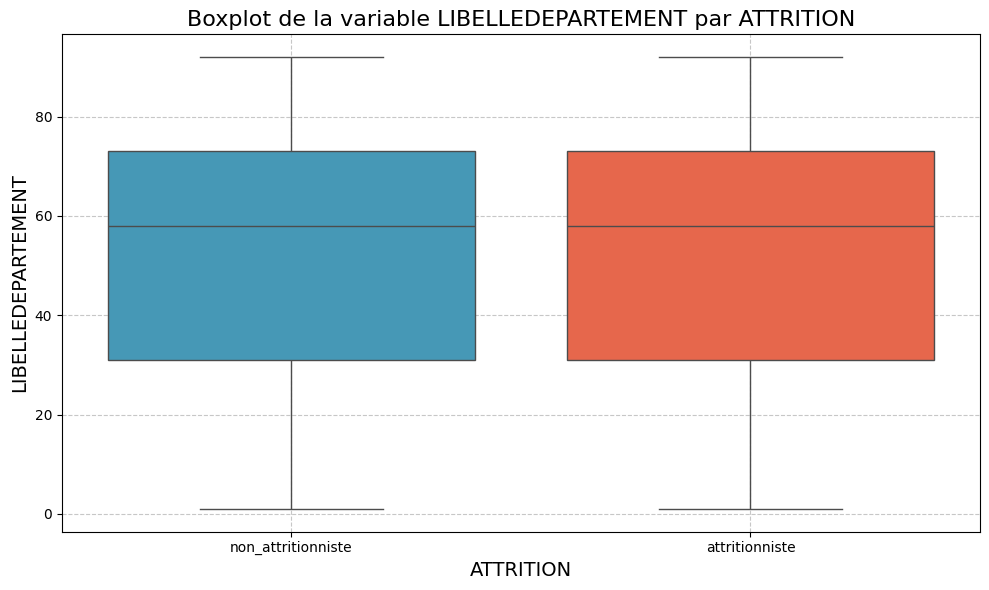

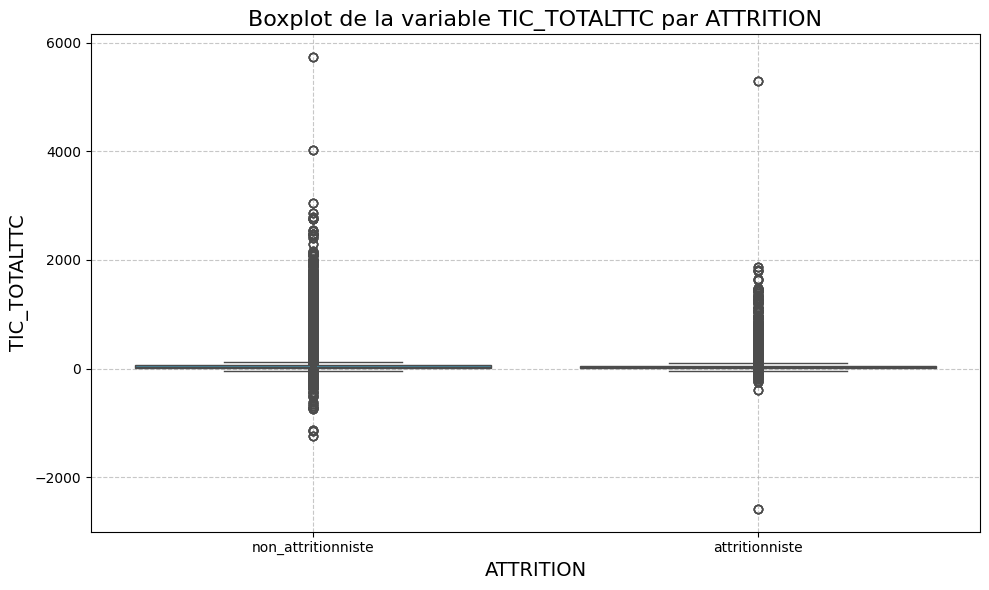

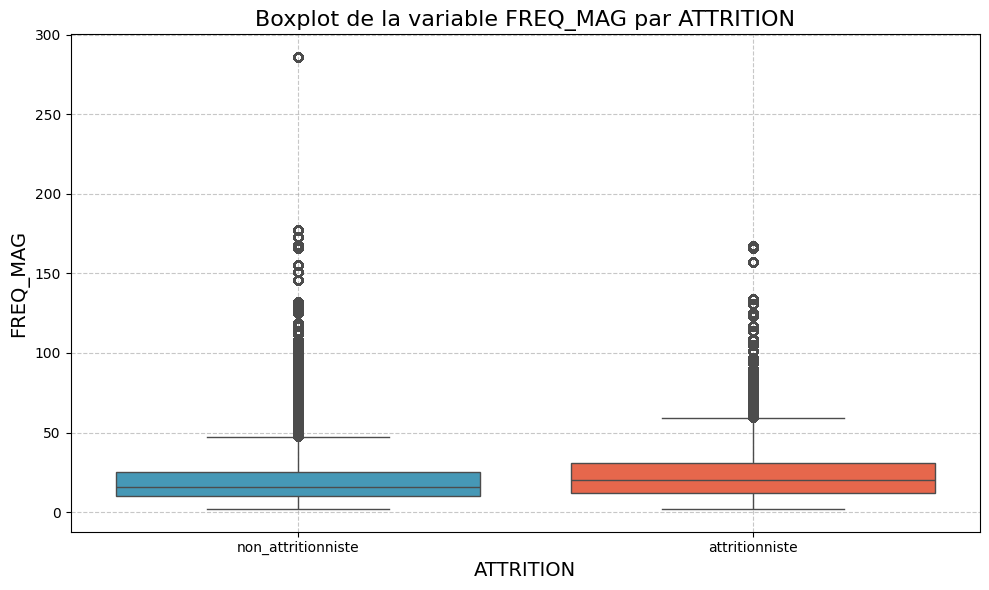

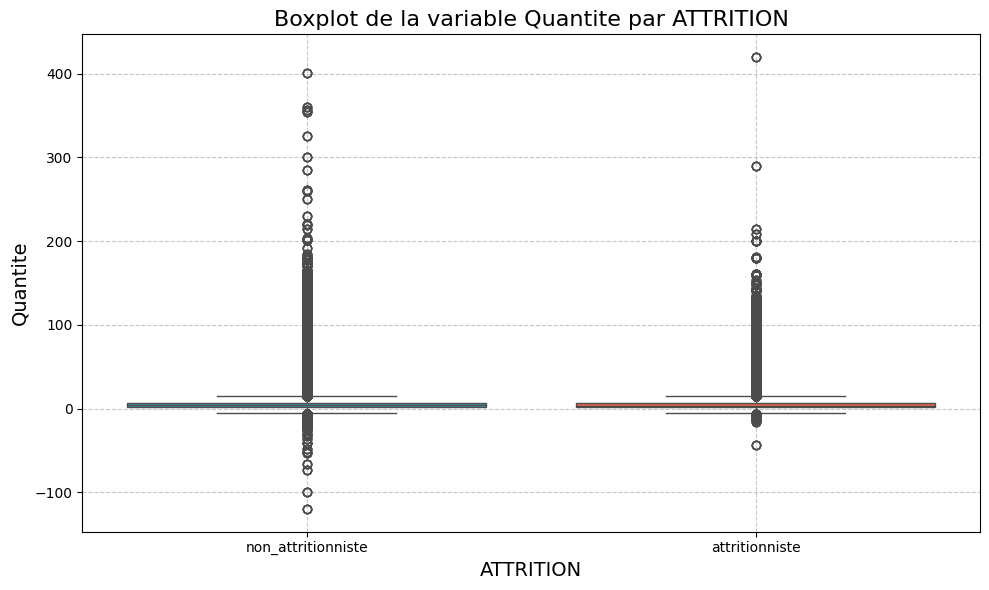

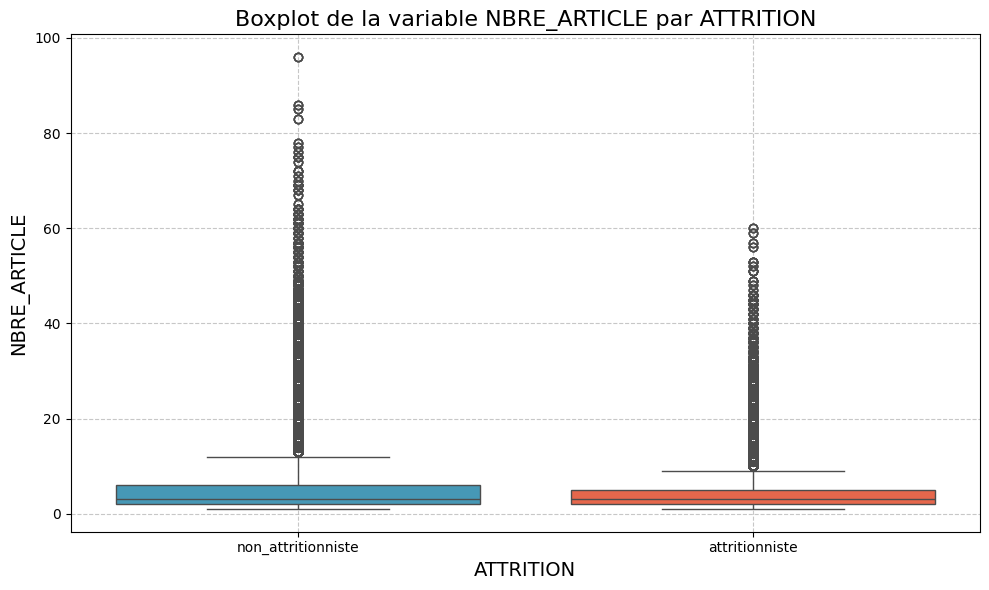

...

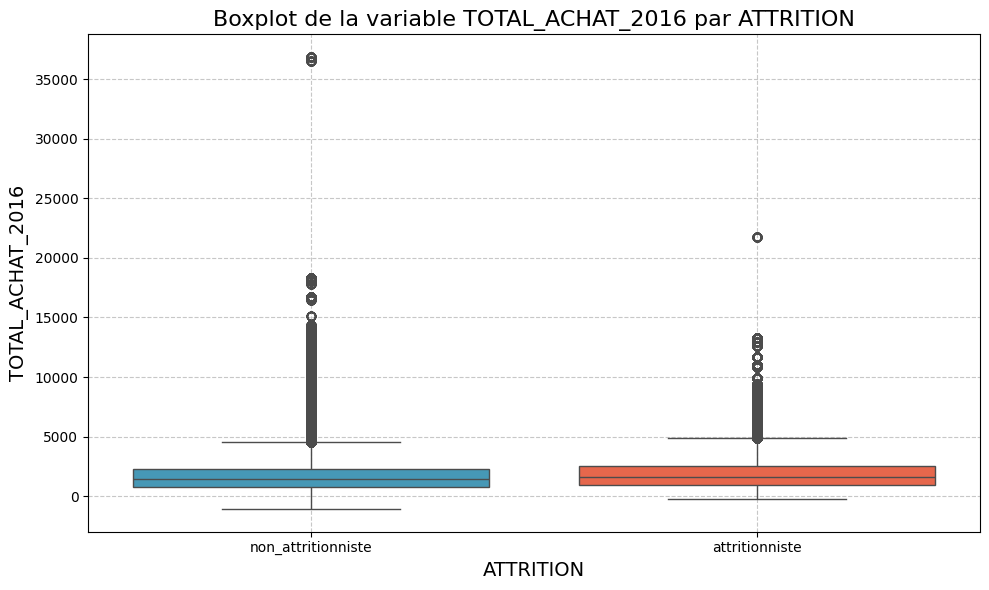

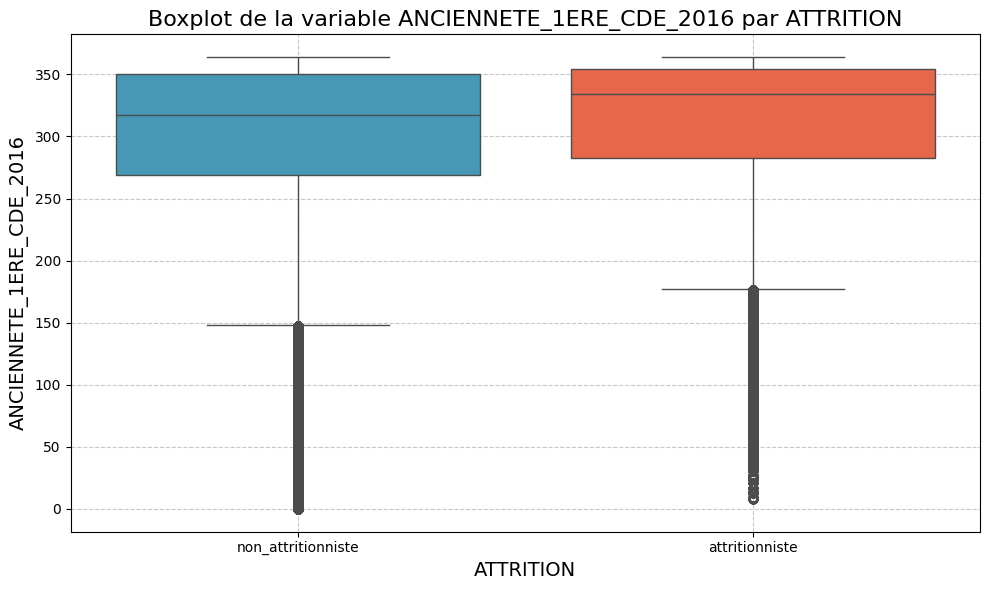

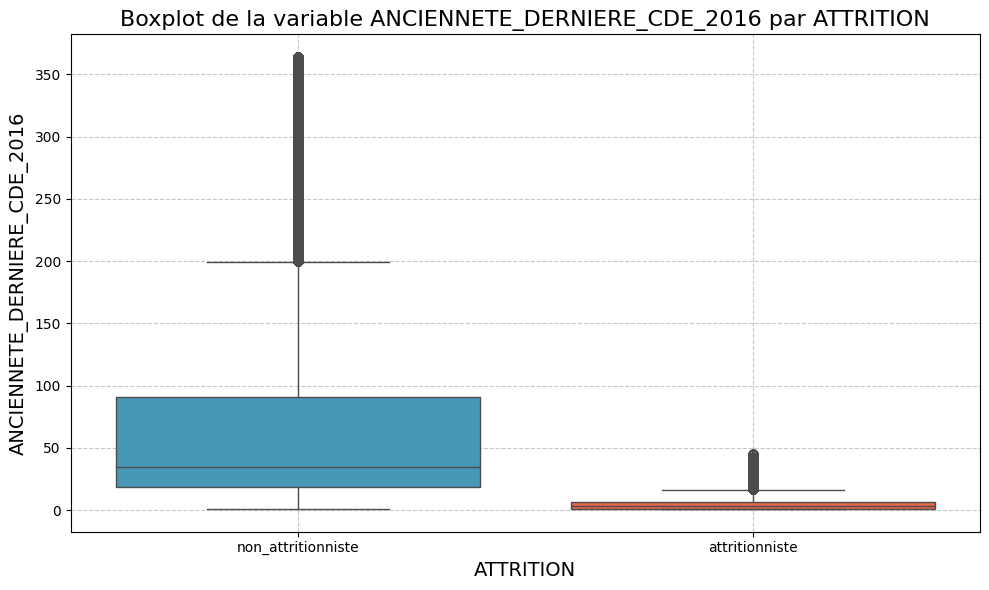

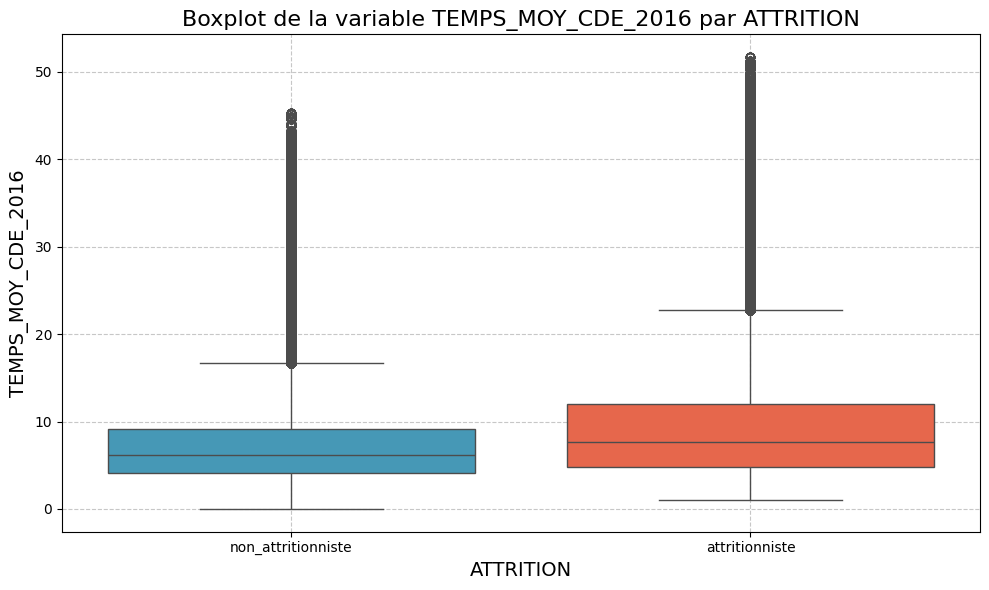

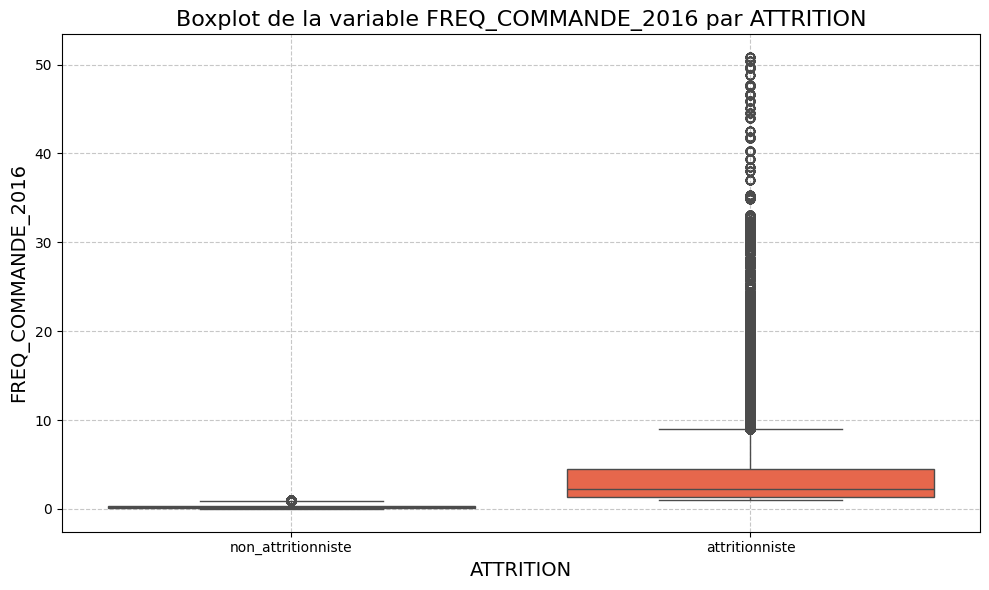

In [66]:
# Importer les librairies nécessaires
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Définition des variables quantitatives
var_quan = X_BOTANIC.select_dtypes(include=['int64','float64']).columns.tolist()

# Configuration d'une palette de couleurs définie (deux couleurs pour deux catégories)
palette = ['#33A1C9', '#FF5733'] # Par exemple bleu et rouge

# Générer un box plot pour chaque variable quantitative
for var in var_quan:
    plt.figure(figsize=(10, 6))
    
    # Création du boxplot en utilisant une palette définie
    sns.boxplot(x='ATTRITION', y=var, data=df_BOTANIC_F, hue='ATTRITION', palette=palette, showfliers=True, legend=False)
    
    # Ajout de titre et étiquettes avec descriptions
    plt.title(f'Boxplot de la variable {var} par ATTRITION', fontsize=16)
    plt.xlabel('ATTRITION', fontsize=14)
    plt.ylabel(var, fontsize=14)
    
    # Ajouter une grille pour plus de lisibilité
    plt.grid(True, linestyle='--', alpha=0.7)
    
    # Ajustement de la mise en page
    plt.tight_layout()
    
    # Affichage du graphique
    plt.show()

In [67]:
X_BOTANIC.columns

Index(['MAGASIN', 'SEXE', 'AGE_GROUP', 'ANCIENNETE_ADHESION_CAT',
       'ANCIENNETE_READ', 'LIBELLEDEPARTEMENT', 'TIC_TOTALTTC', 'FREQ_MAG',
       'TYPE_UNIVERS', 'Quantite', 'NBRE_ARTICLE', 'NBRE_FAM_ARTICLE',
       'TOTAL_REMISE', 'Variete_Panier', 'UNIVERS_PREFERE', 'TOTAL_ACHAT_2016',
       'ANCIENNETE_1ERE_CDE_2016', 'ANCIENNETE_DERNIERE_CDE_2016',
       'TEMPS_MOY_CDE_2016', 'FREQ_COMMANDE_2016'],
      dtype='object')

In [68]:
#les colonnes restantes dans `X_BOTANIC`
remaining_columns = X_BOTANIC.columns

In [69]:
#Ajout de la colonne cible 'ATTRITION' à la liste des colonnes
remaining_columns = list(remaining_columns) + ['ATTRITION']

In [70]:
#Filtrage du DataFrame d'origine `df_BOTANIC_F` en utilisant les colonnes restant
df_BOTANIC_F = df_BOTANIC_F[remaining_columns]

In [71]:
df_BOTANIC_F.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7408792 entries, 0 to 7408791
Data columns (total 21 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   MAGASIN                       object 
 1   SEXE                          object 
 2   AGE_GROUP                     object 
 3   ANCIENNETE_ADHESION_CAT       object 
 4   ANCIENNETE_READ               object 
 5   LIBELLEDEPARTEMENT            int64  
 6   TIC_TOTALTTC                  float64
 7   FREQ_MAG                      int64  
 8   TYPE_UNIVERS                  object 
 9   Quantite                      float64
 10  NBRE_ARTICLE                  int64  
 11  NBRE_FAM_ARTICLE              int64  
 12  TOTAL_REMISE                  float64
 13  Variete_Panier                int64  
 14  UNIVERS_PREFERE               int32  
 15  TOTAL_ACHAT_2016              float64
 16  ANCIENNETE_1ERE_CDE_2016      int64  
 17  ANCIENNETE_DERNIERE_CDE_2016  float64
 18  TEMPS_MOY_CDE_2016    

In [72]:
df_BOTANIC_F

,MAGASIN,SEXE,AGE_GROUP,ANCIENNETE_ADHESION_CAT,ANCIENNETE_READ,LIBELLEDEPARTEMENT,TIC_TOTALTTC,FREQ_MAG,TYPE_UNIVERS,Quantite,...,NBRE_FAM_ARTICLE,TOTAL_REMISE,Variete_Panier,UNIVERS_PREFERE,TOTAL_ACHAT_2016,ANCIENNETE_1ERE_CDE_2016,ANCIENNETE_DERNIERE_CDE_2016,TEMPS_MOY_CDE_2016,FREQ_COMMANDE_2016,ATTRITION
0,PRI,FEMME,Inconnue,8 ans+,6-8 mois,69,11.21,31,UNIVERS_U1,2.0,...,1,1.650,6,0,1936.76,346,41.0,5.169492,0.126085,non_attritionniste
1,PRI,FEMME,Inconnue,8 ans+,6-8 mois,69,11.21,31,UNIVERS_U2,2.0,...,1,1.650,6,0,1936.76,346,41.0,5.169492,0.126085,non_attritionniste
2,PRI,FEMME,Inconnue,8 ans+,6-8 mois,69,11.21,31,UNIVERS_U3,2.0,...,1,1.650,6,0,1936.76,346,41.0,5.169492,0.126085,non_attritionniste
3,PRI,FEMME,Inconnue,8 ans+,6-8 mois,69,11.21,31,UNIVERS_U4,2.0,...,1,1.650,6,0,1936.76,346,41.0,5.169492,0.126085,non_attritionniste
4,PRI,FEMME,Inconnue,8 ans+,6-8 mois,69,28.55,31,UNIVERS_U1,3.0,...,2,0.000,6,0,1936.76,346,41.0,5.169492,0.126085,non_attritionniste
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408787,MUL,FEMME,AGE DE 61-100,8 ans+,0-4 mois,68,29.47,9,UNIVERS_U4,15.0,...,2,5.434,6,0,1739.20,261,23.0,21.636364,0.940711,non_attritionniste
7408788,MUL,FEMME,AGE DE 61-100,8 ans+,0-4 mois,68,151.39,9,UNIVERS_U1,10.0,...,1,0.333,6,0,1739.20,261,23.0,21.636364,0.940711,non_attritionniste
7408789,MUL,FEMME,AGE DE 61-100,8 ans+,0-4 mois,68,151.39,9,UNIVERS_U2,10.0,...,1,0.333,6,0,1739.20,261,23.0,21.636364,0.940711,non_attritionniste
7408790,MUL,FEMME,AGE DE 61-100,8 ans+,0-4 mois,68,151.39,9,UNIVERS_U3,10.0,...,1,0.333,6,0,1739.20,261,23.0,21.636364,0.940711,non_attritionniste


In [73]:
BOTANIC_ANALYSES="C:\\Users\\belga\\OneDrive\\Bureau\\EMBA Big Data\\Module Datascience\\Projet Data Science S2 2024\\BOTANIC ANALYSES.pkl"
df_BOTANIC_F.to_pickle(BOTANIC_ANALYSES)